# Libraries

In [ ]:
!pip install geopandas folium matplotlib geodatasets pmdarima prophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 5.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import re

from math import sqrt

import geopandas as gpd
from shapely.geometry import Point
from geodatasets import get_path

import folium
from folium.plugins import MarkerCluster
from branca.colormap import linear

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
import seaborn as sns

from IPython.display import display, HTML

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

import numpy as np
from sklearn.preprocessing import StandardScaler

from sklearn.impute import KNNImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error

from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from prophet import Prophet

# Import dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset of pollutants in borough

In [ ]:
blackcarbon_borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/BC_borough.csv'
df_blackcarbon_borough = pd.read_csv(blackcarbon_borough_path)

In [ ]:
NO2_borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/NO2_borough.csv'
df_NO2_borough = pd.read_csv(NO2_borough_path)

In [ ]:
NO_borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/NO_borough.csv'
df_NO_borough = pd.read_csv(NO_borough_path)

In [ ]:
O3_borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/O3_borough.csv'
df_O3_borough = pd.read_csv(O3_borough_path)

In [ ]:
PM25_borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/PM2.5_borough.csv'
df_PM25_borough = pd.read_csv(PM25_borough_path)

## Dataset of pollutants in neighborhoods

In [ ]:
blackcarbon_UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/BC_UHF42.csv'
df_blackcarbon_UHF42 = pd.read_csv(blackcarbon_UHF42_path)

In [ ]:
NO2_UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/NO2_UHF42.csv'
df_NO2_UHF42 = pd.read_csv(NO2_UHF42_path)

In [ ]:
NO_UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/NO_UHF42.csv'
df_NO_UHF42 = pd.read_csv(NO_UHF42_path)

In [ ]:
O3_UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/O3_UHF42.csv'
df_O3_UHF42 = pd.read_csv(O3_UHF42_path)

In [ ]:
PM25_UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/PM25_UHF42.csv'
df_PM25_UHF42 = pd.read_csv(PM25_UHF42_path)

## Air quality dataset

In [ ]:
airquality_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air_Quality.csv"
df_aq = pd.read_csv(airquality_path)

In [ ]:
airquality2_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/newyork_airquality.csv"

## Health dataset

In [ ]:
borough_poverty_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/borough_poverty.csv"
borough_poverty = pd.read_csv(borough_poverty_path)

In [ ]:
healthinsurance_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/healthinsurance.csv"
healthinsurance = pd.read_csv(healthinsurance_path)

### Emergency

In [ ]:
asthmaemergency_ozone_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/asthmaemergency_ozone.csv"
asthma_ozone = pd.read_csv(asthmaemergency_ozone_path)

In [ ]:
asthmaemergency_pm_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/asthmaemergency_pm.csv"
asthma_pm = pd.read_csv(asthmaemergency_pm_path)

### Death

In [ ]:
death_ozone_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/deathsOzone.csv"
deaths_ozone = pd.read_csv(death_ozone_path)

In [ ]:
death_pm_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/deathsPM25.csv"
deaths_pm = pd.read_csv(death_pm_path)

### Hospitalization

In [ ]:
hosp_ozone_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/Asthmahospitalizations_Ozone.csv"
hosp_ozone = pd.read_csv(hosp_ozone_path)

In [ ]:
hosp_cv_pm25_40_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/Cardiovascularhospitalizations_PM25age40.csv"
hosp_cv_pm25_40 = pd.read_csv(hosp_cv_pm25_40_path)

In [ ]:
hosp_r_pm25_20_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Health/Respiratoryhospitalizations_PM25age20.csv"
hosp_r_pm25_20 = pd.read_csv(hosp_r_pm25_20_path)

# Import maps

In [ ]:
colors = {
    'Staten Island': 'seagreen',
    'Brooklyn': 'orange',
    'Queens': 'indianred',
    'Manhattan': 'royalblue',
    'Bronx': 'orchid'
}

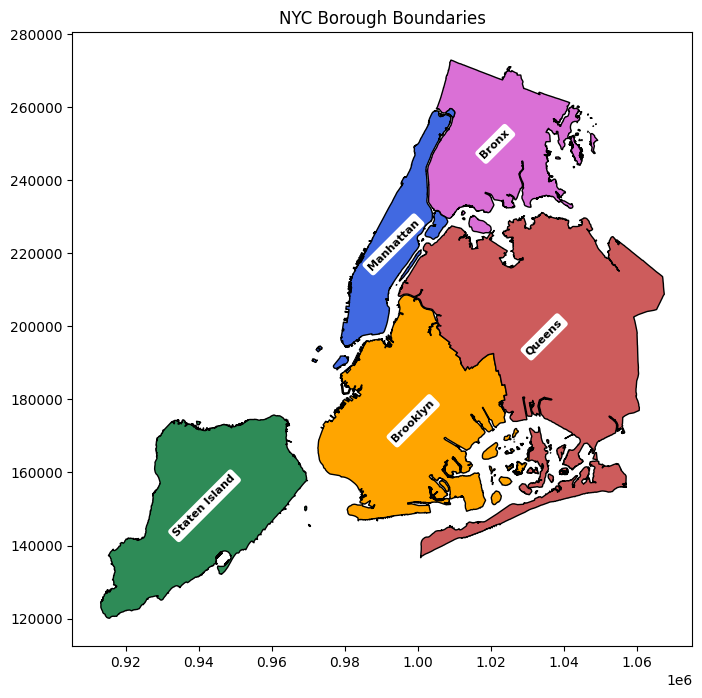

In [ ]:
NYC_Borough_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Maps/NYC_Borough_Boundary.geojson'
gdf_borough = gpd.read_file(NYC_Borough_path)

gdf_borough['color'] = gdf_borough['BoroName'].map(colors)

fig, ax = plt.subplots(figsize=(8, 8))

for borough, data in gdf_borough.groupby('BoroName'):
    data.plot(ax=ax, color=data['color'].iloc[0], label=borough, edgecolor='black')
    centroid = data.geometry.centroid.iloc[0]
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    ax.annotate(borough, xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold', color='black', rotation=45,
                bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

plt.title('NYC Borough Boundaries')
plt.show()

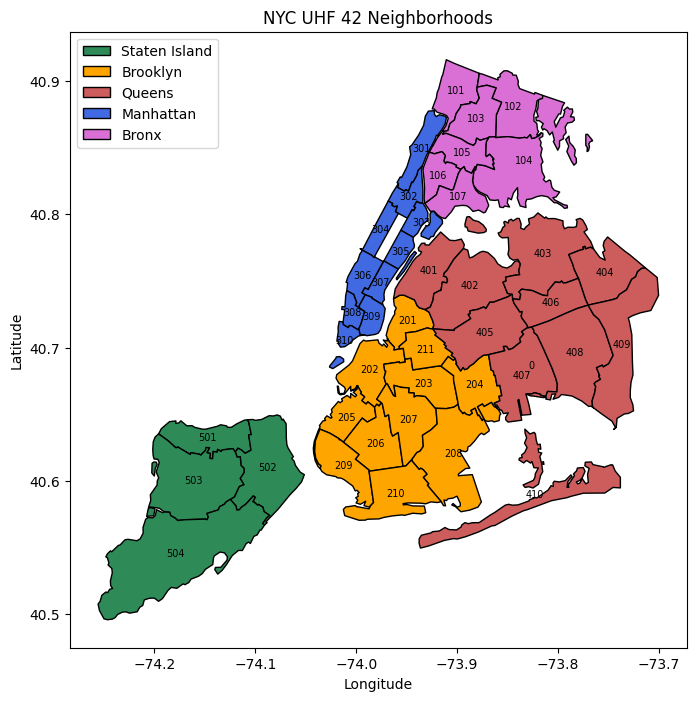

In [ ]:
UHF42_path = '/content/drive/MyDrive/DS Lab on Smart Cities/Maps/UHF42.geojson'
gdf_UHF42 = gpd.read_file(UHF42_path)

fig, ax = plt.subplots(figsize=(8, 8))

for borough, color in colors.items():
    subset = gdf_UHF42[gdf_UHF42['BOROUGH'] == borough]
    subset.plot(ax=ax, color=color, edgecolor='black', label=borough)

for idx, row in gdf_UHF42.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, str(row['id']), fontsize=7, ha='center', va='center')

ax.set_title('NYC UHF 42 Neighborhoods')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

legend_elements = [Patch(facecolor=color, edgecolor='black', label=borough) for borough, color in colors.items()]
ax.legend(handles=legend_elements, loc='upper left')

plt.show()

In [ ]:
m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

folium.TileLayer('openstreetmap').add_to(m)

for borough, color in colors.items():
    subset = gdf_UHF42[gdf_UHF42['BOROUGH'] == borough]
    for idx, row in subset.iterrows():
        folium.GeoJson(row['geometry'],
                       style_function=lambda x, color=color: {'fillColor': color, 'color': 'black', 'fillOpacity': 0.7}).add_to(m)

for idx, row in gdf_UHF42.iterrows():
    centroid = row['geometry'].centroid
    folium.Marker(location=[centroid.y, centroid.x], icon=folium.DivIcon(html=f"<div style='font-size: 7pt;'>{row['id']}</div>")).add_to(m)
m

# Analysis by borough

**Black Carbon**

In [ ]:
print(df_blackcarbon_borough.head())
print('\n')
print(df_blackcarbon_borough.describe())
print('\n')
print(df_blackcarbon_borough.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography  \
0  Winter 2020-21     Borough      1        1          Bronx   
1  Winter 2020-21     Borough      2        1       Brooklyn   
2  Winter 2020-21     Borough      3        1      Manhattan   
3  Winter 2020-21     Borough      4        1         Queens   
4  Winter 2020-21     Borough      5        1  Staten Island   

   10th percentile absorbance units  90th percentile absorbance units  \
0                               0.6                               0.8   
1                               0.5                               0.8   
2                               0.6                               0.9   
3                               0.5                               0.7   
4                               0.5                               0.6   

   Mean absorbance units  
0                    0.7  
1                    0.6  
2                    0.8  
3                    0.6  
4                    0.6  


            

**NO2**

In [ ]:
print(df_NO2_borough.head())
print('\n')
print(df_NO2_borough.describe())
print('\n')
print(df_NO2_borough.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography  \
0  Winter 2021-22     Borough      1        1          Bronx   
1  Winter 2021-22     Borough      2        1       Brooklyn   
2  Winter 2021-22     Borough      3        1      Manhattan   
3  Winter 2021-22     Borough      4        1         Queens   
4  Winter 2021-22     Borough      5        1  Staten Island   

   10th percentile ppb  90th percentile ppb  Mean ppb  
0                 19.7                 23.7      21.8  
1                 18.7                 24.0      21.2  
2                 20.9                 27.2      23.4  
3                 17.5                 22.6      20.1  
4                 13.5                 19.1      16.4  


            GeoID  GeoRank  10th percentile ppb  90th percentile ppb  \
count  210.000000    210.0           210.000000           210.000000   
mean     3.000000      1.0            15.856667            23.556667   
std      1.417593      0.0             5.612561             6

**NO**

In [ ]:
print(df_NO_borough.head())
print('\n')
print(df_NO_borough.describe())
print('\n')
print(df_NO_borough.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography  \
0  Winter 2021-22     Borough      1        1          Bronx   
1  Winter 2021-22     Borough      2        1       Brooklyn   
2  Winter 2021-22     Borough      3        1      Manhattan   
3  Winter 2021-22     Borough      4        1         Queens   
4  Winter 2021-22     Borough      5        1  Staten Island   

   10th percentile ppb  90th percentile ppb  Mean ppb  
0                 13.2                 21.4      16.7  
1                 13.7                 23.4      17.7  
2                 16.2                 23.3      19.5  
3                 12.8                 20.3      15.9  
4                 10.9                 14.6      12.5  


            GeoID  GeoRank  10th percentile ppb  90th percentile ppb  \
count  210.000000    210.0           210.000000           210.000000   
mean     3.000000      1.0            13.219524            22.582857   
std      1.417593      0.0             7.796653            13

**O3**

In [ ]:
print(df_O3_borough.head())
print('\n')
print(df_O3_borough.describe())
print('\n')
print(df_O3_borough.isnull().sum())

    TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography  \
0  Summer 2022     Borough      1        1          Bronx   
1  Summer 2022     Borough      2        1       Brooklyn   
2  Summer 2022     Borough      3        1      Manhattan   
3  Summer 2022     Borough      4        1         Queens   
4  Summer 2022     Borough      5        1  Staten Island   

   10th percentile ppb  90th percentile ppb  Mean ppb  
0                 30.2                 34.1      32.2  
1                 32.2                 37.0      34.7  
2                 27.7                 32.1      30.2  
3                 32.6                 36.1      34.5  
4                 32.6                 37.5      35.3  


           GeoID  GeoRank  10th percentile ppb  90th percentile ppb   Mean ppb
count  70.000000     70.0            70.000000            70.000000  70.000000
mean    3.000000      1.0            28.364286            32.952857  30.715714
std     1.424425      0.0             3.343349            

**PM 2.5**

In [ ]:
print(df_PM25_borough.head())
print('\n')
print(df_PM25_borough.describe())
print('\n')
print(df_PM25_borough.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography  \
0  Winter 2021-22     Borough      1        1          Bronx   
1  Winter 2021-22     Borough      2        1       Brooklyn   
2  Winter 2021-22     Borough      3        1      Manhattan   
3  Winter 2021-22     Borough      4        1         Queens   
4  Winter 2021-22     Borough      5        1  Staten Island   

   10th percentile mcg/m3  90th percentile mcg/m3  Mean mcg/m3  
0                     6.9                     7.6          7.3  
1                     6.4                     7.5          6.9  
2                     6.8                     9.9          7.9  
3                     6.2                     7.3          6.7  
4                     5.6                     6.5          6.1  


            GeoID  GeoRank  10th percentile mcg/m3  90th percentile mcg/m3  \
count  210.000000    210.0              210.000000              210.000000   
mean     3.000000      1.0                8.229048               10

### Heatmap by borough

In [ ]:
bc2021 = df_blackcarbon_borough[df_blackcarbon_borough['TimePeriod'] == 'Annual Average 2021']
NO2_2022 = df_NO2_borough[df_NO2_borough['TimePeriod'] == 'Annual Average 2022']
NO_2022 = df_NO_borough[df_NO_borough['TimePeriod'] == 'Annual Average 2022']
pm25_2022 = df_PM25_borough[df_PM25_borough['TimePeriod'] == 'Annual Average 2022']
O3_2022 = df_O3_borough[df_O3_borough['TimePeriod'] == 'Summer 2022']

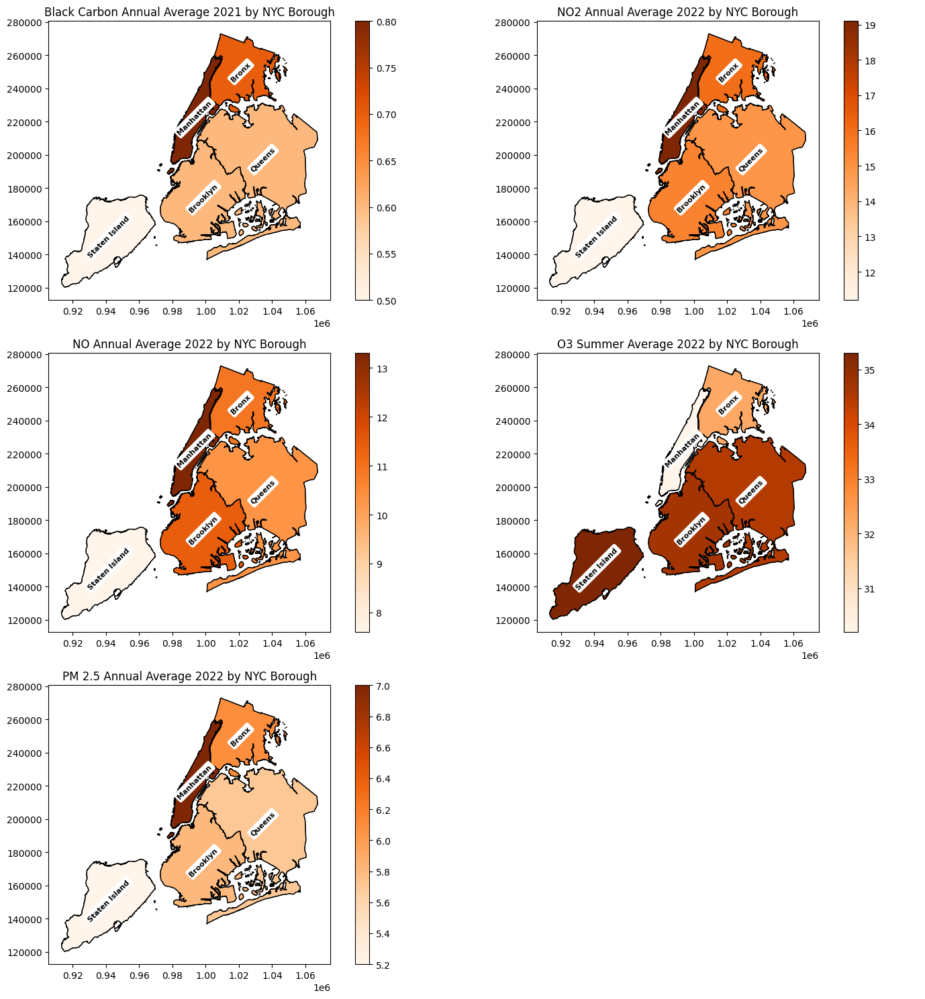

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

# Black carbon
gdf = gdf_borough.merge(bc2021[['Geography', 'Mean absorbance units']], left_on='BoroName', right_on='Geography')
gdf.boundary.plot(ax=axs[0, 0], linewidth=1, color='black')
gdf.plot(column='Mean absorbance units', cmap='Oranges', linewidth=0.8, ax=axs[0, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    axs[0, 0].annotate(row['BoroName'], xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold', color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))
axs[0, 0].set_title('Black Carbon Annual Average 2021 by NYC Borough')

# NO2
gdf = gdf_borough.merge(NO2_2022[['Geography', 'Mean ppb']], left_on='BoroName', right_on='Geography')
gdf.boundary.plot(ax=axs[0, 1], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Oranges', linewidth=0.8, ax=axs[0, 1], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    axs[0, 1].annotate(row['BoroName'], xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold', color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))
axs[0, 1].set_title('NO2 Annual Average 2022 by NYC Borough')

# NO
gdf = gdf_borough.merge(NO_2022[['Geography', 'Mean ppb']], left_on='BoroName', right_on='Geography')
gdf.boundary.plot(ax=axs[1, 0], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Oranges', linewidth=0.8, ax=axs[1, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    axs[1, 0].annotate(row['BoroName'], xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold', color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))
axs[1, 0].set_title('NO Annual Average 2022 by NYC Borough')

# O3
gdf = gdf_borough.merge(O3_2022[['Geography', 'Mean ppb']], left_on='BoroName', right_on='Geography')
gdf.boundary.plot(ax=axs[1, 1], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Oranges', linewidth=0.8, ax=axs[1, 1], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    axs[1, 1].annotate(row['BoroName'], xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold', color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))
axs[1, 1].set_title('O3 Summer Average 2022 by NYC Borough')

# PM 2.5
gdf = gdf_borough.merge(pm25_2022[['Geography', 'Mean mcg/m3']], left_on='BoroName', right_on='Geography')
gdf.boundary.plot(ax=axs[2, 0], linewidth=1, color='black')
gdf.plot(column='Mean mcg/m3', cmap='Oranges', linewidth=0.8, ax=axs[2, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    x, y = centroid.x, centroid.y
    dx, dy = -0.1, -0.1
    axs[2, 0].annotate(row['BoroName'], xy=(x, y), xytext=(dx, dy), textcoords='offset points',
                       ha='center', va='center', fontsize=8, fontweight='bold',  color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))
axs[2, 0].set_title('PM 2.5 Annual Average 2022 by NYC Borough')

axs[2, 1].axis('off')

plt.tight_layout()
plt.show()

## Analysis by neighborhood (UHF42)

**Black Carbon**

In [ ]:
print(df_blackcarbon_UHF42.head())
print('\n')
print(df_blackcarbon_UHF42.describe())
print('\n')
print(df_blackcarbon_UHF42.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank                Geography  \
0  Winter 2020-21      UHF 42    101        4  Kingsbridge - Riverdale   
1  Winter 2020-21      UHF 42    102        4          Northeast Bronx   
2  Winter 2020-21      UHF 42    103        4       Fordham - Bronx Pk   
3  Winter 2020-21      UHF 42    104        4     Pelham - Throgs Neck   
4  Winter 2020-21      UHF 42    105        4         Crotona -Tremont   

   10th percentile absorbance units  90th percentile absorbance units  \
0                               0.6                               0.7   
1                               0.6                               0.7   
2                               0.6                               0.7   
3                               0.6                               0.8   
4                               0.7                               0.8   

   Mean absorbance units  
0                    0.6  
1                    0.6  
2                    0.6  
3       

**NO2**

In [ ]:
print(df_NO2_UHF42.head())
print('\n')
print(df_NO2_UHF42.describe())
print('\n')
print(df_NO2_UHF42.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank                Geography  \
0  Winter 2021-22      UHF 42    101        4  Kingsbridge - Riverdale   
1  Winter 2021-22      UHF 42    102        4          Northeast Bronx   
2  Winter 2021-22      UHF 42    103        4       Fordham - Bronx Pk   
3  Winter 2021-22      UHF 42    104        4     Pelham - Throgs Neck   
4  Winter 2021-22      UHF 42    105        4         Crotona -Tremont   

   10th percentile ppb  90th percentile ppb  Mean ppb  
0                 18.8                 21.3      19.8  
1                 20.6                 22.4      21.3  
2                 20.0                 21.8      21.1  
3                 20.0                 23.5      21.8  
4                 21.3                 23.6      22.4  


             GeoID  GeoRank  10th percentile ppb  90th percentile ppb  \
count  1008.000000   1008.0          1008.000000          1008.000000   
mean    288.428571      4.0            16.601786            20.599702  

**NO**

In [ ]:
print(df_NO_UHF42.head())
print('\n')
print(df_NO_UHF42.describe())
print('\n')
print(df_NO_UHF42.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank                Geography  \
0  Winter 2021-22      UHF 42    101        4  Kingsbridge - Riverdale   
1  Winter 2021-22      UHF 42    102        4          Northeast Bronx   
2  Winter 2021-22      UHF 42    103        4       Fordham - Bronx Pk   
3  Winter 2021-22      UHF 42    104        4     Pelham - Throgs Neck   
4  Winter 2021-22      UHF 42    105        4         Crotona -Tremont   

   10th percentile ppb 90th percentile ppb Mean ppb  
0                 12.7                16.5     14.3  
1                 13.3                16.6     14.7  
2                 13.0                17.0     15.3  
3                 13.0                21.0     16.3  
4                 15.4                20.8     17.9  


             GeoID  GeoRank  10th percentile ppb
count  1764.000000   1764.0          1764.000000
mean    288.428571      4.0            15.109694
std     123.132069      0.0             8.875369
min     101.000000      4.0      

**O3**

In [ ]:
print(df_O3_UHF42.head())
print('\n')
print(df_O3_UHF42.describe())
print('\n')
print(df_O3_UHF42.isnull().sum())

    TimePeriod GeoTypeDesc  GeoID  GeoRank                Geography  \
0  Summer 2022      UHF 42    101        4  Kingsbridge - Riverdale   
1  Summer 2022      UHF 42    102        4          Northeast Bronx   
2  Summer 2022      UHF 42    103        4       Fordham - Bronx Pk   
3  Summer 2022      UHF 42    104        4     Pelham - Throgs Neck   
4  Summer 2022      UHF 42    105        4         Crotona -Tremont   

   10th percentile ppb  90th percentile ppb  Mean ppb  
0                 28.3                 31.4      30.0  
1                 30.9                 33.3      32.2  
2                 30.1                 32.9      31.7  
3                 31.6                 34.9      33.3  
4                 29.8                 32.7      31.4  


            GeoID  GeoRank  10th percentile ppb  90th percentile ppb  \
count  588.000000    588.0           588.000000           588.000000   
mean   288.428571      4.0            28.978912            31.894728   
std    123.201971  

**PM 2.5**

In [ ]:
print(df_PM25_UHF42.head())
print('\n')
print(df_PM25_UHF42.describe())
print('\n')
print(df_PM25_UHF42.isnull().sum())

       TimePeriod GeoTypeDesc  GeoID  GeoRank                Geography  \
0  Winter 2021-22      UHF 42    101        4  Kingsbridge - Riverdale   
1  Winter 2021-22      UHF 42    102        4          Northeast Bronx   
2  Winter 2021-22      UHF 42    103        4       Fordham - Bronx Pk   
3  Winter 2021-22      UHF 42    104        4     Pelham - Throgs Neck   
4  Winter 2021-22      UHF 42    105        4         Crotona -Tremont   

   10th percentile mcg/m3  90th percentile mcg/m3  Mean mcg/m3  
0                     7.1                     7.4          7.2  
1                     7.2                     7.5          7.3  
2                     7.2                     7.5          7.4  
3                     6.9                     7.7          7.2  
4                     7.0                     7.6          7.3  


             GeoID  GeoRank  10th percentile mcg/m3  90th percentile mcg/m3  \
count  1008.000000   1008.0             1008.000000             1008.000000   
mean 

### Heatmap by neighborhood

In [ ]:
bc2021 = df_blackcarbon_UHF42[df_blackcarbon_UHF42['TimePeriod'] == 'Annual Average 2021']
NO2_2022 = df_NO2_UHF42[df_NO2_UHF42['TimePeriod'] == 'Annual Average 2022']
NO_2022 = df_NO_UHF42[df_NO_UHF42['TimePeriod'] == 'Annual Average 2022']
pm25_2022 = df_PM25_UHF42[df_PM25_UHF42['TimePeriod'] == 'Annual Average 2022']
O3_2022 = df_O3_UHF42[df_O3_UHF42['TimePeriod'] == 'Summer 2022']

In [ ]:
NO_2022.loc[:, 'Mean ppb'] = pd.to_numeric(NO_2022['Mean ppb'], errors='coerce')

In [ ]:
print(NO_2022['Mean ppb'].dtype)

object


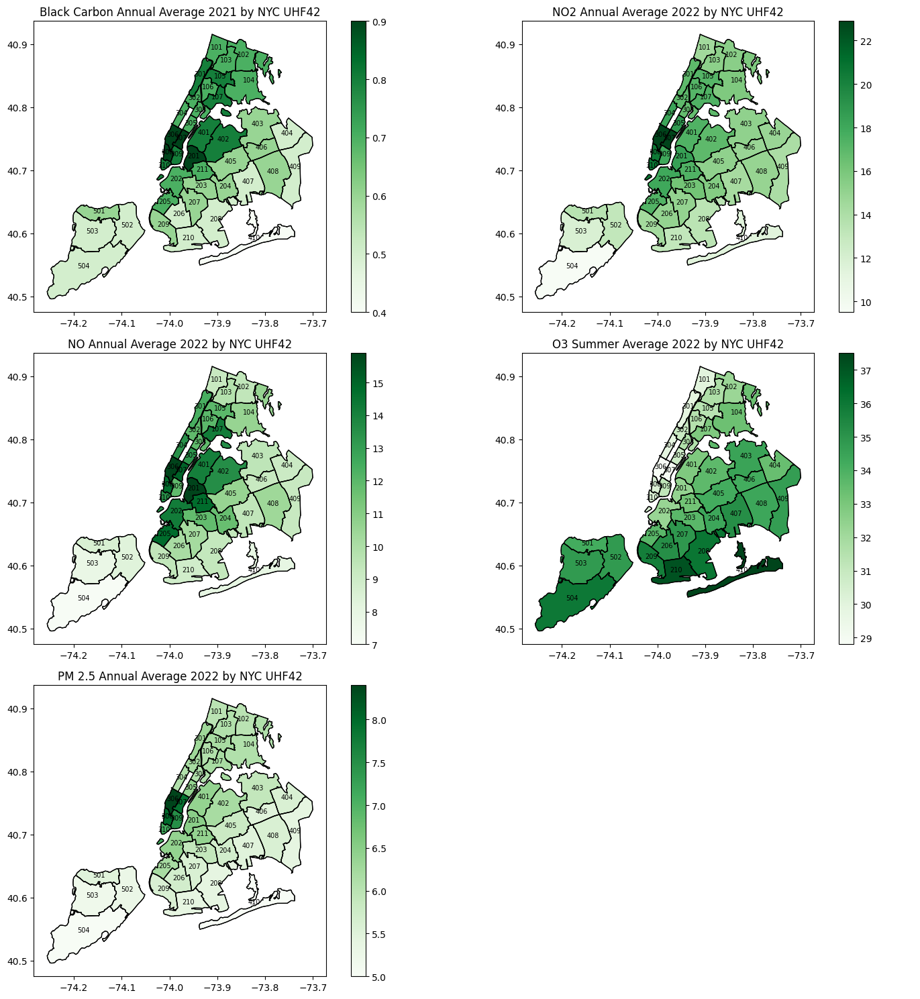

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

# Black carbon
gdf = gdf_UHF42.merge(bc2021[['GeoID', 'Mean absorbance units']], left_on='GEOCODE', right_on='GeoID')
gdf.boundary.plot(ax=axs[0, 0], linewidth=1, color='black')
gdf.plot(column='Mean absorbance units', cmap='Greens', linewidth=0.8, ax=axs[0, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    axs[0, 0].annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=7, color='black')
axs[0, 0].set_title('Black Carbon Annual Average 2021 by NYC UHF42')

# NO2
gdf = gdf_UHF42.merge(NO2_2022[['GeoID', 'Mean ppb']], left_on='GEOCODE', right_on='GeoID')
gdf.boundary.plot(ax=axs[0, 1], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Greens', linewidth=0.8, ax=axs[0, 1], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    axs[0, 1].annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=7, color='black')
axs[0, 1].set_title('NO2 Annual Average 2022 by NYC UHF42')

# NO
gdf = gdf_UHF42.merge(NO_2022[['GeoID', 'Mean ppb']], left_on='GEOCODE', right_on='GeoID')
gdf.boundary.plot(ax=axs[1, 0], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Greens', linewidth=0.8, ax=axs[1, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    axs[1, 0].annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=7, color='black')
axs[1, 0].set_title('NO Annual Average 2022 by NYC UHF42')

# O3
gdf = gdf_UHF42.merge(O3_2022[['GeoID', 'Mean ppb']], left_on='GEOCODE', right_on='GeoID')
gdf.boundary.plot(ax=axs[1, 1], linewidth=1, color='black')
gdf.plot(column='Mean ppb', cmap='Greens', linewidth=0.8, ax=axs[1, 1], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    axs[1, 1].annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=7, color='black')
axs[1, 1].set_title('O3 Summer Average 2022 by NYC UHF42')

# PM 2.5
gdf = gdf_UHF42.merge(pm25_2022[['GeoID', 'Mean mcg/m3']], left_on='GEOCODE', right_on='GeoID')
gdf.boundary.plot(ax=axs[2, 0], linewidth=1, color='black')
gdf.plot(column='Mean mcg/m3', cmap='Greens', linewidth=0.8, ax=axs[2, 0], edgecolor='black', legend=True)
for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    axs[2, 0].annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=7, color='black')
axs[2, 0].set_title('PM 2.5 Annual Average 2022 by NYC UHF42')

axs[2, 1].axis('off')

plt.tight_layout()
plt.show()

## Distribution of pollutants over time

In [ ]:
df_blackcarbon_annual = df_blackcarbon_borough[df_blackcarbon_borough['TimePeriod'].str.contains('Annual Average')]
df_NO2_annual = df_NO2_borough[df_NO2_borough['TimePeriod'].str.contains('Annual Average')]
df_NO_annual = df_NO_borough[df_NO_borough['TimePeriod'].str.contains('Annual Average')]
df_PM25_annual = df_PM25_borough[df_PM25_borough['TimePeriod'].str.contains('Annual Average')]

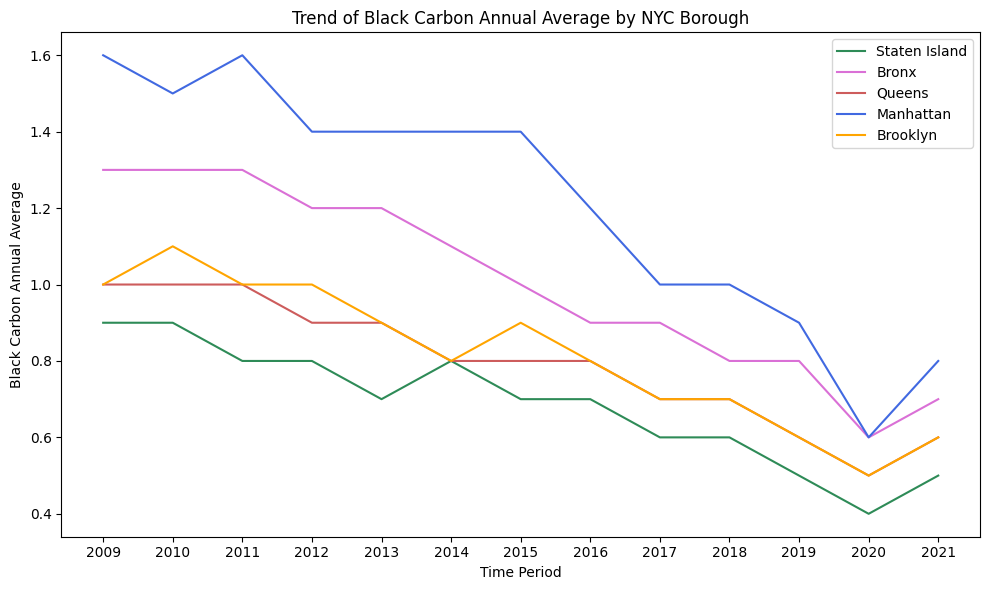

In [ ]:
df_blackcarbon_sorted = df_blackcarbon_annual.sort_values(by='TimePeriod')
fig, ax = plt.subplots(figsize=(10, 6))
for borough in df_blackcarbon_sorted['Geography'].unique():
    df_borough = df_blackcarbon_sorted[df_blackcarbon_sorted['Geography'] == borough]
    ax.plot(df_borough['TimePeriod'], df_borough['Mean absorbance units'], label=borough, color=colors[borough])
ax.set_title('Trend of Black Carbon Annual Average by NYC Borough')
ax.set_xlabel('Time Period')
ax.set_ylabel('Black Carbon Annual Average')
ax.legend()
years = df_blackcarbon_sorted['TimePeriod'].str.extract(r'(\d{4})')[0].unique()
ax.set_xticks(df_blackcarbon_sorted['TimePeriod'].unique())
ax.set_xticklabels(years)
plt.tight_layout()
plt.show()

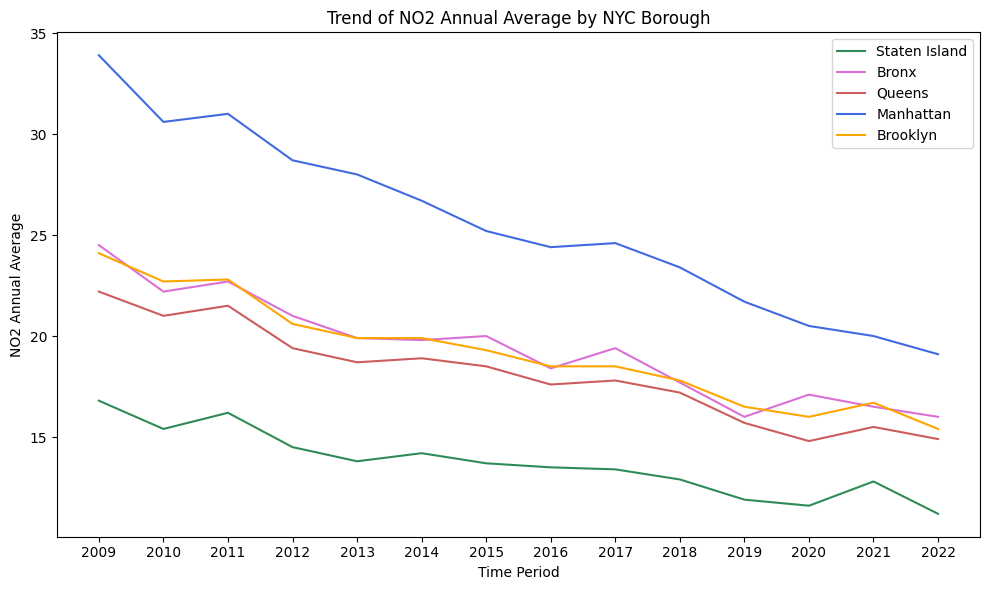

In [ ]:
df_NO2_sorted = df_NO2_annual.sort_values(by='TimePeriod')
fig, ax = plt.subplots(figsize=(10, 6))
for borough in df_NO2_sorted['Geography'].unique():
    df_borough = df_NO2_sorted[df_NO2_sorted['Geography'] == borough]
    ax.plot(df_borough['TimePeriod'], df_borough['Mean ppb'], label=borough, color=colors[borough])
ax.set_title('Trend of NO2 Annual Average by NYC Borough')
ax.set_xlabel('Time Period')
ax.set_ylabel('NO2 Annual Average')
ax.legend()
years = df_NO2_sorted['TimePeriod'].str.extract(r'(\d{4})')[0].unique()
ax.set_xticks(df_NO2_sorted['TimePeriod'].unique())
ax.set_xticklabels(years)
plt.tight_layout()
plt.show()

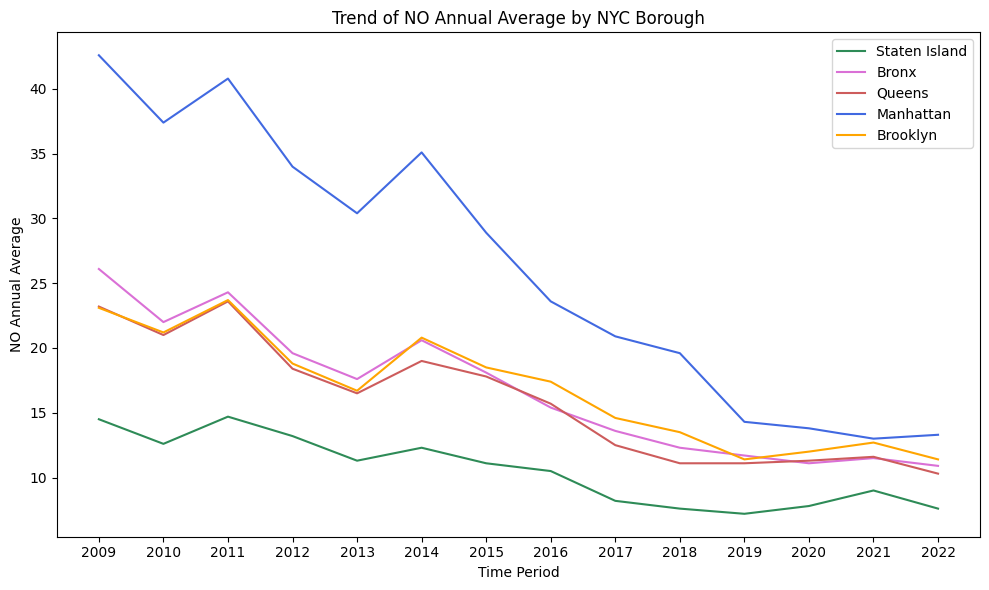

In [ ]:
df_NO_sorted = df_NO_annual.sort_values(by='TimePeriod')
fig, ax = plt.subplots(figsize=(10, 6))
for borough in df_NO_sorted['Geography'].unique():
    df_borough = df_NO_sorted[df_NO_sorted['Geography'] == borough]
    ax.plot(df_borough['TimePeriod'], df_borough['Mean ppb'], label=borough, color=colors[borough])
ax.set_title('Trend of NO Annual Average by NYC Borough')
ax.set_xlabel('Time Period')
ax.set_ylabel('NO Annual Average')
ax.legend()
years = df_NO_sorted['TimePeriod'].str.extract(r'(\d{4})')[0].unique()
ax.set_xticks(df_NO_sorted['TimePeriod'].unique())
ax.set_xticklabels(years)
plt.tight_layout()
plt.show()

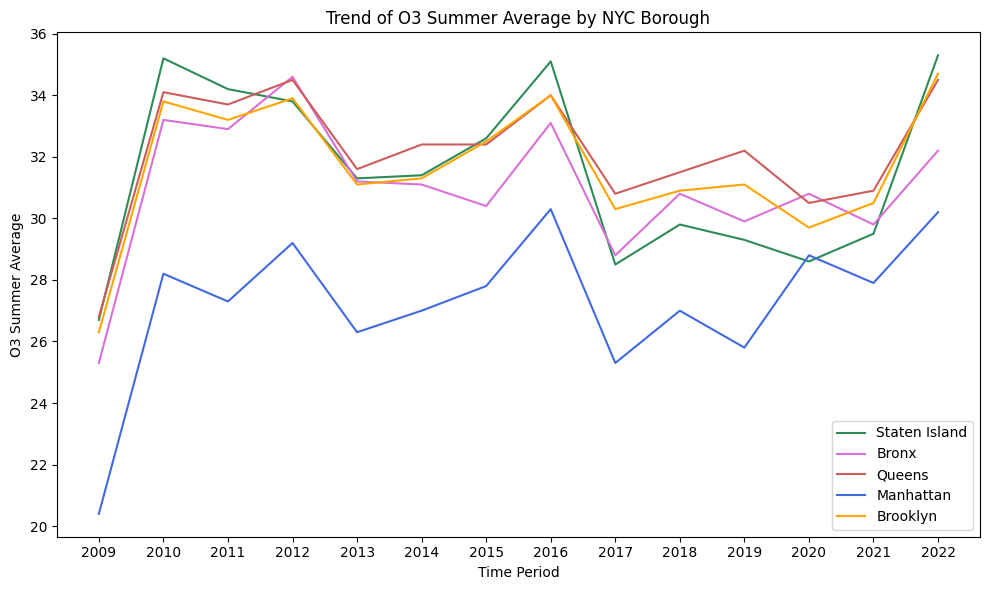

In [ ]:
df_O3_sorted = df_O3_borough.sort_values(by='TimePeriod')
fig, ax = plt.subplots(figsize=(10, 6))
for borough in df_O3_sorted['Geography'].unique():
    df_borough = df_O3_sorted[df_O3_sorted['Geography'] == borough]
    ax.plot(df_borough['TimePeriod'], df_borough['Mean ppb'], label=borough, color=colors[borough])
ax.set_title('Trend of O3 Summer Average by NYC Borough')
ax.set_xlabel('Time Period')
ax.set_ylabel('O3 Summer Average')
ax.legend()
years = df_O3_sorted['TimePeriod'].str.extract(r'(\d{4})')[0].unique()
ax.set_xticks(df_O3_sorted['TimePeriod'].unique())
ax.set_xticklabels(years)
plt.tight_layout()
plt.show()

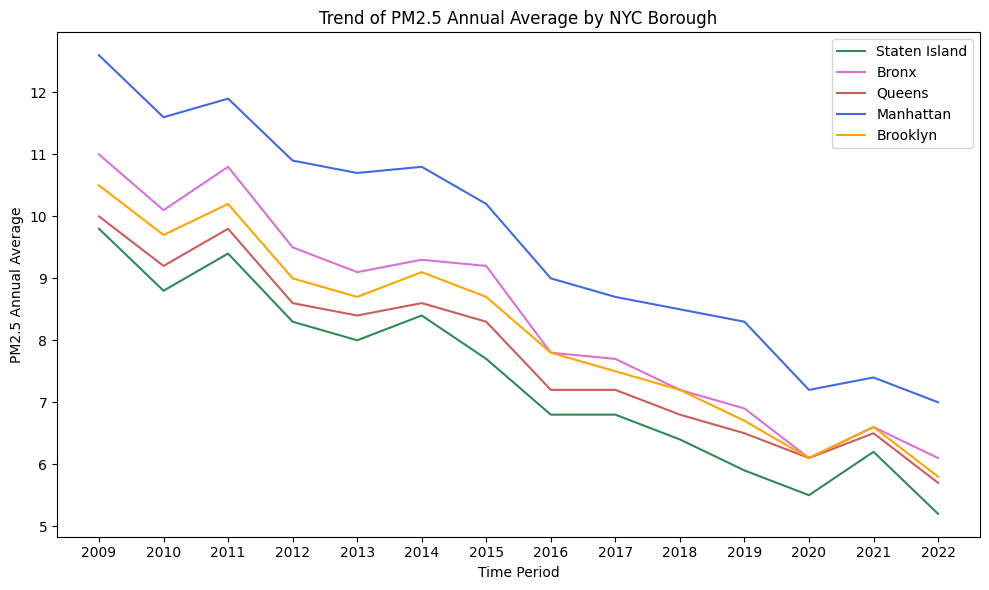

In [ ]:
df_PM25_sorted = df_PM25_annual.sort_values(by='TimePeriod')
fig, ax = plt.subplots(figsize=(10, 6))
for borough in df_PM25_sorted['Geography'].unique():
    df_borough = df_PM25_sorted[df_PM25_sorted['Geography'] == borough]
    ax.plot(df_borough['TimePeriod'], df_borough['Mean mcg/m3'], label=borough, color=colors[borough])
ax.set_title('Trend of PM2.5 Annual Average by NYC Borough')
ax.set_xlabel('Time Period')
ax.set_ylabel('PM2.5 Annual Average')
ax.legend()
years = df_PM25_sorted['TimePeriod'].str.extract(r'(\d{4})')[0].unique()
ax.set_xticks(df_PM25_sorted['TimePeriod'].unique())
ax.set_xticklabels(years)
plt.tight_layout()
plt.show()

## Analysis of pollutant distribution by borough

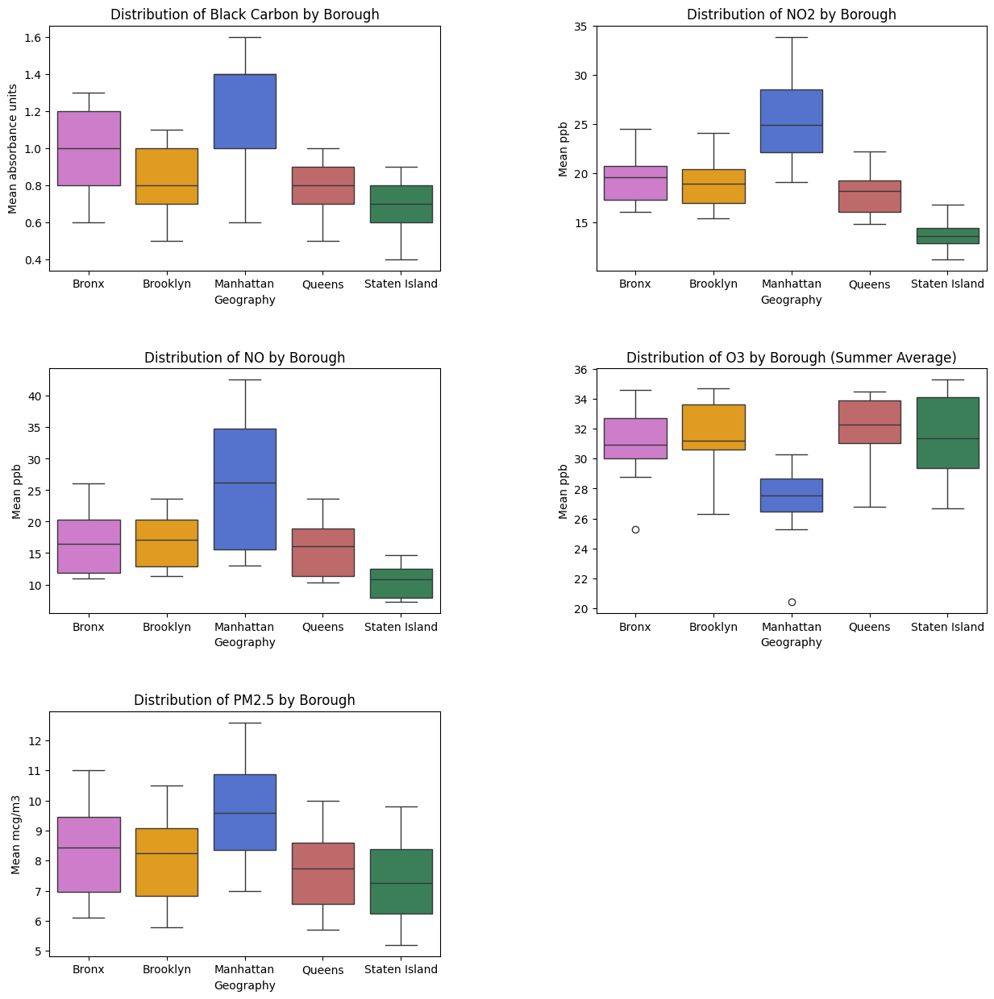

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15, 15))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

sns.boxplot(x='Geography', y='Mean absorbance units', data=df_blackcarbon_annual, ax=axs[0, 0], hue='Geography', palette=colors, dodge=False)
axs[0, 0].set_title('Distribution of Black Carbon by Borough')

sns.boxplot(x='Geography', y='Mean ppb', data=df_NO2_annual, ax=axs[0, 1], hue='Geography', palette=colors, dodge=False)
axs[0, 1].set_title('Distribution of NO2 by Borough')

sns.boxplot(x='Geography', y='Mean ppb', data=df_NO_annual, ax=axs[1, 0], hue='Geography', palette=colors, dodge=False)
axs[1, 0].set_title('Distribution of NO by Borough')

sns.boxplot(x='Geography', y='Mean ppb', data=df_O3_borough, ax=axs[1, 1], hue='Geography', palette=colors, dodge=False)
axs[1, 1].set_title('Distribution of O3 by Borough (Summer Average)')

sns.boxplot(x='Geography', y='Mean mcg/m3', data=df_PM25_annual, ax=axs[2, 0], hue='Geography', palette=colors, dodge=False)
axs[2, 0].set_title('Distribution of PM2.5 by Borough')

fig.delaxes(axs[2, 1])

plt.show()

## Analysis of seasonality

In [ ]:
def extract_season(time_period):
    if 'Winter' in time_period:
        return 'Winter'
    elif 'Summer' in time_period:
        return 'Summer'
    else:
        return 'Unknown'

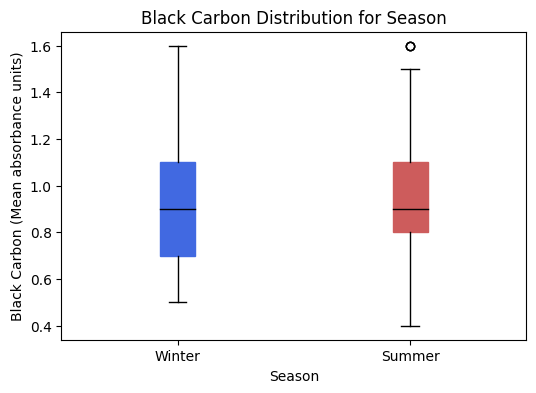

In [ ]:
df_blackcarbon_merged = pd.concat([df_blackcarbon_borough])

df_blackcarbon_merged['Season'] = df_blackcarbon_merged['TimePeriod'].apply(extract_season)

winter_data = df_blackcarbon_merged[df_blackcarbon_merged['Season'] == 'Winter']['Mean absorbance units']
summer_data = df_blackcarbon_merged[df_blackcarbon_merged['Season'] == 'Summer']['Mean absorbance units']

plt.figure(figsize=(6, 4))
bp = plt.boxplot([winter_data, summer_data], labels=['Winter', 'Summer'], patch_artist=True)

for box, color in zip(bp['boxes'], ['royalblue', 'indianred']):
    box.set(color=color)

for median in bp['medians']:
    median.set(color='black')

plt.title('Black Carbon Distribution for Season')
plt.xlabel('Season')
plt.ylabel('Black Carbon (Mean absorbance units)')
plt.show()

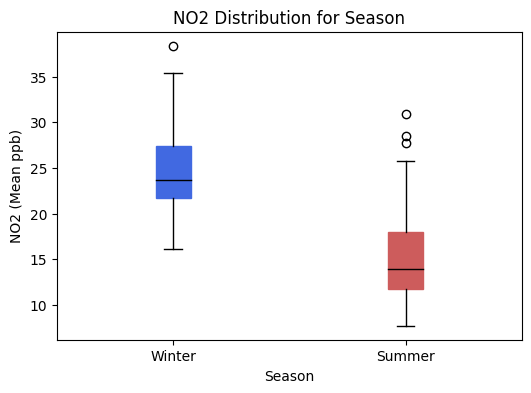

In [ ]:
df_NO2_merged = pd.concat([df_NO2_borough])

df_NO2_merged['Season'] = df_NO2_merged['TimePeriod'].apply(extract_season)

winter_data = df_NO2_merged[df_NO2_merged['Season'] == 'Winter']['Mean ppb']
summer_data = df_NO2_merged[df_NO2_merged['Season'] == 'Summer']['Mean ppb']

plt.figure(figsize=(6, 4))
bp = plt.boxplot([winter_data, summer_data], labels=['Winter', 'Summer'], patch_artist=True)

for box, color in zip(bp['boxes'], ['royalblue', 'indianred']):
    box.set(color=color)

for median in bp['medians']:
    median.set(color='black')

plt.title('NO2 Distribution for Season')
plt.xlabel('Season')
plt.ylabel('NO2 (Mean ppb)')
plt.show()

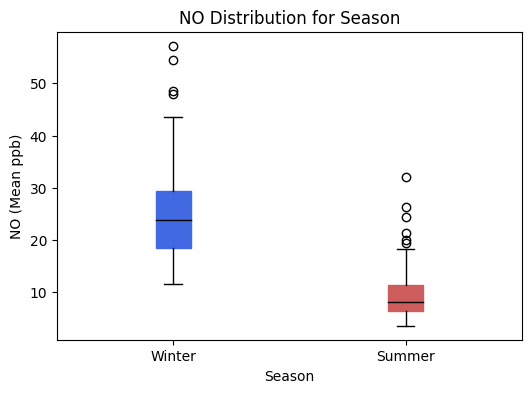

In [ ]:
df_NO_merged = pd.concat([df_NO_borough])

df_NO_merged['Season'] = df_NO_merged['TimePeriod'].apply(extract_season)

winter_data = df_NO_merged[df_NO_merged['Season'] == 'Winter']['Mean ppb']
summer_data = df_NO_merged[df_NO_merged['Season'] == 'Summer']['Mean ppb']

plt.figure(figsize=(6, 4))
bp = plt.boxplot([winter_data, summer_data], labels=['Winter', 'Summer'], patch_artist=True)

for box, color in zip(bp['boxes'], ['royalblue', 'indianred']):
    box.set(color=color)

for median in bp['medians']:
    median.set(color='black')

plt.title('NO Distribution for Season')
plt.xlabel('Season')
plt.ylabel('NO (Mean ppb)')
plt.show()

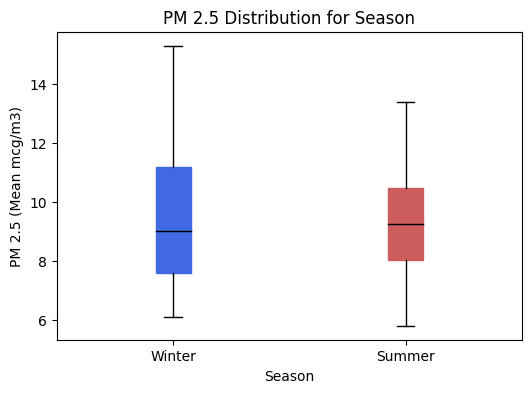

In [ ]:
df_PM25_merged = pd.concat([df_PM25_borough])

df_PM25_merged['Season'] = df_PM25_merged['TimePeriod'].apply(extract_season)

winter_data = df_PM25_merged[df_PM25_merged['Season'] == 'Winter']['Mean mcg/m3']
summer_data = df_PM25_merged[df_PM25_merged['Season'] == 'Summer']['Mean mcg/m3']

plt.figure(figsize=(6, 4))
bp = plt.boxplot([winter_data, summer_data], labels=['Winter', 'Summer'], patch_artist=True)

for box, color in zip(bp['boxes'], ['royalblue', 'indianred']):
    box.set(color=color)

for median in bp['medians']:
    median.set(color='black')

plt.title('PM 2.5 Distribution for Season')
plt.xlabel('Season')
plt.ylabel('PM 2.5 (Mean mcg/m3)')
plt.show()

# Traffic analysis

## Data exploration Air quality dataset

In [ ]:
df_aq.head()

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Message
0,179772,640,Boiler Emissions- Total SO2 Emissions,Number per km2,number,UHF42,409.0,Southeast Queens,2015,01/01/2015,0.3,NaN
1,179785,640,Boiler Emissions- Total SO2 Emissions,Number per km2,number,UHF42,209.0,Bensonhurst - Bay Ridge,2015,01/01/2015,1.2,NaN
2,178540,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,209.0,Bensonhurst - Bay Ridge,Annual Average 2012,12/01/2011,8.6,NaN
3,178561,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Annual Average 2012,12/01/2011,8.0,NaN
4,823217,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Summer 2022,06/01/2022,6.1,NaN


In [ ]:
df_aq.shape

(18025, 12)

In [ ]:
df_aq.describe()

,Unique ID,Indicator ID,Geo Join ID,Data Value,Message
count,18025.000000,18025.000000,1.801600e+04,18025.000000,0.0
mean,426387.692705,434.830180,5.906303e+05,21.428616,NaN
std,250489.450630,115.852371,7.769549e+06,23.999345,NaN
min,121644.000000,365.000000,1.000000e+00,0.000000,NaN
25%,175303.000000,365.000000,2.020000e+02,8.900000,NaN
50%,410803.000000,375.000000,3.030000e+02,15.200000,NaN
75%,649893.000000,386.000000,4.040000e+02,26.700000,NaN
max,828353.000000,661.000000,1.051061e+08,424.700000,NaN


In [ ]:
df_aq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18025 entries, 0 to 18024
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unique ID       18025 non-null  int64  
 1   Indicator ID    18025 non-null  int64  
 2   Name            18025 non-null  object 
 3   Measure         18025 non-null  object 
 4   Measure Info    18025 non-null  object 
 5   Geo Type Name   18025 non-null  object 
 6   Geo Join ID     18016 non-null  float64
 7   Geo Place Name  18016 non-null  object 
 8   Time Period     18025 non-null  object 
 9   Start_Date      18025 non-null  object 
 10  Data Value      18025 non-null  float64
 11  Message         0 non-null      float64
dtypes: float64(3), int64(2), object(7)
memory usage: 1.7+ MB


In [ ]:
df_aq = df_aq.drop("Message", axis = 1)

In [ ]:
df_aq['Start_Date'] = pd.to_datetime(df_aq['Start_Date'])

In [ ]:
categorical_columns = ['Indicator ID', 'Name', 'Measure', 'Measure Info', 'Geo Type Name', 'Geo Join ID', 'Geo Place Name', 'Time Period']
for col in categorical_columns:
    print(f"Unique values in {col}:")
    print(df_aq[col].unique())
    print("\n")

Unique values in Indicator ID:
[640 365 375 648 643 657 650 386 661 642 641 647 659 653 655 651 652 639
 646 645 644]


Unique values in Name:
['Boiler Emissions- Total SO2 Emissions' 'Fine particles (PM 2.5)'
 'Nitrogen dioxide (NO2)'
 'Asthma emergency department visits due to PM2.5'
 'Annual vehicle miles traveled'
 'Respiratory hospitalizations due to PM2.5 (age 20+)' 'Ozone (O3)'
 'Asthma hospitalizations due to Ozone'
 'Boiler Emissions- Total NOx Emissions'
 'Boiler Emissions- Total PM2.5 Emissions'
 'Outdoor Air Toxics - Formaldehyde'
 'Asthma emergency departments visits due to Ozone'
 'Cardiovascular hospitalizations due to PM2.5 (age 40+)'
 'Cardiac and respiratory deaths due to Ozone' 'Deaths due to PM2.5'
 'Outdoor Air Toxics - Benzene' 'Annual vehicle miles traveled (trucks)'
 'Annual vehicle miles traveled (cars)']


Unique values in Measure:
['Number per km2' 'Mean' 'Estimated annual rate (under age 18)'
 'Million miles' 'Estimated annual rate (age 18+)' 'Estimated annu

In [ ]:
unique_indicator_ids = df_aq['Indicator ID'].unique()

print("Indicato ID list:")
print(unique_indicator_ids)

Indicato ID list:
[640 365 375 648 643 657 650 386 661 642 641 647 659 653 655 651 652 639
 646 645 644]


In [ ]:
indicator_ids_list = [640, 365, 375, 648, 643, 657, 650, 386, 661, 642, 641, 647, 659, 653, 655, 651, 652, 639, 646, 645, 644]

indicator_id_name_mapping = {}
for indicator_id in indicator_ids_list:
    name = df_aq[df_aq['Indicator ID'] == indicator_id]['Name'].iloc[0]
    indicator_id_name_mapping[indicator_id] = name

print("Mapping ID Indicators to their Names:")
for indicator_id, name in indicator_id_name_mapping.items():
    print(f"Indicator ID: {indicator_id} - Name: {name}")

Mapping ID Indicators to their Names:
Indicator ID: 640 - Name: Boiler Emissions- Total SO2 Emissions
Indicator ID: 365 - Name: Fine particles (PM 2.5)
Indicator ID: 375 - Name: Nitrogen dioxide (NO2)
Indicator ID: 648 - Name: Asthma emergency department visits due to PM2.5
Indicator ID: 643 - Name: Annual vehicle miles traveled
Indicator ID: 657 - Name: Asthma emergency department visits due to PM2.5
Indicator ID: 650 - Name: Respiratory hospitalizations due to PM2.5 (age 20+)
Indicator ID: 386 - Name: Ozone (O3)
Indicator ID: 661 - Name: Asthma hospitalizations due to Ozone
Indicator ID: 642 - Name: Boiler Emissions- Total NOx Emissions
Indicator ID: 641 - Name: Boiler Emissions- Total PM2.5 Emissions
Indicator ID: 647 - Name: Outdoor Air Toxics - Formaldehyde
Indicator ID: 659 - Name: Asthma emergency departments visits due to Ozone
Indicator ID: 653 - Name: Asthma emergency departments visits due to Ozone
Indicator ID: 655 - Name: Asthma hospitalizations due to Ozone
Indicator ID: 

In [ ]:
df_aq.isnull().sum()
df_aq[df_aq.duplicated(keep='first')]
df_aq.drop_duplicates(keep='first', inplace=True)

## By borough

### Truck

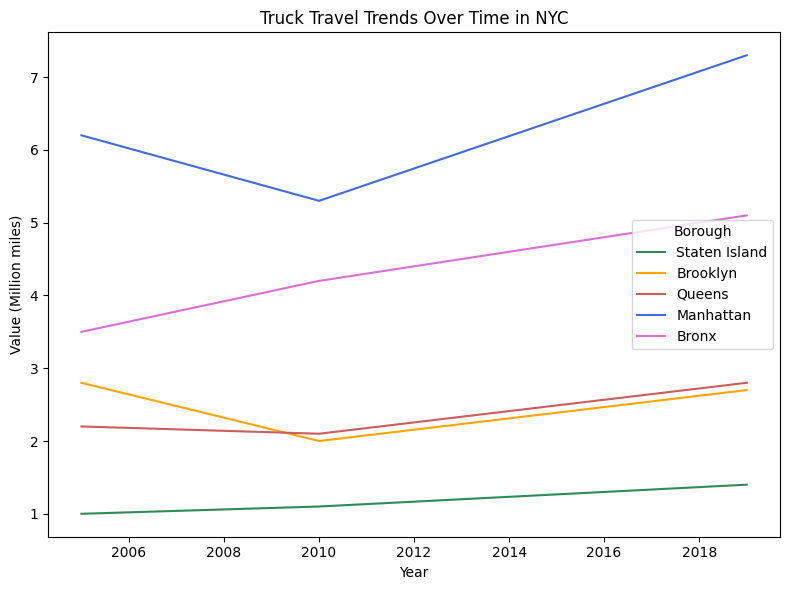

In [ ]:
truck_borough_data = df_aq[(df_aq['Indicator ID'] == 645) & (df_aq['Geo Type Name'] == 'Borough')]

plt.figure(figsize=(8, 6))
for borough, color in colors.items():
    borough_data = truck_borough_data[truck_borough_data['Geo Place Name'] == borough]
    sns.lineplot(x='Start_Date', y='Data Value', data=borough_data, label=borough, color=color)

plt.title('Truck Travel Trends Over Time by Borough')
plt.xlabel('Year')
plt.ylabel('Value (Million miles)')
plt.legend(title='Borough')

plt.tight_layout()
plt.show()

In [ ]:
borough_ranking = truck_borough_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
borough_ranking = borough_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Truck Travel Rankings by Borough:")
print(borough_ranking)

Truck Travel Rankings by Borough:
  Geo Place Name  Data Value
2      Manhattan    6.266667
0          Bronx    4.266667
1       Brooklyn    2.500000
3         Queens    2.366667
4  Staten Island    1.166667


### Car

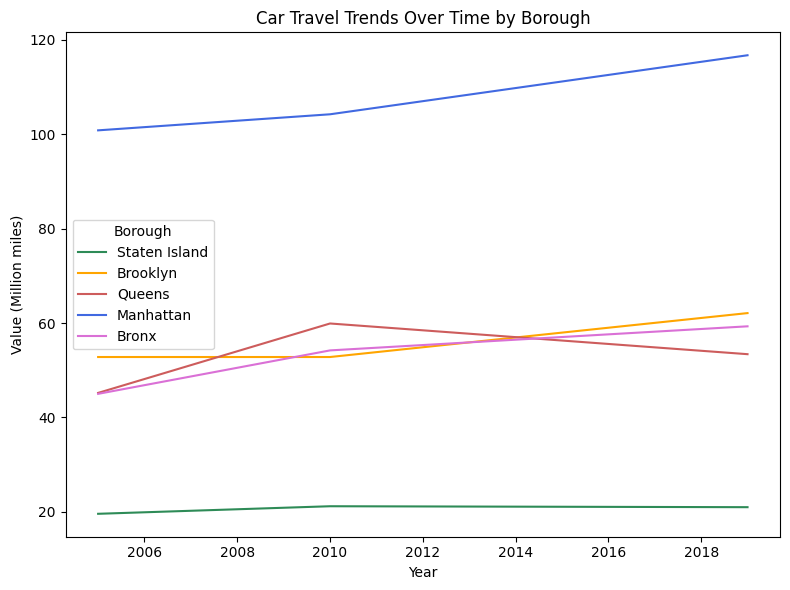

In [ ]:
car_borough_data = df_aq[(df_aq['Indicator ID'] == 644) & (df_aq['Geo Type Name'] == 'Borough')]

plt.figure(figsize=(8, 6))
for borough, color in colors.items():
    borough_data = car_borough_data[car_borough_data['Geo Place Name'] == borough]
    sns.lineplot(x='Start_Date', y='Data Value', data=borough_data, label=borough, color=color)

plt.title('Car Travel Trends Over Time by Borough')
plt.xlabel('Year')
plt.ylabel('Value (Million miles)')
plt.legend(title='Borough')

plt.tight_layout()
plt.show()

In [ ]:
borough_ranking = car_borough_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
borough_ranking = borough_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Car Travel Rankings by Borough:")
print(borough_ranking)

Car Travel Rankings by Borough:
  Geo Place Name  Data Value
2      Manhattan  107.233333
1       Brooklyn   55.900000
0          Bronx   52.833333
3         Queens   52.833333
4  Staten Island   20.600000


### Vehicles

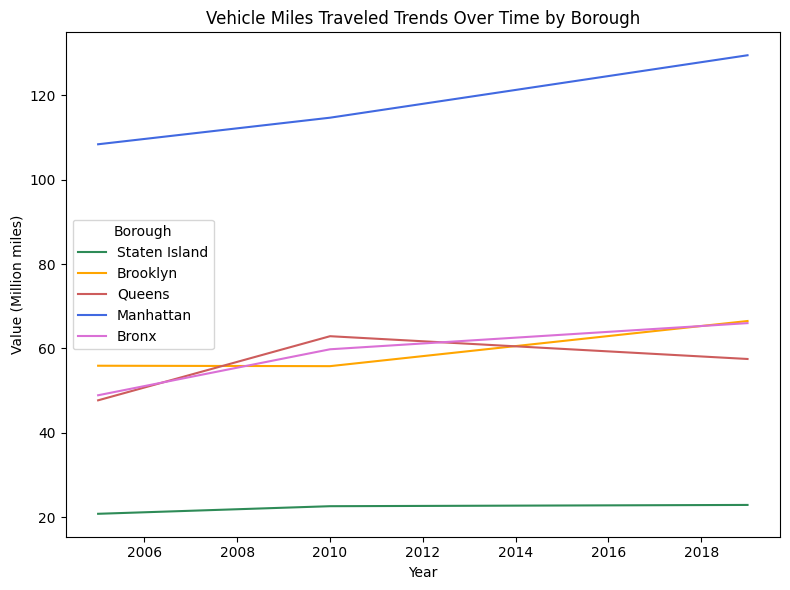

In [ ]:
travel_borough_data = df_aq[(df_aq['Indicator ID'] == 643) & (df_aq['Geo Type Name'] == 'Borough')]

plt.figure(figsize=(8, 6))
for borough, color in colors.items():
    borough_data = travel_borough_data[travel_borough_data['Geo Place Name'] == borough]
    sns.lineplot(x='Start_Date', y='Data Value', data=borough_data, label=borough, color=color)

plt.title('Vehicle Miles Traveled Trends Over Time by Borough')
plt.xlabel('Year')
plt.ylabel('Value (Million miles)')
plt.legend(title='Borough')

plt.tight_layout()
plt.show()

In [ ]:
borough_ranking = travel_borough_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
borough_ranking = borough_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Vehicle Miles traveled Rankings by Borough:")
print(borough_ranking)

Vehicle Miles traveled Rankings by Borough:
  Geo Place Name  Data Value
2      Manhattan  117.533333
1       Brooklyn   59.400000
0          Bronx   58.233333
3         Queens   56.033333
4  Staten Island   22.100000


In [ ]:
milestraveled_b_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality borough/Annual vehicle miles traveled_borough.csv"
df_mt_b = pd.read_csv(milestraveled_b_path)

df_mt_b.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Million miles per square mile
0,2019,Borough,1,1,Bronx,66.0
1,2019,Borough,2,1,Brooklyn,66.5
2,2019,Borough,3,1,Manhattan,129.5
3,2019,Borough,4,1,Queens,57.5
4,2019,Borough,5,1,Staten Island,22.9


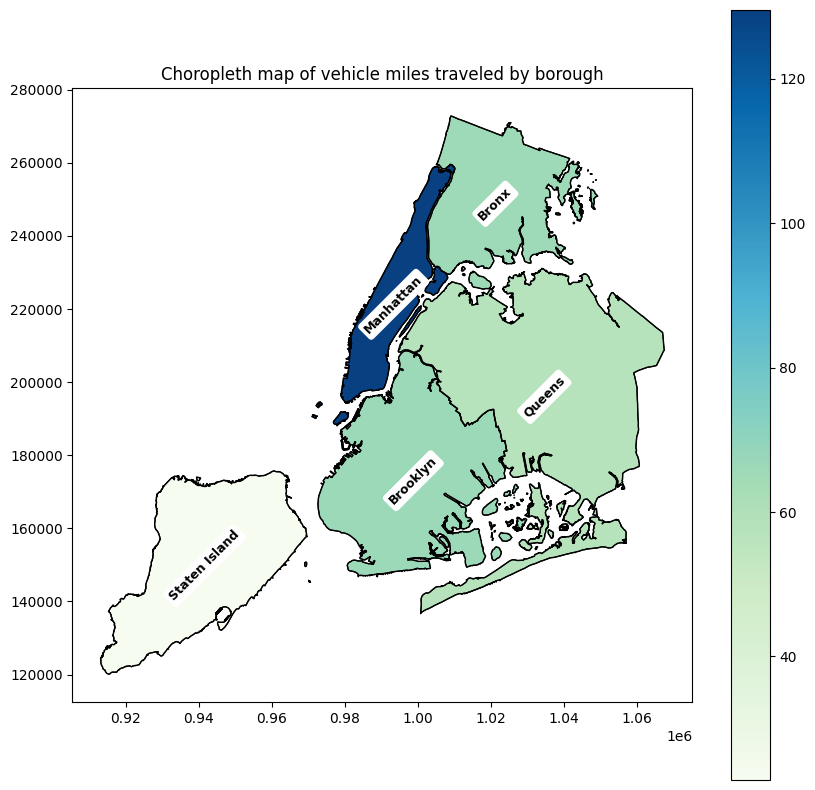

In [ ]:
gdf = gdf_borough.merge(df_mt_b[['Geography', 'Million miles per square mile']], left_on='BoroName', right_on='Geography')

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

gdf.boundary.plot(ax=ax, linewidth=1, color='black')
gdf.plot(column='Million miles per square mile', cmap='GnBu', linewidth=0.8, ax=ax, edgecolor='black', legend=True)

for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    ax.annotate(row['BoroName'], xy=(centroid.x, centroid.y), xytext=(0, -3), textcoords='offset points',
                ha='center', va='center', fontsize=9, fontweight='bold', color='black', rotation=45,
                       bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

plt.title('Choropleth map of vehicle miles traveled by borough')
plt.show()

## By neighborhood

### Truck

In [ ]:
truck_uhf42_data = df_aq[(df_aq['Indicator ID'] == 645) & (df_aq['Geo Type Name'] == 'UHF42')]

In [ ]:
uhf42_ranking = truck_uhf42_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
uhf42_ranking = uhf42_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Truck Travel Rankings by UHF42:")
print(uhf42_ranking)

Truck Travel Rankings by UHF42:
                          Geo Place Name  Data Value
18              Greenwich Village - SoHo   10.366667
16           Gramercy Park - Murray Hill    9.266667
6                      Chelsea - Clinton    8.900000
8                       Crotona -Tremont    7.600000
19              High Bridge - Morrisania    7.400000
37                       Upper West Side    6.966667
36                       Upper East Side    6.633333
35        Union Square - Lower East Side    6.266667
9             Downtown - Heights - Slope    6.100000
11                           East Harlem    6.066667
17                            Greenpoint    5.633333
38                    Washington Heights    5.600000
39                           West Queens    5.066667
34                           Sunset Park    4.500000
22               Kingsbridge - Riverdale    4.366667
15                         Fresh Meadows    4.300000
26                  Pelham - Throgs Neck    4.266667
0             

### Car

In [ ]:
car_uhf42_data = df_aq[(df_aq['Indicator ID'] == 644) & (df_aq['Geo Type Name'] == 'UHF42')]

In [ ]:
uhf42_ranking = car_uhf42_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
uhf42_ranking = uhf42_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Truck Travel Rankings by UHF42:")
print(uhf42_ranking)

Truck Travel Rankings by UHF42:
                          Geo Place Name  Data Value
16           Gramercy Park - Murray Hill  164.766667
11                           East Harlem  124.966667
18              Greenwich Village - SoHo  117.666667
36                       Upper East Side  114.433333
37                       Upper West Side  114.200000
35        Union Square - Lower East Side  110.600000
6                      Chelsea - Clinton  108.333333
38                    Washington Heights  108.000000
9             Downtown - Heights - Slope   95.833333
39                           West Queens   93.433333
24                       Lower Manhattan   91.200000
5   Central Harlem - Morningside Heights   88.366667
8                       Crotona -Tremont   81.800000
1     Bedford Stuyvesant - Crown Heights   76.866667
15                         Fresh Meadows   74.100000
34                           Sunset Park   72.366667
0                  Bayside - Little Neck   70.733333
19            

### Vehicles

In [ ]:
travel_uhf42_data = df_aq[(df_aq['Indicator ID'] == 643) & (df_aq['Geo Type Name'] == 'UHF42')]

In [ ]:
uhf42_ranking = travel_uhf42_data.groupby('Geo Place Name')['Data Value'].mean().reset_index()
uhf42_ranking = uhf42_ranking.sort_values(by='Data Value', ascending=False)

In [ ]:
print("Vehicle Miles traveled Rankings by UHF42:")
print(uhf42_ranking)

Vehicle Miles traveled Rankings by UHF42:
                          Geo Place Name  Data Value
16           Gramercy Park - Murray Hill  182.400000
11                           East Harlem  134.266667
18              Greenwich Village - SoHo  133.333333
36                       Upper East Side  126.300000
37                       Upper West Side  124.700000
6                      Chelsea - Clinton  123.066667
35        Union Square - Lower East Side  120.333333
38                    Washington Heights  115.866667
9             Downtown - Heights - Slope  104.233333
39                           West Queens  100.133333
24                       Lower Manhattan   99.733333
5   Central Harlem - Morningside Heights   93.666667
8                       Crotona -Tremont   91.333333
1     Bedford Stuyvesant - Crown Heights   80.666667
15                         Fresh Meadows   79.466667
19              High Bridge - Morrisania   79.433333
34                           Sunset Park   78.300000
0   

In [ ]:
milestraveled_path = "/content/drive/MyDrive/DS Lab on Smart Cities/Dataset/Air quality UHF42/Annual vehicle miles traveled .csv"
df_mt = pd.read_csv(milestraveled_path)

df_mt.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Million miles per square mile
0,2019,UHF 42,101,4,Kingsbridge - Riverdale,80.8
1,2019,UHF 42,102,4,Northeast Bronx,47.7
2,2019,UHF 42,103,4,Fordham - Bronx Pk,60.0
3,2019,UHF 42,104,4,Pelham - Throgs Neck,64.5
4,2019,UHF 42,105,4,Crotona -Tremont,102.3


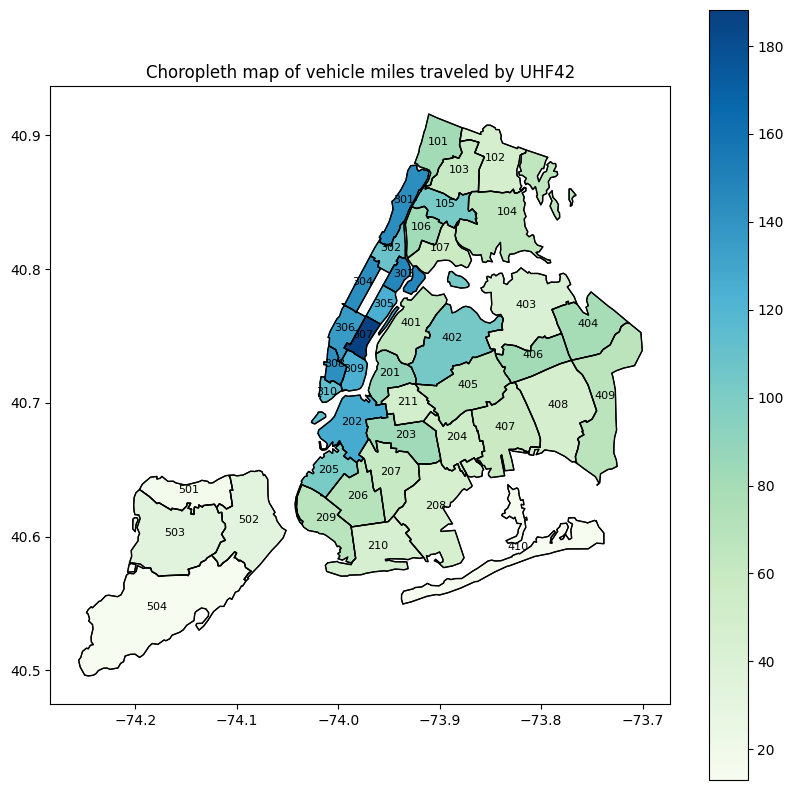

In [ ]:
gdf = gdf_UHF42.merge(df_mt[['GeoID', 'Million miles per square mile']], left_on='GEOCODE', right_on='GeoID')

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

gdf.boundary.plot(ax=ax, linewidth=1, color='black')
gdf.plot(column='Million miles per square mile', cmap='GnBu', linewidth=0.8, ax=ax, edgecolor='black', legend=True)

for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    ax.annotate(row['GEOCODE'], xy=(centroid.x, centroid.y), ha='center', fontsize=8, color='black')

plt.title('Choropleth map of vehicle miles traveled by UHF42')
plt.show()

# Health Impact

## Borough poverty

In [ ]:
borough_poverty.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Number,Percent
0,2017-21,Borough,5,1,Staten Island,"50,282",10.3
1,2017-21,Borough,3,1,Manhattan,"252,233",15.6
2,2017-21,Borough,4,1,Queens,"270,107",11.4
3,2017-21,Borough,1,1,Bronx,"379,954",26.5
4,2017-21,Borough,2,1,Brooklyn,"504,813",18.8


In [ ]:
borough_poverty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   TimePeriod   5 non-null      object 
 1   GeoTypeDesc  5 non-null      object 
 2   GeoID        5 non-null      int64  
 3   GeoRank      5 non-null      int64  
 4   Geography    5 non-null      object 
 5   Number       5 non-null      object 
 6   Percent      5 non-null      float64
dtypes: float64(1), int64(2), object(4)
memory usage: 408.0+ bytes


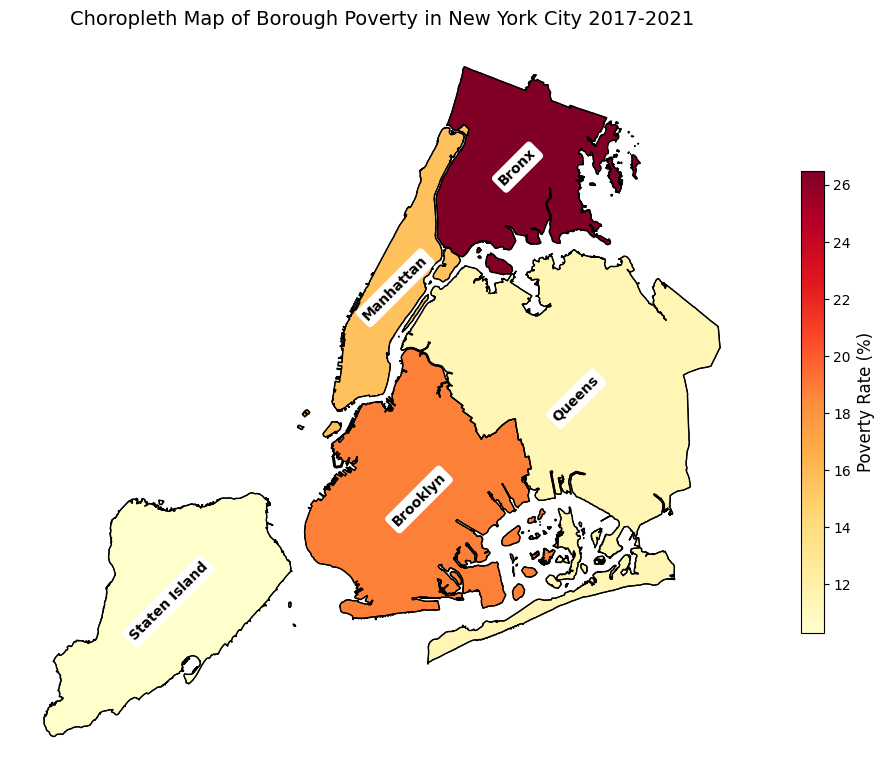

In [ ]:
gdf = gdf_borough.merge(borough_poverty[['Geography', 'Percent']], left_on='BoroName', right_on='Geography')

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

gdf.boundary.plot(ax=ax, linewidth=1, color='black')

gdf.plot(column='Percent', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='black', legend=False)

for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    ax.annotate(row['BoroName'], xy=(centroid.x, centroid.y), xytext=(0, 0), textcoords='offset points',
                ha='center', va='center', fontsize=10, fontweight='bold', color='black', rotation=45,
                bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

norm = Normalize(vmin=gdf['Percent'].min(), vmax=gdf['Percent'].max())
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='YlOrRd'), ax=ax, orientation='vertical', shrink=0.6)
cbar.set_label('Poverty Rate (%)', fontsize=12)

plt.title('Choropleth Map of Borough Poverty in New York City 2017-2021', fontsize=14)

ax.axis('off')

plt.show()

## Health insurance adults

In [ ]:
healthinsurance.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Number,Percent
0,2020,Borough,1,1,Bronx,"816,000","79.4 (76.1, 82.4)"
1,2020,Borough,2,1,Brooklyn,"1,647,000","84.6 (82.5, 86.4)"
2,2020,Borough,3,1,Manhattan,"1,220,000","91.8 (89.7, 93.5)"
3,2020,Borough,4,1,Queens,"1,418,000","80.1 (77.3, 82.7)"
4,2020,Borough,5,1,Staten Island,"327,000","89.9 (85.1, 93.2)"


In [ ]:
def extract_percent_number(percent_string):
    match = re.match(r'(\d+\.\d+)', percent_string)
    if match:
        return float(match.group(1))
    else:
        return None

healthinsurance['Percent'] = healthinsurance['Percent'].apply(extract_percent_number)

print(healthinsurance)

   TimePeriod GeoTypeDesc  GeoID  GeoRank      Geography     Number  Percent
0        2020     Borough      1        1          Bronx    816,000     79.4
1        2020     Borough      2        1       Brooklyn  1,647,000     84.6
2        2020     Borough      3        1      Manhattan  1,220,000     91.8
3        2020     Borough      4        1         Queens  1,418,000     80.1
4        2020     Borough      5        1  Staten Island    327,000     89.9


In [ ]:
healthinsurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   TimePeriod   5 non-null      int64  
 1   GeoTypeDesc  5 non-null      object 
 2   GeoID        5 non-null      int64  
 3   GeoRank      5 non-null      int64  
 4   Geography    5 non-null      object 
 5   Number       5 non-null      object 
 6   Percent      5 non-null      float64
dtypes: float64(1), int64(3), object(3)
memory usage: 408.0+ bytes


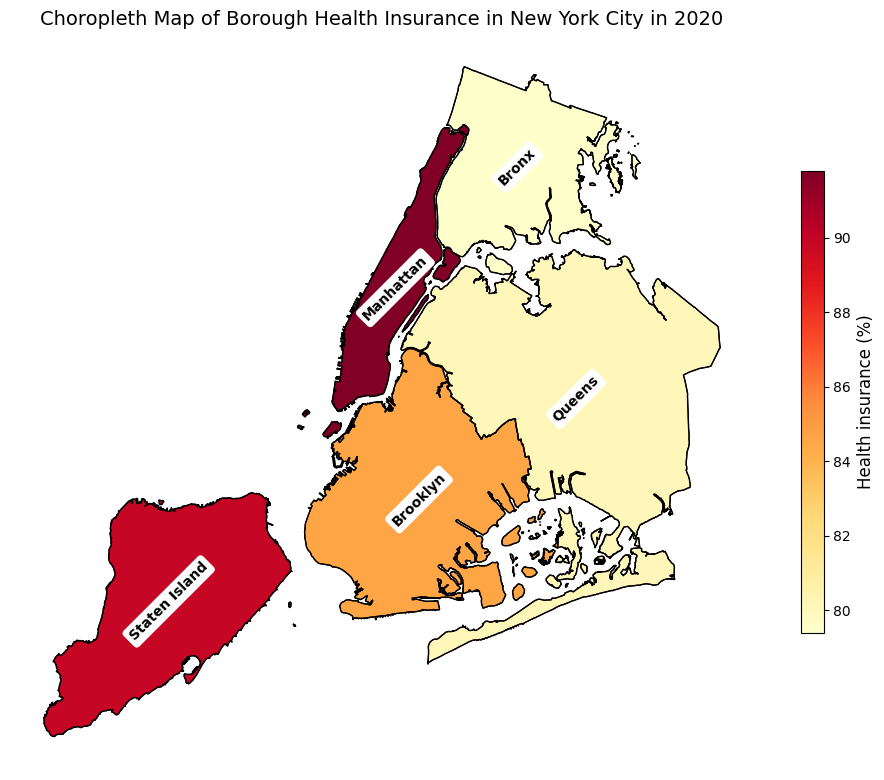

In [ ]:
gdf = gdf_borough.merge(healthinsurance[['Geography', 'Percent']], left_on='BoroName', right_on='Geography')

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

gdf.boundary.plot(ax=ax, linewidth=1, color='black')

gdf.plot(column='Percent', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='black', legend=False)

for idx, row in gdf.iterrows():
    centroid = row['geometry'].centroid
    ax.annotate(row['BoroName'], xy=(centroid.x, centroid.y), xytext=(0, 0), textcoords='offset points',
                ha='center', va='center', fontsize=10, fontweight='bold', color='black', rotation=45,
                bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

norm = Normalize(vmin=gdf['Percent'].min(), vmax=gdf['Percent'].max())
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='YlOrRd'), ax=ax, orientation='vertical', shrink=0.6)
cbar.set_label('Health insurance (%)', fontsize=12)

plt.title('Choropleth Map of Borough Health Insurance in New York City in 2020', fontsize=14)

ax.axis('off')

plt.show()

## Ashtma Emergency

### Due to Ozone

In [ ]:
asthma_ozone.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
0,2017-2019,Borough,1,1,Bronx,844.0,540.0,74.0,145.0
1,2017-2019,Borough,2,1,Brooklyn,883.0,442.0,43.0,74.0
2,2017-2019,Borough,3,1,Manhattan,564.0,223.0,39.0,92.0
3,2017-2019,Borough,4,1,Queens,427.0,288.0,22.0,60.0
4,2017-2019,Borough,5,1,Staten Island,111.0,47.0,28.0,43.0


In [ ]:
asthma_ozone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 9 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   TimePeriod                                                 235 non-null    object 
 1   GeoTypeDesc                                                235 non-null    object 
 2   GeoID                                                      235 non-null    int64  
 3   GeoRank                                                    235 non-null    int64  
 4   Geography                                                  235 non-null    object 
 5   Estimated annual number (age 18+)                          235 non-null    object 
 6   Estimated annual number (under age 18)                     235 non-null    float64
 7   Estimated annual rate (age 18+) per 100,000 adults         235 non-null    float64
 8   Estimated a

#### By borough

In [ ]:
asthmaozone_borough_df = asthma_ozone[asthma_ozone['GeoTypeDesc'] == 'Borough']

In [ ]:
print(asthmaozone_borough_df.dtypes)

TimePeriod                                                    object
GeoTypeDesc                                                   object
GeoID                                                          int64
GeoRank                                                        int64
Geography                                                     object
Estimated annual number (age 18+)                             object
Estimated annual number (under age 18)                       float64
Estimated annual rate (age 18+) per 100,000 adults           float64
Estimated annual rate (under age 18) per 100,000 children    float64
dtype: object


In [ ]:
asthmaozone_borough_df['Estimated annual number (age 18+)'] = pd.to_numeric(asthmaozone_borough_df['Estimated annual number (age 18+)'], errors='coerce')

<ipython-input-29-c9d972956360>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmaozone_borough_df['Estimated annual number (age 18+)'] = pd.to_numeric(asthmaozone_borough_df['Estimated annual number (age 18+)'], errors='coerce')


In [ ]:
print(asthmaozone_borough_df.describe())

           GeoID  GeoRank  Estimated annual number (age 18+)  \
count  25.000000     25.0                          21.000000   
mean    3.000000      1.0                         537.185714   
std     1.443376      0.0                         284.168713   
min     1.000000      1.0                         102.500000   
25%     2.000000      1.0                         415.900000   
50%     3.000000      1.0                         564.000000   
75%     4.000000      1.0                         807.500000   
max     5.000000      1.0                         962.700000   

       Estimated annual number (under age 18)  \
count                               25.000000   
mean                               366.412000   
std                                207.827072   
min                                 47.000000   
25%                                268.100000   
50%                                325.600000   
75%                                533.200000   
max                            

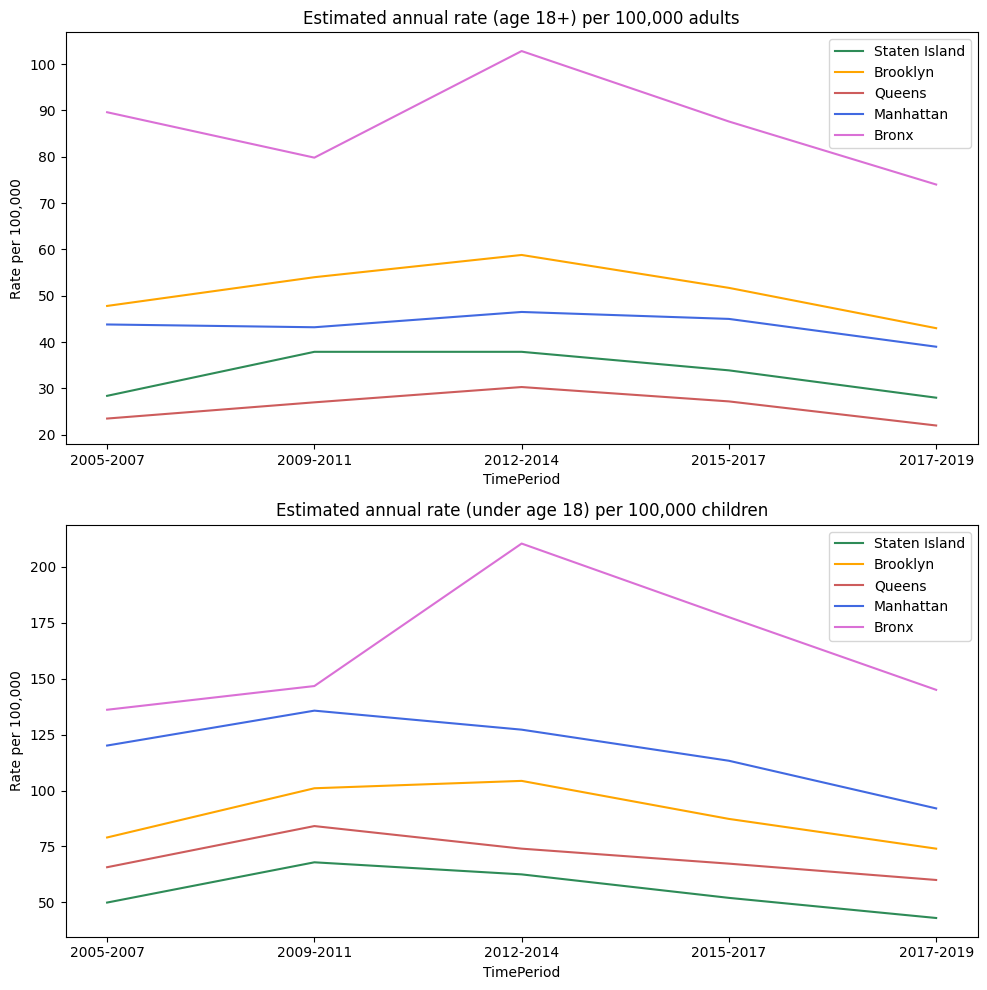

In [ ]:
asthmaozone_borough_df = asthmaozone_borough_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = asthmaozone_borough_df[asthmaozone_borough_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (age 18+) per 100,000 adults'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual rate (age 18+) per 100,000 adults')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Rate per 100,000')
axes[0].legend()

for borough in colors:
    borough_data = asthmaozone_borough_df[asthmaozone_borough_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (under age 18) per 100,000 children'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate (under age 18) per 100,000 children')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

#### By UHF42

Focus on Bronx borough

In [ ]:
asthmaozone_uhf_df = asthma_ozone[asthma_ozone['GeoTypeDesc'] == 'UHF 42']

In [ ]:
asthmaozone_uhf_df

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
5,2017-2019,UHF 42,101,4,Kingsbridge - Riverdale,19.0,12.0,24.0,66.0
6,2017-2019,UHF 42,102,4,Northeast Bronx,93.0,54.0,55.0,116.0
7,2017-2019,UHF 42,103,4,Fordham - Bronx Pk,148.0,107.0,71.0,150.0
8,2017-2019,UHF 42,104,4,Pelham - Throgs Neck,122.0,80.0,50.0,111.0
9,2017-2019,UHF 42,105,4,Crotona -Tremont,156.0,98.0,95.0,157.0
...,...,...,...,...,...,...,...,...,...
230,2005-2007,UHF 42,410,4,Rockaways,45.9,39.3,58.8,135.2
231,2005-2007,UHF 42,501,4,Port Richmond,29.2,19.0,57.9,92.9
232,2005-2007,UHF 42,502,4,Stapleton - St. George,38.7,22.0,39.8,73.2
233,2005-2007,UHF 42,503,4,Willowbrook,11.2,5.5,16.2,28.0


In [ ]:
bronx_neighborhoods = [101, 102, 103, 104, 105, 106, 107]
bronx_data = asthmaozone_uhf_df[asthmaozone_uhf_df['GeoID'].isin(bronx_neighborhoods)]

In [ ]:
mean_adult_rate = bronx_data['Estimated annual rate (age 18+) per 100,000 adults'].mean()
mean_child_rate = bronx_data['Estimated annual rate (under age 18) per 100,000 children'].mean()

In [ ]:
print(f"Mean of annual rate (age 18+) per 100,000 adults: {mean_adult_rate}")
print(f"Mean of annual rate (under age 18) per 100,000 children: {mean_child_rate}")

Mean of annual rate (age 18+) per 100,000 adults: 86.85714285714286
Mean of annual rate (under age 18) per 100,000 children: 155.92857142857142


In [ ]:
quartieri_grouped = bronx_data.groupby('GeoID').agg({
    'Estimated annual rate (age 18+) per 100,000 adults': 'mean',
    'Estimated annual rate (under age 18) per 100,000 children': 'mean'
}).reset_index()

quartieri_grouped = quartieri_grouped.rename(columns={
    'Estimated annual rate (age 18+) per 100,000 adults': 'Mean annual rate (age 18+)',
    'Estimated annual rate (under age 18) per 100,000 children': 'Mean annual rate (under age 18)'
})

quartieri_grouped_adult = quartieri_grouped.sort_values(by='Mean annual rate (age 18+)', ascending=False)
quartieri_grouped_adult['Rank (adults)'] = range(1, len(quartieri_grouped_adult) + 1)

quartieri_grouped_child = quartieri_grouped.sort_values(by='Mean annual rate (under age 18)', ascending=False)
quartieri_grouped_child['Rank (children)'] = range(1, len(quartieri_grouped_child) + 1)

quartieri_ranked = pd.merge(
    quartieri_grouped_adult[['GeoID', 'Mean annual rate (age 18+)', 'Rank (adults)']],
    quartieri_grouped_child[['GeoID', 'Mean annual rate (under age 18)', 'Rank (children)']],
    on='GeoID'
)

print(quartieri_ranked)

   GeoID  Mean annual rate (age 18+)  Rank (adults)  \
0    107                      128.42              1   
1    105                      122.22              2   
2    106                      121.30              3   
3    103                       82.74              4   
4    104                       62.22              5   
5    102                       60.86              6   
6    101                       30.24              7   

   Mean annual rate (under age 18)  Rank (children)  
0                           206.06                1  
1                           187.00                3  
2                           204.78                2  
3                           162.24                4  
4                           127.44                6  
5                           127.44                5  
6                            76.54                7  


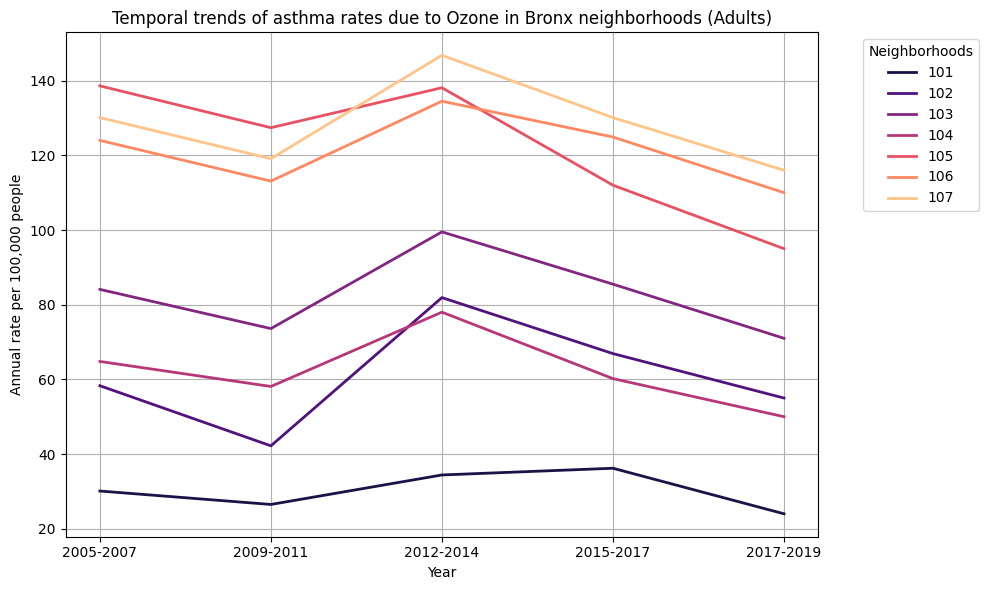

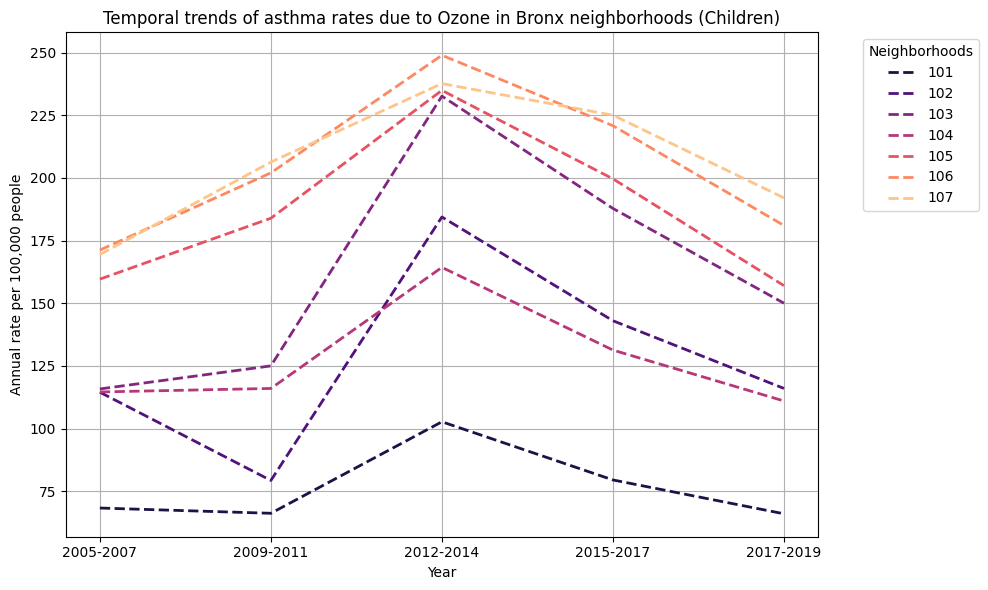

In [ ]:
annual_rates = bronx_data.groupby(['TimePeriod', 'GeoID']).agg({
    'Estimated annual rate (age 18+) per 100,000 adults': 'mean',
    'Estimated annual rate (under age 18) per 100,000 children': 'mean'
}).reset_index()

plt.figure(figsize=(10, 6))

colors = sns.color_palette("magma", len(bronx_neighborhoods))

for idx, geo_id in enumerate(bronx_neighborhoods):
    subset = annual_rates[annual_rates['GeoID'] == geo_id]
    plt.plot(subset['TimePeriod'], subset['Estimated annual rate (age 18+) per 100,000 adults'],
             label=f'{geo_id}', color=colors[idx], linestyle='-', linewidth=2)

plt.xlabel('Year')
plt.ylabel('Annual rate per 100,000 people')
plt.title('Temporal trends of asthma rates due to Ozone in Bronx neighborhoods (Adults)')
plt.legend(title='Neighborhoods', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

for idx, geo_id in enumerate(bronx_neighborhoods):
    subset = annual_rates[annual_rates['GeoID'] == geo_id]
    plt.plot(subset['TimePeriod'], subset['Estimated annual rate (under age 18) per 100,000 children'],
             label=f'{geo_id}', color=colors[idx], linestyle='--', linewidth=2)

plt.xlabel('Year')
plt.ylabel('Annual rate per 100,000 people')
plt.title('Temporal trends of asthma rates due to Ozone in Bronx neighborhoods (Children)')
plt.legend(title='Neighborhoods', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

### Due to PM 2.5

In [ ]:
asthma_pm.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
0,2017-2019,Borough,1,1,Bronx,586.0,403.0,52.0,108.0
1,2017-2019,Borough,2,1,Brooklyn,622.0,327.0,30.0,54.0
2,2017-2019,Borough,3,1,Manhattan,410.0,171.0,28.0,71.0
3,2017-2019,Borough,4,1,Queens,270.0,192.0,14.0,40.0
4,2017-2019,Borough,5,1,Staten Island,76.0,32.0,19.0,30.0


In [ ]:
asthma_pm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 9 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   TimePeriod                                                 235 non-null    object 
 1   GeoTypeDesc                                                235 non-null    object 
 2   GeoID                                                      235 non-null    int64  
 3   GeoRank                                                    235 non-null    int64  
 4   Geography                                                  235 non-null    object 
 5   Estimated annual number (age 18+)                          235 non-null    object 
 6   Estimated annual number (under age 18)                     235 non-null    float64
 7   Estimated annual rate (age 18+) per 100,000 adults         235 non-null    object 
 8   Estimated a

#### By borough

In [ ]:
asthmapm_borough_df = asthma_pm[asthma_pm['GeoTypeDesc'] == 'Borough']

In [ ]:
print(asthmapm_borough_df.dtypes)

TimePeriod                                                    object
GeoTypeDesc                                                   object
GeoID                                                          int64
GeoRank                                                        int64
Geography                                                     object
Estimated annual number (age 18+)                             object
Estimated annual number (under age 18)                       float64
Estimated annual rate (age 18+) per 100,000 adults            object
Estimated annual rate (under age 18) per 100,000 children     object
dtype: object


In [ ]:
asthmapm_borough_df['Estimated annual number (age 18+)'] = pd.to_numeric(asthmapm_borough_df['Estimated annual number (age 18+)'], errors='coerce')

<ipython-input-255-45a691ec7a0e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmapm_borough_df['Estimated annual number (age 18+)'] = pd.to_numeric(asthmapm_borough_df['Estimated annual number (age 18+)'], errors='coerce')


In [ ]:
asthmapm_borough_df['Estimated annual rate (age 18+) per 100,000 adults'] = pd.to_numeric(asthmapm_borough_df['Estimated annual rate (age 18+) per 100,000 adults'], errors='coerce')

<ipython-input-257-62a5edabfa30>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmapm_borough_df['Estimated annual rate (age 18+) per 100,000 adults'] = pd.to_numeric(asthmapm_borough_df['Estimated annual rate (age 18+) per 100,000 adults'], errors='coerce')


In [ ]:
asthmapm_borough_df['Estimated annual rate (under age 18) per 100,000 children'] = pd.to_numeric(asthmapm_borough_df['Estimated annual rate (under age 18) per 100,000 children'], errors='coerce')

<ipython-input-258-8e00304078a8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmapm_borough_df['Estimated annual rate (under age 18) per 100,000 children'] = pd.to_numeric(asthmapm_borough_df['Estimated annual rate (under age 18) per 100,000 children'], errors='coerce')


In [ ]:
print(asthmapm_borough_df.dtypes)

TimePeriod                                                    object
GeoTypeDesc                                                   object
GeoID                                                          int64
GeoRank                                                        int64
Geography                                                     object
Estimated annual number (age 18+)                            float64
Estimated annual number (under age 18)                       float64
Estimated annual rate (age 18+) per 100,000 adults           float64
Estimated annual rate (under age 18) per 100,000 children    float64
dtype: object


In [ ]:
print(asthmapm_borough_df.describe())

           GeoID  GeoRank  Estimated annual number (age 18+)  \
count  25.000000     25.0                          23.000000   
mean    3.000000      1.0                         495.786957   
std     1.443376      0.0                         283.818348   
min     1.000000      1.0                          76.000000   
25%     2.000000      1.0                         304.500000   
50%     3.000000      1.0                         491.500000   
75%     4.000000      1.0                         725.300000   
max     5.000000      1.0                         936.800000   

       Estimated annual number (under age 18)  \
count                                25.00000   
mean                                343.52400   
std                                 221.50146   
min                                  32.00000   
25%                                 192.00000   
50%                                 337.60000   
75%                                 494.50000   
max                            

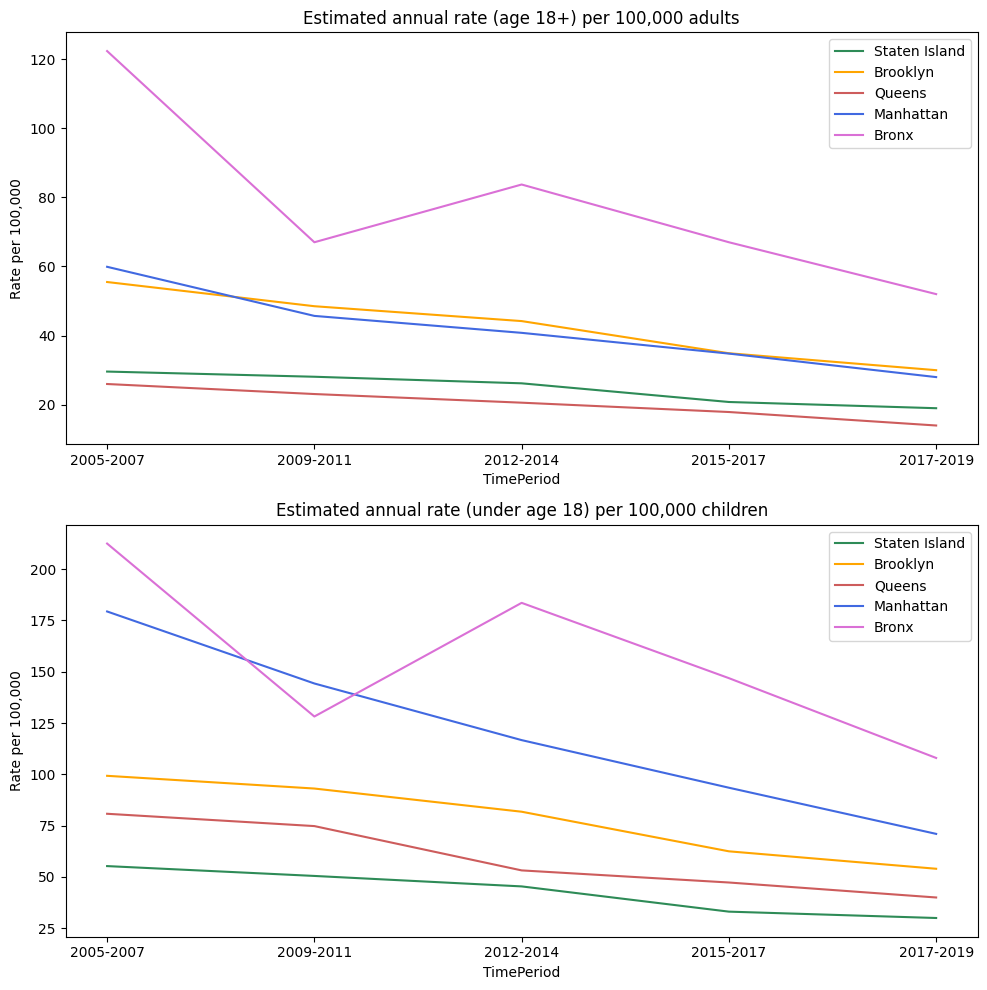

In [ ]:
asthmapm_borough_df = asthmapm_borough_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = asthmapm_borough_df[asthmapm_borough_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (age 18+) per 100,000 adults'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual rate (age 18+) per 100,000 adults')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Rate per 100,000')
axes[0].legend()

for borough in colors:
    borough_data = asthmapm_borough_df[asthmapm_borough_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (under age 18) per 100,000 children'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate (under age 18) per 100,000 children')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

#### By UHF42

In [ ]:
asthmapm_uhf_df = asthma_pm[asthma_pm['GeoTypeDesc'] == 'UHF 42']

In [ ]:
asthmapm_uhf_df

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
5,2017-2019,UHF 42,101,4,Kingsbridge - Riverdale,13.0,9.0,16.0,48.0
6,2017-2019,UHF 42,102,4,Northeast Bronx,61.0,37.0,36.0,81.0
7,2017-2019,UHF 42,103,4,Fordham - Bronx Pk,101.0,79.0,49.0,112.0
8,2017-2019,UHF 42,104,4,Pelham - Throgs Neck,83.0,58.0,34.0,80.0
9,2017-2019,UHF 42,105,4,Crotona -Tremont,110.0,74.0,67.0,119.0
...,...,...,...,...,...,...,...,...,...
230,2005-2007,UHF 42,410,4,Rockaways,46.7,44.4,-,-
231,2005-2007,UHF 42,501,4,Port Richmond,31.6,21.9,-,-
232,2005-2007,UHF 42,502,4,Stapleton - St. George,40.4,24.7,-,-
233,2005-2007,UHF 42,503,4,Willowbrook,11.2,5.9,-,-


In [ ]:
asthmapm_uhf_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 210 entries, 5 to 234
Data columns (total 9 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   TimePeriod                                                 210 non-null    object 
 1   GeoTypeDesc                                                210 non-null    object 
 2   GeoID                                                      210 non-null    int64  
 3   GeoRank                                                    210 non-null    int64  
 4   Geography                                                  210 non-null    object 
 5   Estimated annual number (age 18+)                          210 non-null    object 
 6   Estimated annual number (under age 18)                     210 non-null    float64
 7   Estimated annual rate (age 18+) per 100,000 adults         210 non-null    object 
 8   Estimated annual

In [ ]:
asthmapm_uhf_df['Estimated annual rate (age 18+) per 100,000 adults'] = pd.to_numeric(asthmapm_uhf_df['Estimated annual rate (age 18+) per 100,000 adults'], errors='coerce')

<ipython-input-345-285042f4f21e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmapm_uhf_df['Estimated annual rate (age 18+) per 100,000 adults'] = pd.to_numeric(asthmapm_uhf_df['Estimated annual rate (age 18+) per 100,000 adults'], errors='coerce')


In [ ]:
asthmapm_uhf_df['Estimated annual rate (under age 18) per 100,000 children'] = pd.to_numeric(asthmapm_uhf_df['Estimated annual rate (under age 18) per 100,000 children'], errors='coerce')

<ipython-input-346-06432c582b01>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asthmapm_uhf_df['Estimated annual rate (under age 18) per 100,000 children'] = pd.to_numeric(asthmapm_uhf_df['Estimated annual rate (under age 18) per 100,000 children'], errors='coerce')


In [ ]:
bronx_neighborhoods = [101, 102, 103, 104, 105, 106, 107]
bronx_data_uhf = asthmapm_uhf_df[asthmapm_uhf_df['GeoID'].isin(bronx_neighborhoods)]

In [ ]:
bronx_data_uhf

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
5,2017-2019,UHF 42,101,4,Kingsbridge - Riverdale,13.0,9.0,16.0,48.0
6,2017-2019,UHF 42,102,4,Northeast Bronx,61.0,37.0,36.0,81.0
7,2017-2019,UHF 42,103,4,Fordham - Bronx Pk,101.0,79.0,49.0,112.0
8,2017-2019,UHF 42,104,4,Pelham - Throgs Neck,83.0,58.0,34.0,80.0
9,2017-2019,UHF 42,105,4,Crotona -Tremont,110.0,74.0,67.0,119.0
10,2017-2019,UHF 42,106,4,High Bridge - Morrisania,129.0,84.0,78.0,138.0
11,2017-2019,UHF 42,107,4,Hunts Point - Mott Haven,88.0,60.0,83.0,147.0
52,2015-2017,UHF 42,101,4,Kingsbridge - Riverdale,19.7,11.9,25.8,65.8
53,2015-2017,UHF 42,102,4,Northeast Bronx,78.2,48.2,48.4,108.6
54,2015-2017,UHF 42,103,4,Fordham - Bronx Pk,126.3,104.5,64.1,153.6


In [ ]:
mean_adult_rate = bronx_data_uhf['Estimated annual rate (age 18+) per 100,000 adults'].mean()
mean_child_rate = bronx_data_uhf['Estimated annual rate (under age 18) per 100,000 children'].mean()

In [ ]:
print(f"Mean of annual rate (age 18+) per 100,000 adults: {mean_adult_rate}")
print(f"Mean of annual rate (under age 18) per 100,000 children: {mean_child_rate}")

Mean of annual rate (age 18+) per 100,000 adults: 67.76190476190476
Mean of annual rate (under age 18) per 100,000 children: 139.8095238095238


In [ ]:
quartieri_grouped = bronx_data.groupby('GeoID').agg({
    'Estimated annual rate (age 18+) per 100,000 adults': 'mean',
    'Estimated annual rate (under age 18) per 100,000 children': 'mean'
}).reset_index()

quartieri_grouped = quartieri_grouped.rename(columns={
    'Estimated annual rate (age 18+) per 100,000 adults': 'Mean annual rate (age 18+)',
    'Estimated annual rate (under age 18) per 100,000 children': 'Mean annual rate (under age 18)'
})

quartieri_grouped_adult = quartieri_grouped.sort_values(by='Mean annual rate (age 18+)', ascending=False)
quartieri_grouped_adult['Rank (adults)'] = range(1, len(quartieri_grouped_adult) + 1)

quartieri_grouped_child = quartieri_grouped.sort_values(by='Mean annual rate (under age 18)', ascending=False)
quartieri_grouped_child['Rank (children)'] = range(1, len(quartieri_grouped_child) + 1)

quartieri_ranked = pd.merge(
    quartieri_grouped_adult[['GeoID', 'Mean annual rate (age 18+)', 'Rank (adults)']],
    quartieri_grouped_child[['GeoID', 'Mean annual rate (under age 18)', 'Rank (children)']],
    on='GeoID'
)

print(quartieri_ranked)

   GeoID  Mean annual rate (age 18+)  Rank (adults)  \
0    107                      128.42              1   
1    105                      122.22              2   
2    106                      121.30              3   
3    103                       82.74              4   
4    104                       62.22              5   
5    102                       60.86              6   
6    101                       30.24              7   

   Mean annual rate (under age 18)  Rank (children)  
0                           206.06                1  
1                           187.00                3  
2                           204.78                2  
3                           162.24                4  
4                           127.44                6  
5                           127.44                5  
6                            76.54                7  


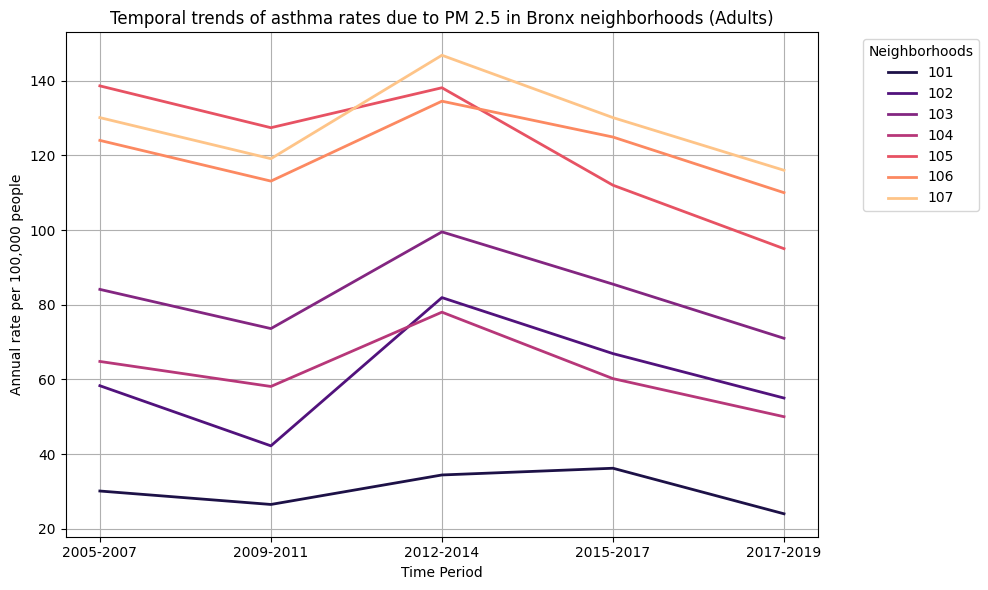

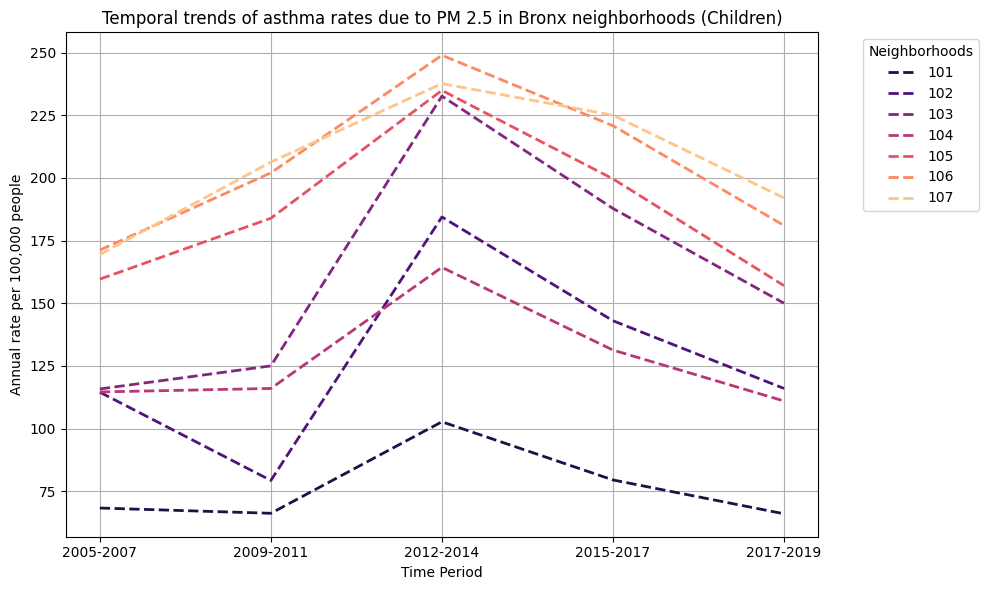

In [ ]:
annual_rates = bronx_data.groupby(['TimePeriod', 'GeoID']).agg({
    'Estimated annual rate (age 18+) per 100,000 adults': 'mean',
    'Estimated annual rate (under age 18) per 100,000 children': 'mean'
}).reset_index()

plt.figure(figsize=(10, 6))

colors = sns.color_palette("magma", len(bronx_neighborhoods))

for idx, geo_id in enumerate(bronx_neighborhoods):
    subset = annual_rates[annual_rates['GeoID'] == geo_id]
    plt.plot(subset['TimePeriod'], subset['Estimated annual rate (age 18+) per 100,000 adults'],
             label=f'{geo_id}', color=colors[idx], linestyle='-', linewidth=2)

plt.xlabel('Time Period')
plt.ylabel('Annual rate per 100,000 people')
plt.title('Temporal trends of asthma rates due to PM 2.5 in Bronx neighborhoods (Adults)')
plt.legend(title='Neighborhoods', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

for idx, geo_id in enumerate(bronx_neighborhoods):
    subset = annual_rates[annual_rates['GeoID'] == geo_id]
    plt.plot(subset['TimePeriod'], subset['Estimated annual rate (under age 18) per 100,000 children'],
             label=f'{geo_id}', color=colors[idx], linestyle='--', linewidth=2)

plt.xlabel('Time Period')
plt.ylabel('Annual rate per 100,000 people')
plt.title('Temporal trends of asthma rates due to PM 2.5 in Bronx neighborhoods (Children)')
plt.legend(title='Neighborhoods', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


## Hospitalization

### Ashtma hospitalizations due to Ozone

In [ ]:
hosp_ozone.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 18+),Estimated annual number (under age 18),"Estimated annual rate (age 18+) per 100,000 adults","Estimated annual rate (under age 18) per 100,000 children"
0,2017-2019,Borough,1,1,Bronx,74.0,105.0,7.0,27.0
1,2017-2019,Borough,2,1,Brooklyn,44.0,89.0,2.0,14.0
2,2017-2019,Borough,3,1,Manhattan,26.0,39.0,2.0,15.0
3,2017-2019,Borough,4,1,Queens,31.0,52.0,2.0,10.0
4,2017-2019,Borough,5,1,Staten Island,9.0,11.0,2.0,10.0


In [ ]:
hosp_ozone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 9 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   TimePeriod                                                 235 non-null    object 
 1   GeoTypeDesc                                                235 non-null    object 
 2   GeoID                                                      235 non-null    int64  
 3   GeoRank                                                    235 non-null    int64  
 4   Geography                                                  235 non-null    object 
 5   Estimated annual number (age 18+)                          235 non-null    float64
 6   Estimated annual number (under age 18)                     235 non-null    float64
 7   Estimated annual rate (age 18+) per 100,000 adults         235 non-null    float64
 8   Estimated a

#### By borough

In [ ]:
hosp_ozone_df = hosp_ozone[hosp_ozone['GeoTypeDesc'] == 'Borough']

In [ ]:
print(hosp_ozone_df.dtypes)

TimePeriod                                                    object
GeoTypeDesc                                                   object
GeoID                                                          int64
GeoRank                                                        int64
Geography                                                     object
Estimated annual number (age 18+)                            float64
Estimated annual number (under age 18)                       float64
Estimated annual rate (age 18+) per 100,000 adults           float64
Estimated annual rate (under age 18) per 100,000 children    float64
dtype: object


In [ ]:
print(hosp_ozone_df.describe())

           GeoID  GeoRank  Estimated annual number (age 18+)  \
count  25.000000     25.0                          25.000000   
mean    3.000000      1.0                          71.332000   
std     1.443376      0.0                          45.936747   
min     1.000000      1.0                           9.000000   
25%     2.000000      1.0                          31.000000   
50%     3.000000      1.0                          66.500000   
75%     4.000000      1.0                          97.900000   
max     5.000000      1.0                         149.300000   

       Estimated annual number (under age 18)  \
count                               25.000000   
mean                                76.116000   
std                                 47.764925   
min                                 11.000000   
25%                                 45.900000   
50%                                 72.500000   
75%                                124.800000   
max                            

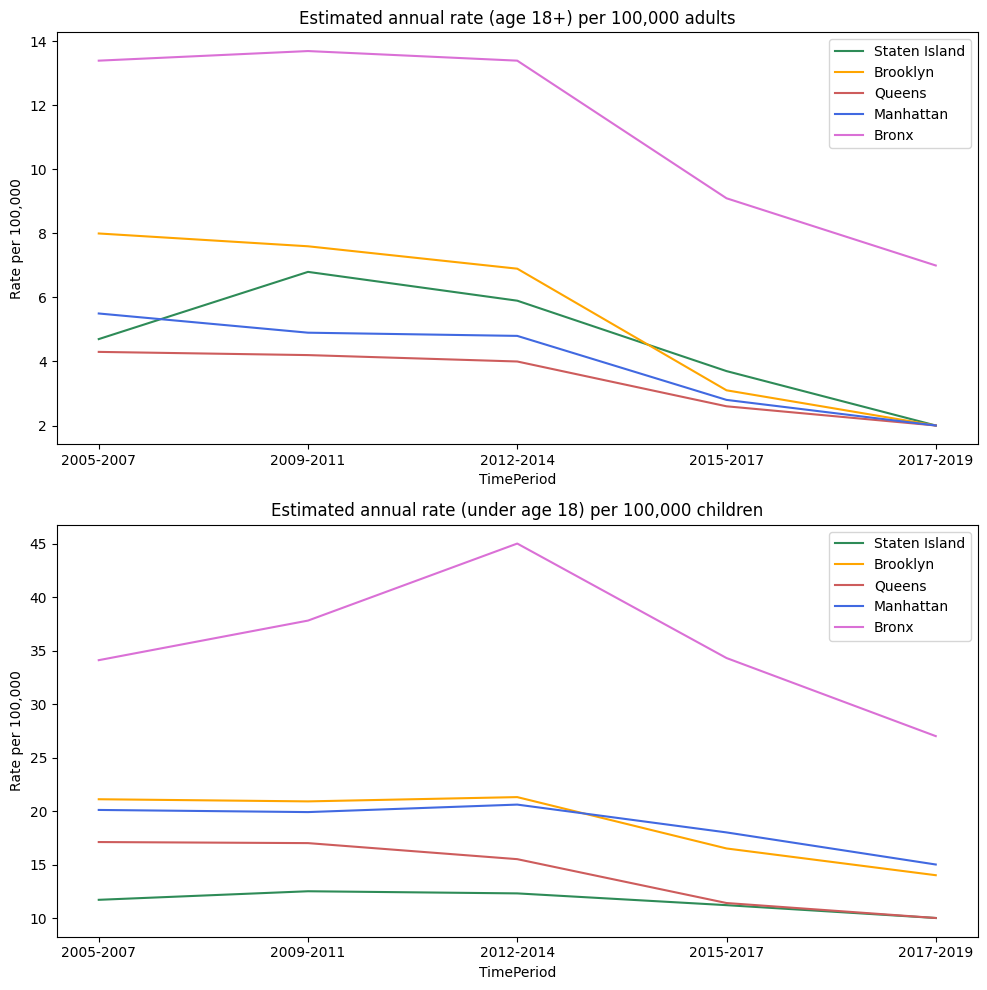

In [ ]:
hosp_ozone_df = hosp_ozone_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = hosp_ozone_df[hosp_ozone_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (age 18+) per 100,000 adults'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual rate (age 18+) per 100,000 adults')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Rate per 100,000')
axes[0].legend()

for borough in colors:
    borough_data = hosp_ozone_df[hosp_ozone_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (under age 18) per 100,000 children'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate (under age 18) per 100,000 children')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

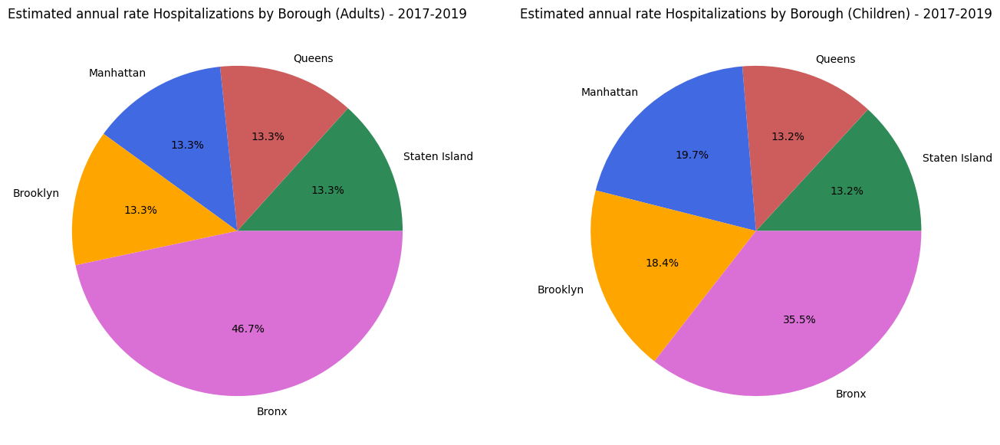

In [ ]:
time_period = '2017-2019'
filtered_df = hosp_ozone_df[hosp_ozone_df['TimePeriod'] == time_period]

fig, ax = plt.subplots(1, 2, figsize=(16, 7))

ax[0].pie(filtered_df['Estimated annual rate (age 18+) per 100,000 adults'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[0].set_title(f'Estimated annual rate Hospitalizations by Borough (Adults) - {time_period}')

ax[1].pie(filtered_df['Estimated annual rate (under age 18) per 100,000 children'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[1].set_title(f'Estimated annual rate Hospitalizations by Borough (Children) - {time_period}')

plt.show()

### Cardiovascular hospitalizations due to PM2.5 (age 40+)

In [ ]:
hosp_cv_pm25_40.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number,"Estimated annual rate per 100,000 adults"
0,2017-2019,Borough,1,1,Bronx,75.0,12.0
1,2017-2019,Borough,2,1,Brooklyn,126.0,11.0
2,2017-2019,Borough,3,1,Manhattan,70.0,9.0
3,2017-2019,Borough,4,1,Queens,89.0,8.0
4,2017-2019,Borough,5,1,Staten Island,27.0,11.0


In [ ]:
hosp_cv_pm25_40.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 7 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   TimePeriod                                235 non-null    object 
 1   GeoTypeDesc                               235 non-null    object 
 2   GeoID                                     235 non-null    int64  
 3   GeoRank                                   235 non-null    int64  
 4   Geography                                 235 non-null    object 
 5   Estimated annual number                   235 non-null    float64
 6   Estimated annual rate per 100,000 adults  235 non-null    object 
dtypes: float64(1), int64(2), object(4)
memory usage: 13.0+ KB


#### By borough

In [ ]:
hosp_cv_pm25_40_df = hosp_cv_pm25_40[hosp_cv_pm25_40['GeoTypeDesc'] == 'Borough']

In [ ]:
print(hosp_cv_pm25_40_df.dtypes)

TimePeriod                                   object
GeoTypeDesc                                  object
GeoID                                         int64
GeoRank                                       int64
Geography                                    object
Estimated annual number                     float64
Estimated annual rate per 100,000 adults     object
dtype: object


In [ ]:
hosp_cv_pm25_40_df['Estimated annual rate per 100,000 adults'] = pd.to_numeric(hosp_cv_pm25_40_df['Estimated annual rate per 100,000 adults'], errors='coerce')

<ipython-input-71-383cd955c6c5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hosp_cv_pm25_40_df['Estimated annual rate per 100,000 adults'] = pd.to_numeric(hosp_cv_pm25_40_df['Estimated annual rate per 100,000 adults'], errors='coerce')


In [ ]:
print(hosp_cv_pm25_40_df.describe())

           GeoID  GeoRank  Estimated annual number  \
count  25.000000     25.0                25.000000   
mean    3.000000      1.0               123.804000   
std     1.443376      0.0                70.016685   
min     1.000000      1.0                27.000000   
25%     2.000000      1.0                75.000000   
50%     3.000000      1.0               112.700000   
75%     4.000000      1.0               163.800000   
max     5.000000      1.0               311.900000   

       Estimated annual rate per 100,000 adults  
count                                 25.000000  
mean                                  16.796000  
std                                    5.947372  
min                                    8.000000  
25%                                   12.300000  
50%                                   15.500000  
75%                                   20.600000  
max                                   31.300000  


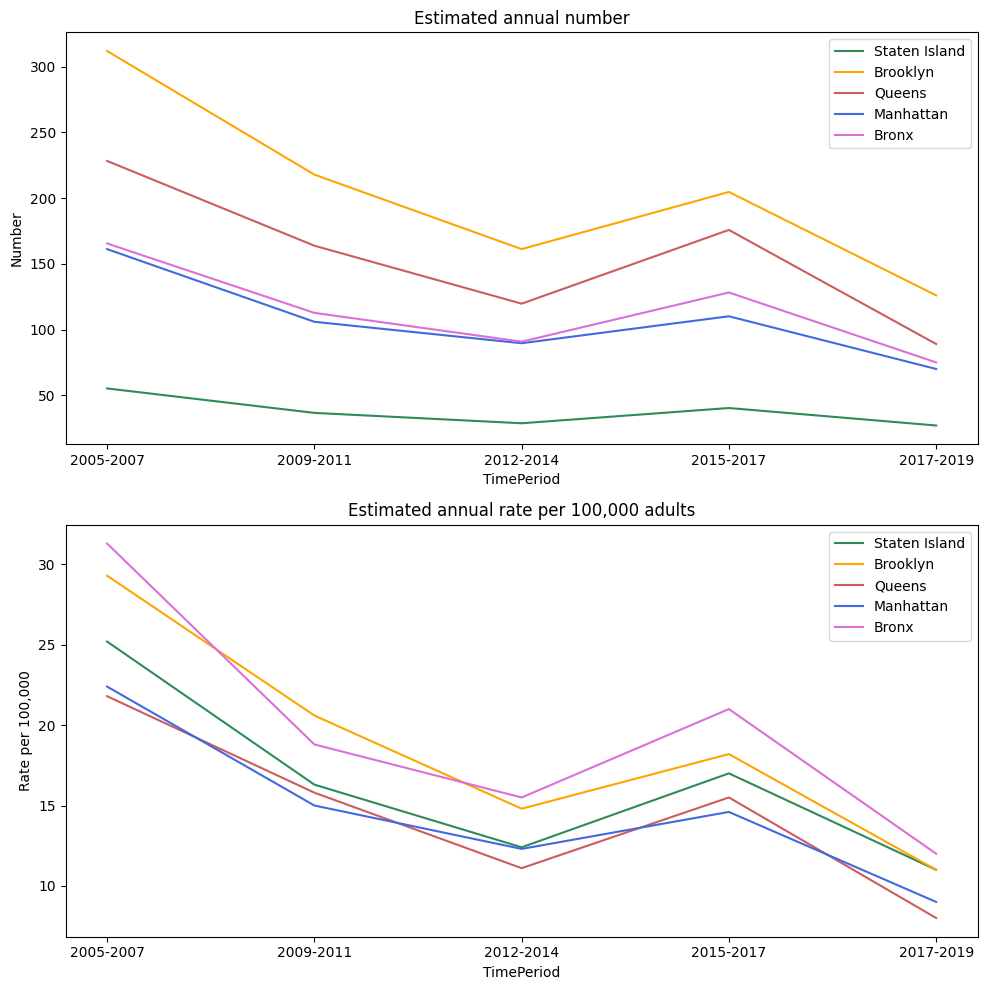

In [ ]:
hosp_cv_pm25_40_df = hosp_cv_pm25_40_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = hosp_cv_pm25_40_df[hosp_cv_pm25_40_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual number'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual number')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Number')
axes[0].legend()

for borough in colors:
    borough_data = hosp_cv_pm25_40_df[hosp_cv_pm25_40_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate per 100,000 adults'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate per 100,000 adults')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

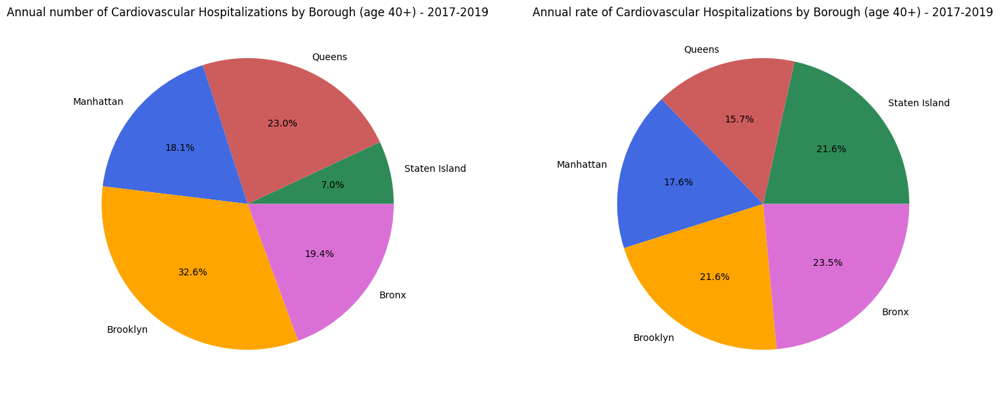

In [ ]:
time_period = '2017-2019'
filtered_df = hosp_cv_pm25_40_df[hosp_cv_pm25_40_df['TimePeriod'] == time_period]

fig, ax = plt.subplots(1, 2, figsize=(18, 7))

ax[0].pie(filtered_df['Estimated annual number'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[0].set_title(f'Annual number of Cardiovascular Hospitalizations by Borough (age 40+) - {time_period}')

ax[1].pie(filtered_df['Estimated annual rate per 100,000 adults'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[1].set_title(f'Annual rate of Cardiovascular Hospitalizations by Borough (age 40+) - {time_period}')

plt.show()

### Respiratory hospitalizations due to PM2.5 (age 20+)

In [ ]:
hosp_r_pm25_20.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number,"Estimated annual rate per 100,000 adults"
0,2017-2019,Borough,1,1,Bronx,130.0,12.0
1,2017-2019,Borough,2,1,Brooklyn,145.0,7.0
2,2017-2019,Borough,3,1,Manhattan,83.0,6.0
3,2017-2019,Borough,4,1,Queens,102.0,5.0
4,2017-2019,Borough,5,1,Staten Island,40.0,10.0


In [ ]:
hosp_r_pm25_20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 7 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   TimePeriod                                235 non-null    object 
 1   GeoTypeDesc                               235 non-null    object 
 2   GeoID                                     235 non-null    int64  
 3   GeoRank                                   235 non-null    int64  
 4   Geography                                 235 non-null    object 
 5   Estimated annual number                   235 non-null    float64
 6   Estimated annual rate per 100,000 adults  235 non-null    object 
dtypes: float64(1), int64(2), object(4)
memory usage: 13.0+ KB


#### By borough

In [ ]:
hosp_r_pm25_20_df = hosp_r_pm25_20[hosp_r_pm25_20['GeoTypeDesc'] == 'Borough']

In [ ]:
print(hosp_r_pm25_20_df.dtypes)

TimePeriod                                   object
GeoTypeDesc                                  object
GeoID                                         int64
GeoRank                                       int64
Geography                                    object
Estimated annual number                     float64
Estimated annual rate per 100,000 adults     object
dtype: object


In [ ]:
hosp_r_pm25_20_df['Estimated annual rate per 100,000 adults'] = pd.to_numeric(hosp_r_pm25_20_df['Estimated annual rate per 100,000 adults'], errors='coerce')

<ipython-input-84-06b5173a8a4c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hosp_r_pm25_20_df['Estimated annual rate per 100,000 adults'] = pd.to_numeric(hosp_r_pm25_20_df['Estimated annual rate per 100,000 adults'], errors='coerce')


In [ ]:
print(hosp_r_pm25_20_df.describe())

           GeoID  GeoRank  Estimated annual number  \
count  25.000000     25.0                25.000000   
mean    3.000000      1.0               164.684000   
std     1.443376      0.0                82.404135   
min     1.000000      1.0                40.000000   
25%     2.000000      1.0               102.000000   
50%     3.000000      1.0               164.600000   
75%     4.000000      1.0               217.000000   
max     5.000000      1.0               351.700000   

       Estimated annual rate per 100,000 adults  
count                                 25.000000  
mean                                  13.640000  
std                                    5.605949  
min                                    5.000000  
25%                                   10.000000  
50%                                   12.600000  
75%                                   17.500000  
max                                   30.800000  


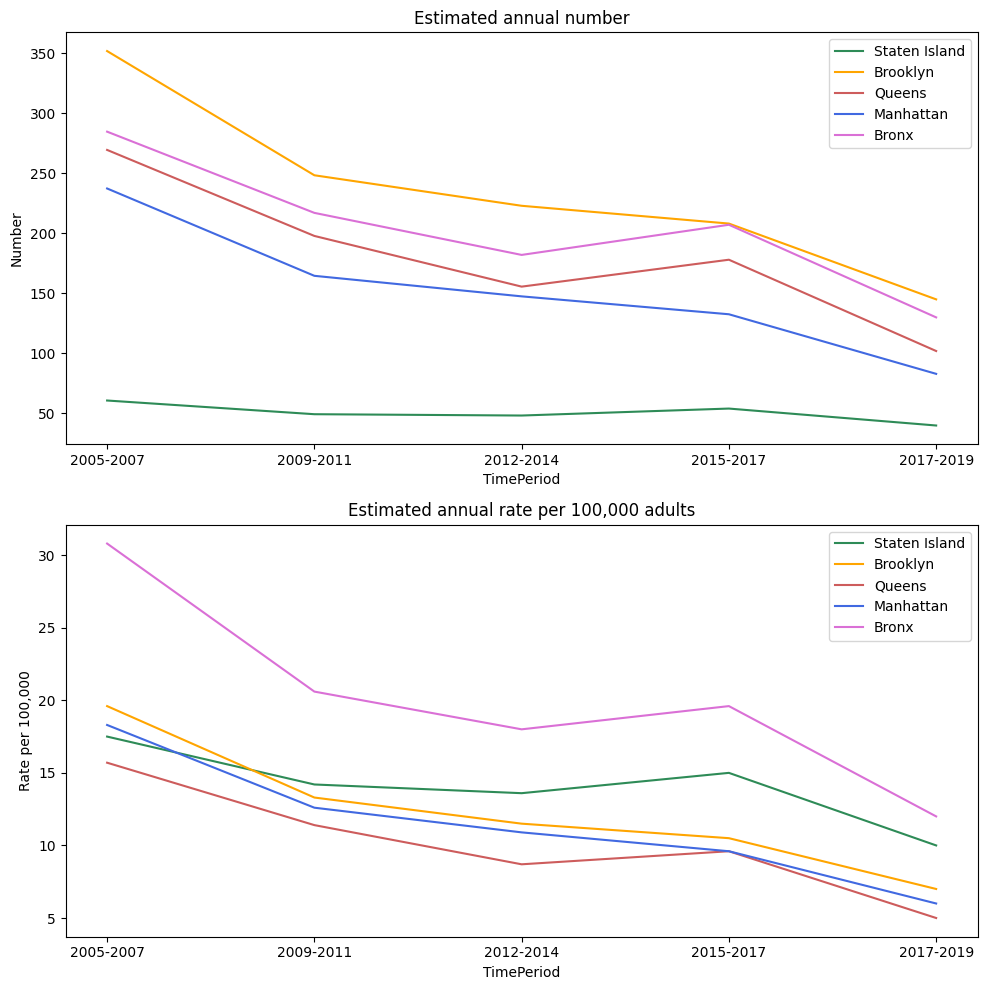

In [ ]:
hosp_r_pm25_20_df = hosp_r_pm25_20_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = hosp_r_pm25_20_df[hosp_r_pm25_20_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual number'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual number')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Number')
axes[0].legend()

for borough in colors:
    borough_data = hosp_r_pm25_20_df[hosp_r_pm25_20_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate per 100,000 adults'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate per 100,000 adults')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

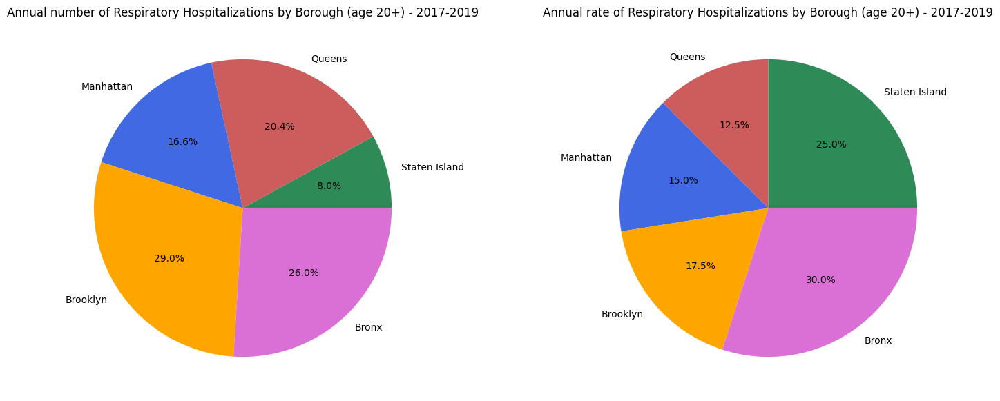

In [ ]:
time_period = '2017-2019'
filtered_df = hosp_r_pm25_20_df[hosp_r_pm25_20_df['TimePeriod'] == time_period]

fig, ax = plt.subplots(1, 2, figsize=(18, 7))

ax[0].pie(filtered_df['Estimated annual number'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[0].set_title(f'Annual number of Respiratory Hospitalizations by Borough (age 20+) - {time_period}')

ax[1].pie(filtered_df['Estimated annual rate per 100,000 adults'], labels=filtered_df['Geography'],
          autopct='%1.1f%%', colors=[colors[borough] for borough in filtered_df['Geography']])
ax[1].set_title(f'Annual rate of Respiratory Hospitalizations by Borough (age 20+) - {time_period}')

plt.show()

## Deaths

### Due to Ozone

In [ ]:
deaths_ozone.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number,"Estimated annual rate per 100,000"
0,2017-2019,Borough,1,1,Bronx,71.0,5.0
1,2017-2019,Borough,2,1,Brooklyn,130.0,5.0
2,2017-2019,Borough,3,1,Manhattan,67.0,4.0
3,2017-2019,Borough,4,1,Queens,111.0,5.0
4,2017-2019,Borough,5,1,Staten Island,33.0,7.0


In [ ]:
deaths_ozone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   TimePeriod                         235 non-null    object 
 1   GeoTypeDesc                        235 non-null    object 
 2   GeoID                              235 non-null    int64  
 3   GeoRank                            235 non-null    int64  
 4   Geography                          235 non-null    object 
 5   Estimated annual number            235 non-null    float64
 6   Estimated annual rate per 100,000  235 non-null    float64
dtypes: float64(2), int64(2), object(3)
memory usage: 13.0+ KB


#### By borough

In [ ]:
deathsozone_borough_df = deaths_ozone[deaths_ozone['GeoTypeDesc'] == 'Borough']

In [ ]:
print(deathsozone_borough_df.dtypes)

TimePeriod                            object
GeoTypeDesc                           object
GeoID                                  int64
GeoRank                                int64
Geography                             object
Estimated annual number              float64
Estimated annual rate per 100,000    float64
dtype: object


In [ ]:
print(deathsozone_borough_df.describe())

           GeoID  GeoRank  Estimated annual number  \
count  25.000000     25.0                25.000000   
mean    3.000000      1.0                81.404000   
std     1.443376      0.0                36.157958   
min     1.000000      1.0                33.000000   
25%     2.000000      1.0                57.100000   
50%     3.000000      1.0                68.100000   
75%     4.000000      1.0               111.500000   
max     5.000000      1.0               140.800000   

       Estimated annual rate per 100,000  
count                          25.000000  
mean                            5.196000  
std                             1.286623  
min                             3.800000  
25%                             4.200000  
50%                             5.000000  
75%                             5.200000  
max                             7.800000  


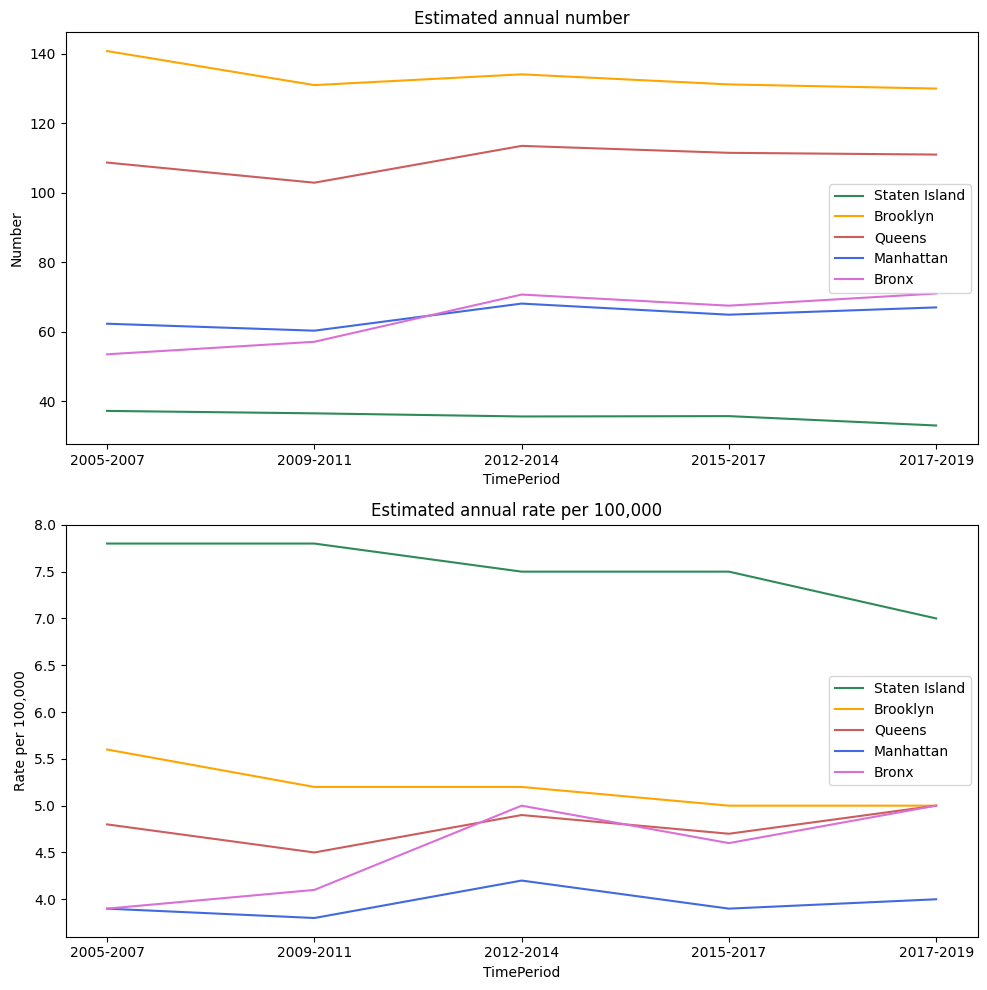

In [ ]:
deathsozone_borough_df = deathsozone_borough_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = deathsozone_borough_df[deathsozone_borough_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual number'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual number')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Number')
axes[0].legend()

for borough in colors:
    borough_data = deathsozone_borough_df[deathsozone_borough_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate per 100,000'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate per 100,000  ')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

#### By UHF42

In [ ]:
deathsozone_uhf_df = deaths_ozone[deaths_ozone['GeoTypeDesc'] == 'UHF 42']

In [ ]:
deathsozone_uhf_df

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number,"Estimated annual rate per 100,000"
5,2017-2019,UHF 42,101,4,Kingsbridge - Riverdale,8.0,8.0
6,2017-2019,UHF 42,102,4,Northeast Bronx,13.0,6.0
7,2017-2019,UHF 42,103,4,Fordham - Bronx Pk,11.0,4.0
8,2017-2019,UHF 42,104,4,Pelham - Throgs Neck,16.0,5.0
9,2017-2019,UHF 42,105,4,Crotona -Tremont,8.0,4.0
...,...,...,...,...,...,...,...
230,2005-2007,UHF 42,410,4,Rockaways,12.5,11.7
231,2005-2007,UHF 42,501,4,Port Richmond,3.9,5.6
232,2005-2007,UHF 42,502,4,Stapleton - St. George,11.0,8.7
233,2005-2007,UHF 42,503,4,Willowbrook,8.3,9.3


In [ ]:
deathsozone_uhf_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 210 entries, 5 to 234
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   TimePeriod                         210 non-null    object 
 1   GeoTypeDesc                        210 non-null    object 
 2   GeoID                              210 non-null    int64  
 3   GeoRank                            210 non-null    int64  
 4   Geography                          210 non-null    object 
 5   Estimated annual number            210 non-null    float64
 6   Estimated annual rate per 100,000  210 non-null    float64
dtypes: float64(2), int64(2), object(3)
memory usage: 13.1+ KB


### Due to PM 2.5

In [ ]:
deaths_pm.head()

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 30+),"Estimated annual rate (age 30+) per 100,000 adults"
0,2017-2019,Borough,1,1,Bronx,320.0,37.0
1,2017-2019,Borough,2,1,Brooklyn,561.0,35.0
2,2017-2019,Borough,3,1,Manhattan,365.0,33.0
3,2017-2019,Borough,4,1,Queens,418.0,27.0
4,2017-2019,Borough,5,1,Staten Island,134.0,43.0


In [ ]:
deaths_pm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 7 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   TimePeriod                                          235 non-null    object 
 1   GeoTypeDesc                                         235 non-null    object 
 2   GeoID                                               235 non-null    int64  
 3   GeoRank                                             235 non-null    int64  
 4   Geography                                           235 non-null    object 
 5   Estimated annual number (age 30+)                   235 non-null    float64
 6   Estimated annual rate (age 30+) per 100,000 adults  235 non-null    object 
dtypes: float64(1), int64(2), object(4)
memory usage: 13.0+ KB


In [ ]:
deaths_pm['Estimated annual rate (age 30+) per 100,000 adults'] = pd.to_numeric(deaths_pm['Estimated annual rate (age 30+) per 100,000 adults'], errors='coerce')

#### By borough

In [ ]:
deathspm_borough_df = deaths_pm[deaths_pm['GeoTypeDesc'] == 'Borough']

In [ ]:
print(deathspm_borough_df.dtypes)

TimePeriod                                             object
GeoTypeDesc                                            object
GeoID                                                   int64
GeoRank                                                 int64
Geography                                              object
Estimated annual number (age 30+)                     float64
Estimated annual rate (age 30+) per 100,000 adults    float64
dtype: object


In [ ]:
print(deathspm_borough_df.describe())

           GeoID  GeoRank  Estimated annual number (age 30+)  \
count  25.000000     25.0                          25.000000   
mean    3.000000      1.0                         453.072000   
std     1.443376      0.0                         211.494881   
min     1.000000      1.0                         134.000000   
25%     2.000000      1.0                         362.400000   
50%     3.000000      1.0                         451.800000   
75%     4.000000      1.0                         561.500000   
max     5.000000      1.0                         969.500000   

       Estimated annual rate (age 30+) per 100,000 adults  
count                                          25.000000   
mean                                           46.720000   
std                                            12.697769   
min                                            27.000000   
25%                                            38.000000   
50%                                            44.400000   
75%

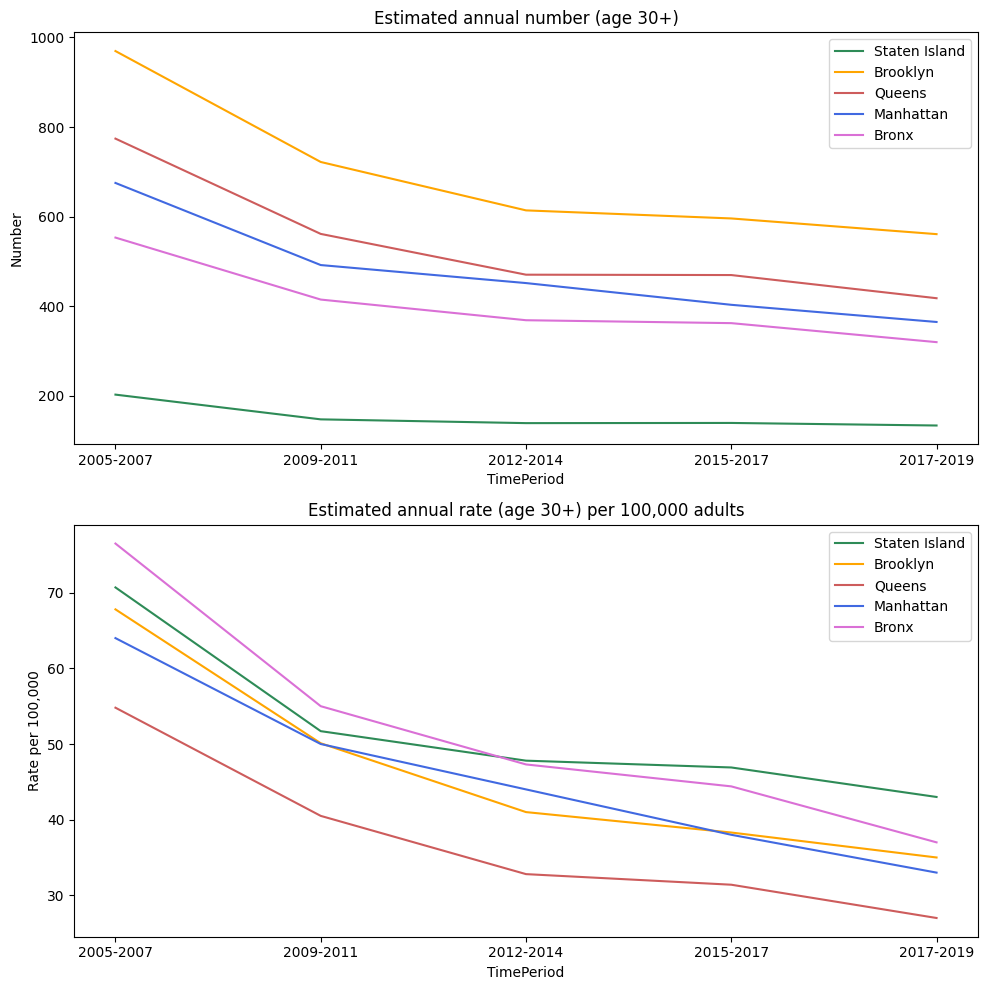

In [ ]:
deathspm_borough_df = deathspm_borough_df.sort_values(by='TimePeriod', ascending=True)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for borough in colors:
    borough_data = deathspm_borough_df[deathspm_borough_df['Geography'] == borough]
    axes[0].plot(borough_data['TimePeriod'], borough_data['Estimated annual number (age 30+)'], label=borough, color=colors[borough])

axes[0].set_title('Estimated annual number (age 30+)')
axes[0].set_xlabel('TimePeriod')
axes[0].set_ylabel('Number')
axes[0].legend()

for borough in colors:
    borough_data = deathspm_borough_df[deathspm_borough_df['Geography'] == borough]
    axes[1].plot(borough_data['TimePeriod'], borough_data['Estimated annual rate (age 30+) per 100,000 adults'], label=borough, color=colors[borough])

axes[1].set_title('Estimated annual rate (age 30+) per 100,000 adults')
axes[1].set_xlabel('TimePeriod')
axes[1].set_ylabel('Rate per 100,000')
axes[1].legend()

plt.tight_layout()
plt.show()

#### By UHF42

In [ ]:
deathspm_uhf_df = deaths_pm[deaths_pm['GeoTypeDesc'] == 'UHF 42']

In [ ]:
deathspm_uhf_df

,TimePeriod,GeoTypeDesc,GeoID,GeoRank,Geography,Estimated annual number (age 30+),"Estimated annual rate (age 30+) per 100,000 adults"
5,2017-2019,UHF 42,101,4,Kingsbridge - Riverdale,32.0,50.0
6,2017-2019,UHF 42,102,4,Northeast Bronx,52.0,39.0
7,2017-2019,UHF 42,103,4,Fordham - Bronx Pk,52.0,35.0
8,2017-2019,UHF 42,104,4,Pelham - Throgs Neck,69.0,37.0
9,2017-2019,UHF 42,105,4,Crotona -Tremont,40.0,34.0
...,...,...,...,...,...,...,...
230,2005-2007,UHF 42,410,4,Rockaways,63.1,NaN
231,2005-2007,UHF 42,501,4,Port Richmond,25.2,NaN
232,2005-2007,UHF 42,502,4,Stapleton - St. George,60.5,NaN
233,2005-2007,UHF 42,503,4,Willowbrook,41.4,NaN


In [ ]:
deathspm_uhf_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 210 entries, 5 to 234
Data columns (total 7 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   TimePeriod                                          210 non-null    object 
 1   GeoTypeDesc                                         210 non-null    object 
 2   GeoID                                               210 non-null    int64  
 3   GeoRank                                             210 non-null    int64  
 4   Geography                                           210 non-null    object 
 5   Estimated annual number (age 30+)                   210 non-null    float64
 6   Estimated annual rate (age 30+) per 100,000 adults  126 non-null    float64
dtypes: float64(2), int64(2), object(3)
memory usage: 13.1+ KB


# Cluster analysis

In [ ]:
df_uhf42 = df_aq[df_aq['Geo Type Name'] == 'UHF42']

In [ ]:
def extract_year(time_period):
    match = re.search(r'\b(20\d{2})\b', time_period)
    if match:
        return int(match.group(1))
    return np.nan

In [ ]:
df_uhf42['Year'] = df_uhf42['Time Period'].apply(extract_year)

<ipython-input-108-5d907536f5bb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_uhf42['Year'] = df_uhf42['Time Period'].apply(extract_year)


In [ ]:
print(df_uhf42[['Time Period', 'Year']].head())

           Time Period  Year
0                 2015  2015
1                 2015  2015
2  Annual Average 2012  2012
3  Annual Average 2012  2012
4          Summer 2022  2022


In [ ]:
df_filtered = df_uhf42.dropna(subset=['Year'])
columns_of_interest = ['Geo Place Name', 'Year', 'Indicator ID', 'Data Value']
df_filtered = df_filtered[columns_of_interest]

df_pivot = df_filtered.pivot_table(index=['Geo Place Name', 'Year'], columns='Indicator ID', values='Data Value', aggfunc='mean')

df_pivot = df_pivot.fillna(df_pivot.mean())

print(df_pivot.head())

Indicator ID                      365        375        386        639  \
Geo Place Name        Year                                               
Bayside - Little Neck 2005   9.320238  21.002857  30.474065  48.900000   
                      2008  12.200000  25.300000  30.474065  46.030476   
                      2009   9.566667  19.900000  27.400000  34.500000   
                      2010  10.800000  20.466667  33.500000  46.030476   
                      2011   9.866667  18.433333  33.000000  46.030476   

Indicator ID                      640       641        642        643  \
Geo Place Name        Year                                              
Bayside - Little Neck 2005  11.265476  1.408333  55.219048  60.500000   
                      2008  11.265476  1.408333  55.219048  73.688889   
                      2009  11.265476  1.408333  55.219048  73.688889   
                      2010  11.265476  1.408333  55.219048  85.900000   
                      2011  11.265476  1.40

In [ ]:
name_corrections = {
    'Port Richmond': 'Port  Richmond',
    'Fordham - Bronx Pk': 'Fordham - Bronx Park',
    'Gramercy Park - Murray Hill': 'Gramercy Park -  Murray Hill',
    'Washington Heights': 'Washington Heights - Inwood',
    'Crotona -Tremont': 'Crotona - Tremont',
    'Rockaways': 'Rockaway',
    'Greenwich Village - SoHo': 'Greenwich Village - Soho',
    'Downtown - Heights - Slope': 'Downtown  - Heights - Slope'
}

In [ ]:
df_pivot_reset = df_pivot.reset_index()

In [ ]:
df_pivot_reset['Geo Place Name'] = df_pivot_reset['Geo Place Name'].replace(name_corrections)

gdf_UHF42['GEONAME'] = gdf_UHF42['GEONAME'].str.strip()

df_pivot_names = set(df_pivot_reset['Geo Place Name'])
gdf_names = set(gdf_UHF42['GEONAME'])

matching_names = df_pivot_names.intersection(gdf_names)
non_matching_df_pivot_names = df_pivot_names.difference(gdf_names)
non_matching_gdf_names = gdf_names.difference(df_pivot_names)

print("Corresponding names:")
print(matching_names)
print("\nNames in df_pivot but not in gdf_uhf42:")
print(non_matching_df_pivot_names)
print("\nNames in gdf_uhf42 but not in df_pivot:")
print(non_matching_gdf_names)

Corresponding names:
{'Long Island City - Astoria', 'Coney Island - Sheepshead Bay', 'Williamsburg - Bushwick', 'Pelham - Throgs Neck', 'Canarsie - Flatlands', 'Fordham - Bronx Park', 'Ridgewood - Forest Hills', 'Bensonhurst - Bay Ridge', 'Union Square - Lower East Side', 'Washington Heights - Inwood', 'Flushing - Clearview', 'Southwest Queens', 'Fresh Meadows', 'Central Harlem - Morningside Heights', 'Southeast Queens', 'Rockaway', 'Port  Richmond', 'Chelsea - Clinton', 'East Harlem', 'Bayside - Little Neck', 'Jamaica', 'Greenwich Village - Soho', 'High Bridge - Morrisania', 'South Beach - Tottenville', 'East Flatbush - Flatbush', 'Downtown  - Heights - Slope', 'Hunts Point - Mott Haven', 'Kingsbridge - Riverdale', 'Sunset Park', 'West Queens', 'Greenpoint', 'Bedford Stuyvesant - Crown Heights', 'East New York', 'Crotona - Tremont', 'Northeast Bronx', 'Upper East Side', 'Lower Manhattan', 'Stapleton - St. George', 'Borough Park', 'Gramercy Park -  Murray Hill', 'Upper West Side', 'Wil

Year: 2005
Silhouette Score: 0.3710758927712502
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             9.320238  21.002857  30.474065  80.509091  11.265476  1.408333   
1             9.320238  21.002857  30.474065  62.177419  11.265476  1.408333   

Indicator ID        642        643        644       645  ...       647  \
Cluster                                                  ...             
0             55.219048  63.227273  59.181818  3.490909  ...  3.290909   
1             55.219048  68.096774  63.574194  3.890323  ...  3.174194   

Indicator ID         648        650        651       652         653  \
Cluster                                                                
0             241.972727  31.963636  34.354545  4.509091  164.936364   
1              75.148387  16.829032  23.277419  5.277419   58.680645   

Indica

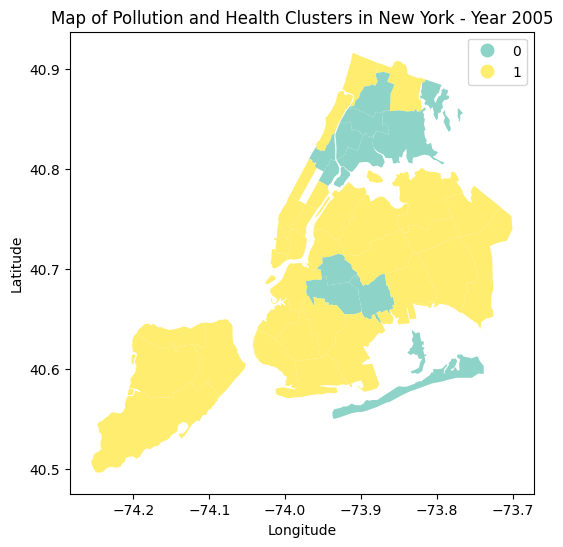

Year: 2008
Silhouette Score: 0.4933411316210689
Summary of variables for each cluster:
Indicator ID        365        375        386        639        640       641  \
Cluster                                                                         
0             14.977778  35.733333  30.474065  46.030476  11.265476  1.408333   
1             12.487500  27.258333  30.474065  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905

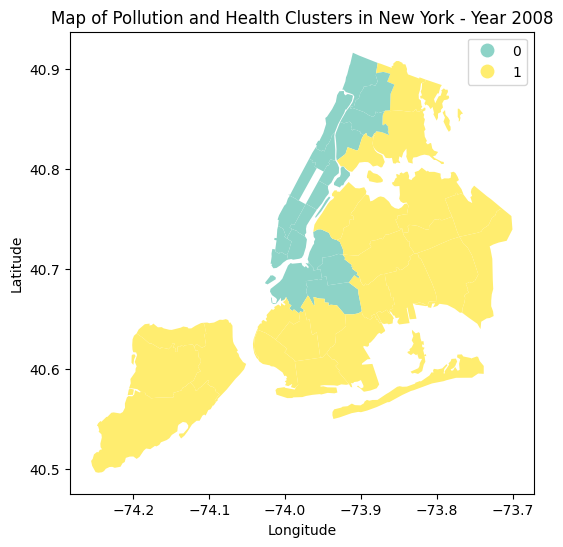

Year: 2009
Silhouette Score: 0.394188289322473
Summary of variables for each cluster:
Indicator ID        365        375     386        639        640       641  \
Cluster                                                                      
0             10.993333  25.913333  25.545  55.140000  11.265476  1.408333   
1             10.809375  24.718750  25.900  47.421875  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647         648  \
Cluster                                                  ...                    
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  205.220000   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3   67.515625   

Indicator ID      650        651       652         653        655        657  \
Cluster                                                                        
0             21.9500  22.500000  3.810000  192.030000  39.080000  109.70000   
1             12.1125  16.271875  5.

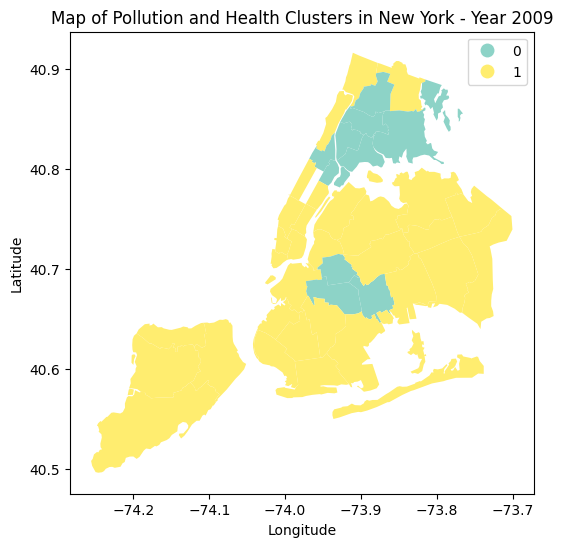

Year: 2010
Silhouette Score: 0.48943325942336446
Summary of variables for each cluster:
Indicator ID        365        375        386        639        640       641  \
Cluster                                                                         
0             13.004444  30.144444  29.326667  46.030476  11.265476  1.408333   
1             11.183951  21.956790  33.962963  46.030476  11.265476  1.408333   

Indicator ID        642         643         644       645  ...  647   648  \
Cluster                                                    ...              
0             55.219048  111.346667  100.946667  5.833333  ...  2.3  88.0   
1             55.219048   52.848148   49.866667  2.088889  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429 

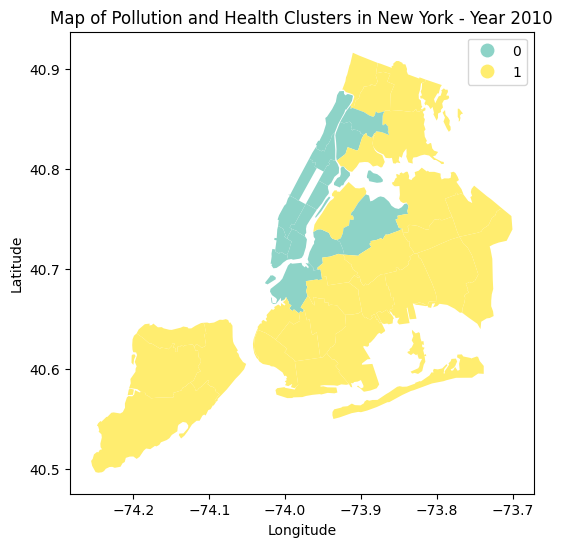

Year: 2011
Silhouette Score: 0.5848060778901397
Summary of variables for each cluster:
Indicator ID        365        375       386        639        640       641  \
Cluster                                                                        
0             12.040000  30.080000  27.02000  46.030476  11.265476  1.408333   
1             10.279167  20.809375  33.08125  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...       647   648  \
Cluster                                                  ...                   
0             55.219048  73.688889  67.974603  3.902381  ...  2.660000  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  1.990625  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.

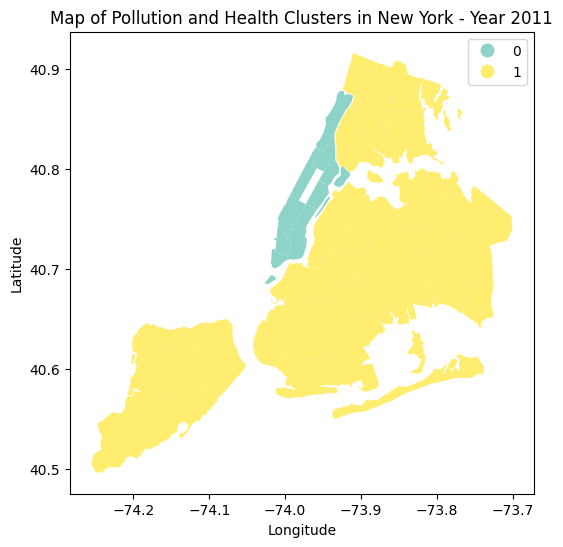

Year: 2012
Silhouette Score: 0.42261497603442355
Summary of variables for each cluster:
Indicator ID        365        375        386        639        640       641  \
Cluster                                                                         
0             10.445455  22.518182  33.509091  46.336364  11.265476  1.408333   
1             10.339785  22.015054  32.483871  40.022581  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647         648  \
Cluster                                                  ...                    
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  191.918182   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3   54.535484   

Indicator ID        650        651       652         653        655  \
Cluster                                                               
0             17.972727  17.063636  4.572727  221.381818  44.454545   
1              9.951613  12.093548  5.303226   68

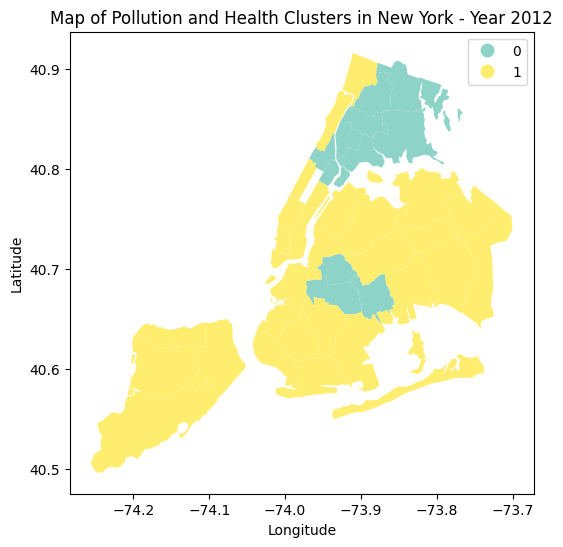

Year: 2013
Silhouette Score: 0.63918930646092
Summary of variables for each cluster:
Indicator ID        365        375        386        639     640       641  \
Cluster                                                                      
0             12.562500  29.704167  25.387500  46.030476  57.925  6.687500   
1             10.294118  20.701961  30.932353  46.030476   4.400  0.529412   

Indicator ID         642        643        644       645  ...  647   648  \
Cluster                                                   ...              
0             187.475000  73.688889  67.974603  3.902381  ...  2.3  88.0   
1              27.288235  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94.16428

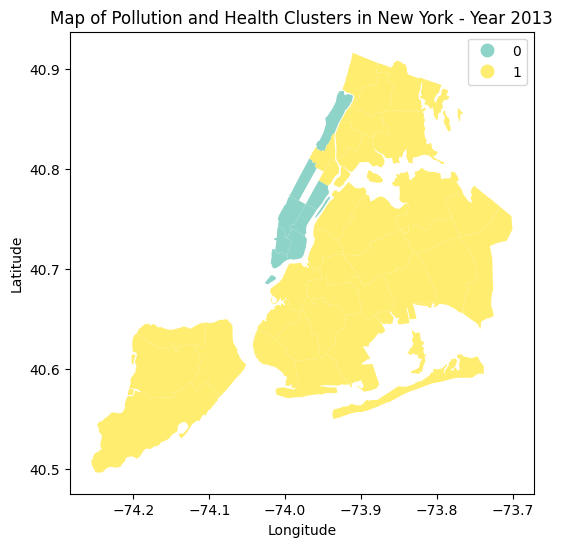

Year: 2014
Silhouette Score: 0.4142129033243061
Summary of variables for each cluster:
Indicator ID        365        375        386        639        640       641  \
Cluster                                                                         
0             10.040278  23.348611  29.050000  46.030476  11.265476  1.408333   
1              8.496296  17.603704  32.072222  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...       647   648  \
Cluster                                                  ...                   
0             55.219048  73.688889  67.974603  3.902381  ...  1.645833  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  1.411111  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381 

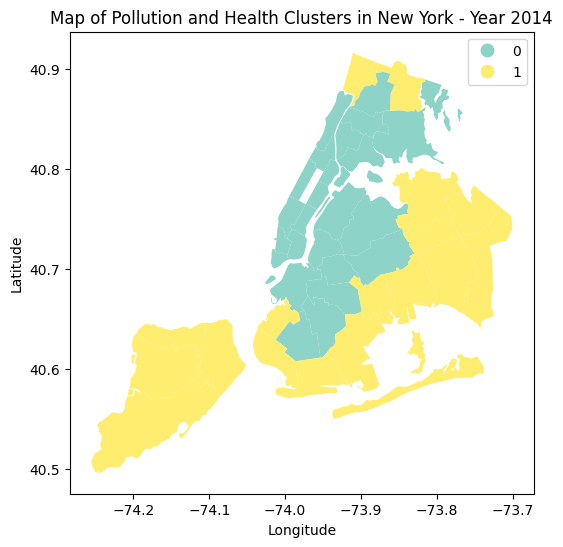

Year: 2015
Silhouette Score: 0.3263829788026376
Summary of variables for each cluster:
Indicator ID       365        375        386        639       640       641  \
Cluster                                                                       
0             9.078889  19.861111  30.923333  36.686667  9.066667  1.256667   
1             9.213889  20.255556  30.466667  42.783333  5.108333  0.758333   

Indicator ID        642        643        644       645  ...  647         648  \
Cluster                                                  ...                    
0             57.336667  73.688889  67.974603  3.902381  ...  2.3   43.033333   
1             40.891667  73.688889  67.974603  3.902381  ...  2.3  145.358333   

Indicator ID        650        651       652         653        655  \
Cluster                                                               
0              9.863333  15.083333  5.023333   58.836667  10.260000   
1             17.800000  21.641667  4.450000  182.425000  

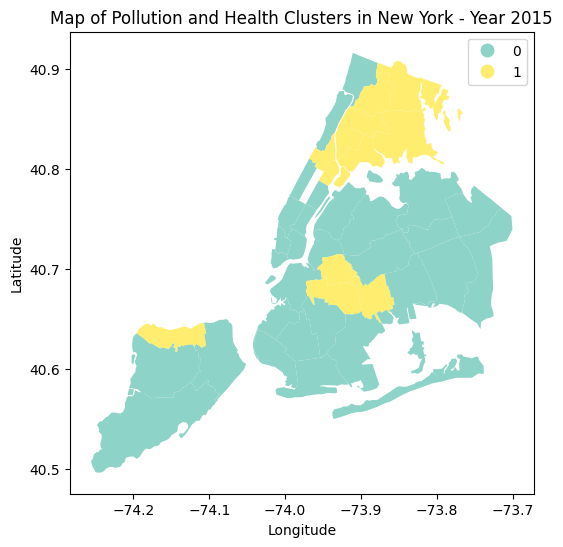

Year: 2016
Silhouette Score: 0.4730031795191733
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             9.031481  23.507407  31.344444  46.030476  11.265476  1.408333   
1             7.605556  17.761111  34.079167  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94

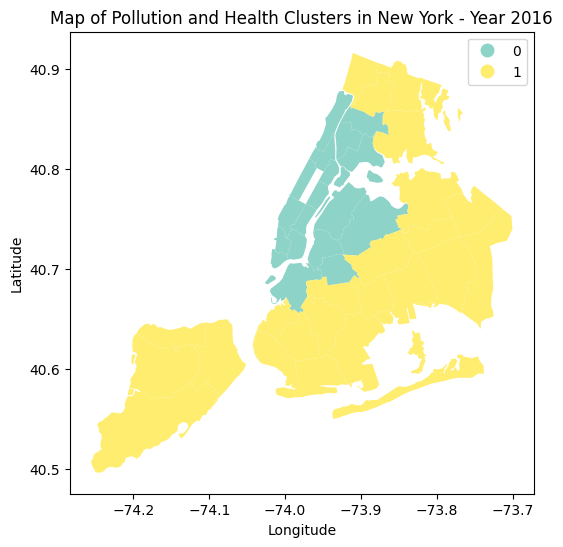

Year: 2017
Silhouette Score: 0.3535584212521902
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             8.588889  19.873333  28.693333  32.500000  11.265476  1.408333   
1             8.616667  20.341667  28.500000  37.083333  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647         648  \
Cluster                                                  ...                    
0             55.219048  73.688889  67.974603  3.902381  ...  2.3   37.066667   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  110.583333   

Indicator ID        650    651       652         653        655   657  \
Cluster                                                                 
0              6.100000   8.50  4.933333   51.233333   9.066667  16.3   
1             10.583333  12.25  4.500000  148.66

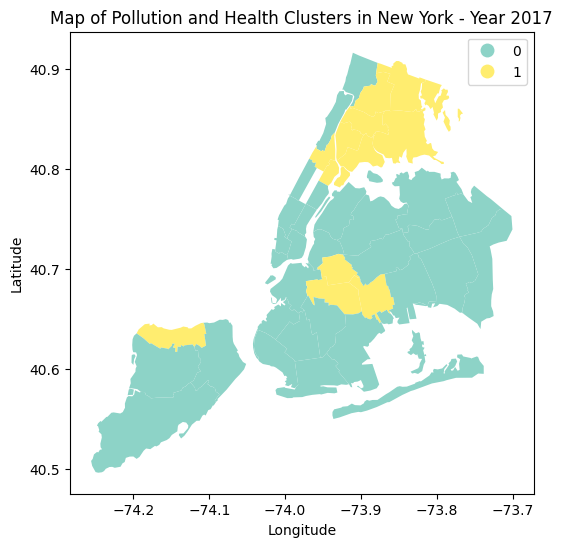

Year: 2018
Silhouette Score: 0.5750231914399246
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             7.562745  17.086275  30.573529  46.030476  11.265476  1.408333   
1             9.733333  24.375000  26.387500  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94

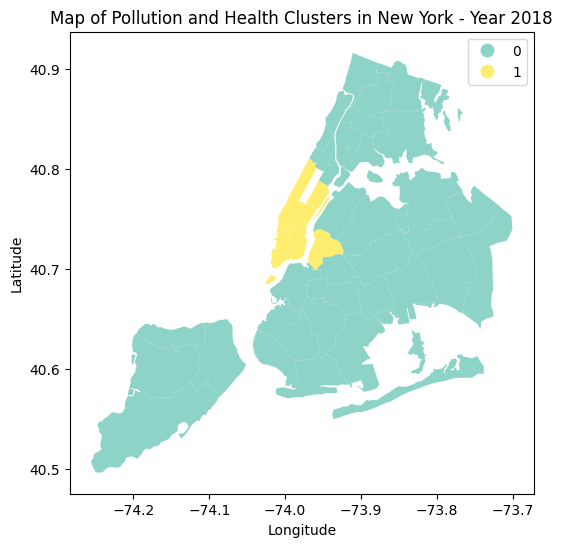

Year: 2019
Silhouette Score: 0.4973619853968044
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             8.702083  22.831250  26.806250  46.030476  11.265476  1.408333   
1             7.174359  16.820513  31.080769  46.030476  11.265476  1.408333   

Indicator ID        642         643         644       645  ...  647   648  \
Cluster                                                    ...              
0             55.219048  123.500000  111.225000  7.468750  ...  2.3  88.0   
1             55.219048   54.046154   50.107692  2.665385  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.94

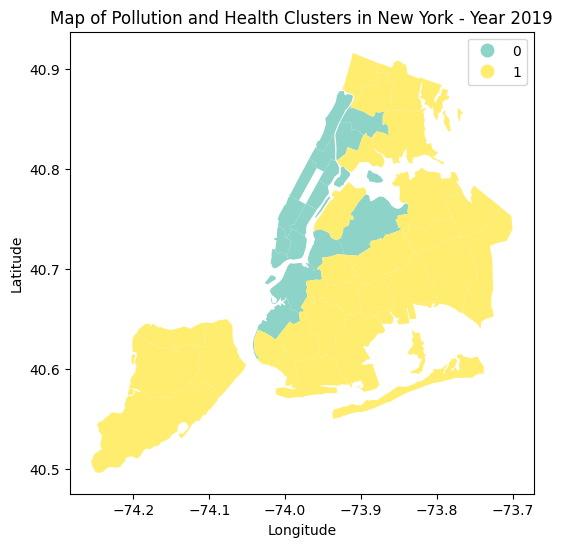

Year: 2020
Silhouette Score: 0.4298127399401766
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             6.562626  15.937374  29.896970  46.030476  11.265476  1.408333   
1             7.774074  20.640741  28.644444  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94

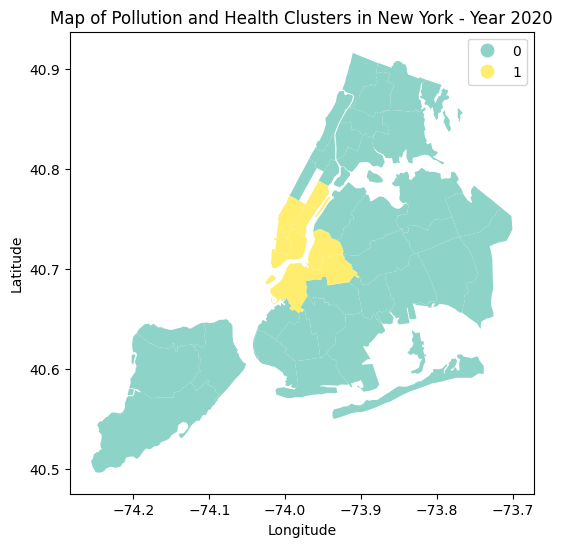

Year: 2021
Silhouette Score: 0.491879982720865
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             8.035088  19.549123  28.400000  46.030476  11.265476  1.408333   
1             7.052174  14.933333  30.665217  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94.

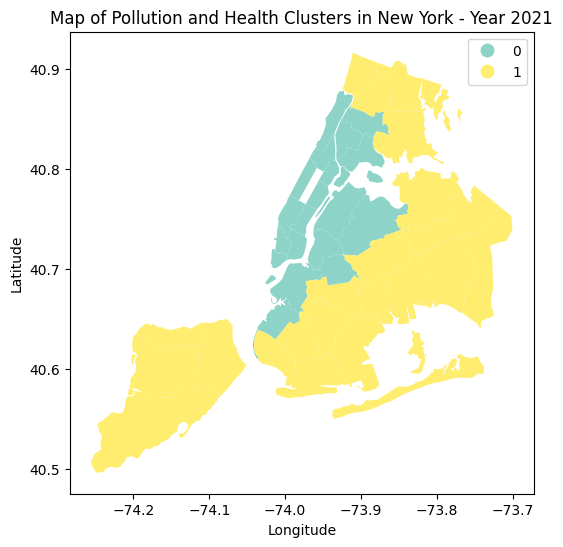

Year: 2022
Silhouette Score: 0.5178135197856595
Summary of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             6.895652  15.906522  31.465217  46.030476  11.265476  1.408333   
1             5.818421  11.792105  35.005263  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94

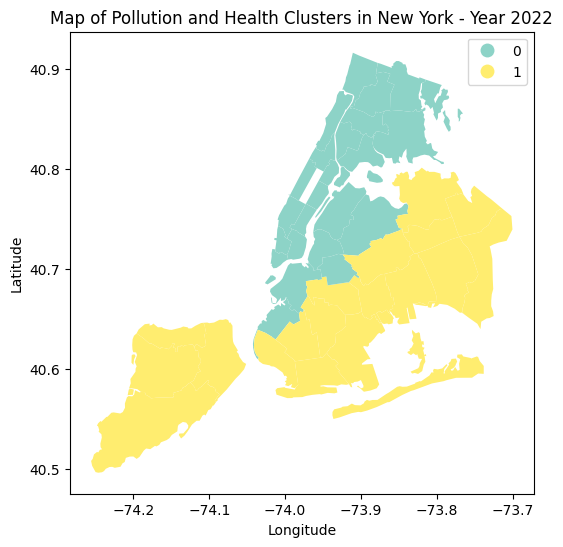

In [ ]:
years = df_pivot_reset['Year'].unique()

for year in years:
    df_year = df_pivot_reset[df_pivot_reset['Year'] == year]

    matching_names = set(df_year['Geo Place Name']).intersection(set(gdf_UHF42['GEONAME']))
    df_year = df_year[df_year['Geo Place Name'].isin(matching_names)]

    numeric_columns = [col for col in df_year.columns if col not in ['Geo Place Name', 'Year']]
    df_numeric = df_year[numeric_columns]

    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df_numeric)

    kmeans = KMeans(n_clusters=2, n_init=10, random_state=42).fit(df_scaled)
    df_year['Cluster'] = kmeans.labels_

    silhouette_avg = silhouette_score(df_scaled, df_year['Cluster'])
    print(f"Year: {year}")
    print(f"Silhouette Score: {silhouette_avg}")

    # Calcola il sommario delle variabili numeriche per ciascun cluster
    cluster_summary = df_year.groupby('Cluster')[numeric_columns].mean()
    print("Summary of variables for each cluster:")
    print(cluster_summary)
    print("\n")

    gdf_merged = gdf_UHF42.merge(df_year, left_on='GEONAME', right_on='Geo Place Name')

    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    gdf_merged.plot(column='Cluster', categorical=True, legend=True, cmap='Set3', ax=ax, legend_kwds={'bbox_to_anchor': (1, 1)})

    plt.title(f'Map of Pollution and Health Clusters in New York - Year {year}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    plt.show()

In [ ]:
cluster_means = df_year.groupby('Cluster')[numeric_columns].mean()

print("Average of variables for each cluster:")
print(cluster_means)

Average of variables for each cluster:
Indicator ID       365        375        386        639        640       641  \
Cluster                                                                        
0             6.895652  15.906522  31.465217  46.030476  11.265476  1.408333   
1             5.818421  11.792105  35.005263  46.030476  11.265476  1.408333   

Indicator ID        642        643        644       645  ...  647   648  \
Cluster                                                  ...              
0             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   
1             55.219048  73.688889  67.974603  3.902381  ...  2.3  88.0   

Indicator ID        650        651       652        653        655        657  \
Cluster                                                                         
0             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   
1             13.362381  16.771429  4.941905  94.164286  18.558571  43.454762   

Indicator ID  

In [ ]:
cluster_std = df_year.groupby('Cluster')[numeric_columns].std()

print("Standard deviation of variables for each cluster:")
print(cluster_std)

Standard deviation of variables for each cluster:
Indicator ID       365       375       386  639  640  641  642  643  644  645  \
Cluster                                                                         
0             0.538498  2.205536  1.454025  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1             0.275988  1.454138  1.077793  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

Indicator ID  ...  647  648  650  651  652  653  655  657  659  661  
Cluster       ...                                                    
0             ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
1             ...  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

[2 rows x 21 columns]


In [ ]:
print(df_year.columns)

Index(['Geo Place Name',           'Year',              365,              375,
                    386,              639,              640,              641,
                    642,              643,              644,              645,
                    646,              647,              648,              650,
                    651,              652,              653,              655,
                    657,              659,              661,        'Cluster'],
      dtype='object', name='Indicator ID')


In [ ]:
significant_columns = [365, 375, 386]
df_significant = df_year[significant_columns]

In [ ]:
scaler = StandardScaler()
df_significant_scaled = scaler.fit_transform(df_significant)

For n_clusters = 2, the average silhouette score is : 0.5178135197856595
For n_clusters = 3, the average silhouette score is : 0.5344560034039635
For n_clusters = 4, the average silhouette score is : 0.46094804362846437
For n_clusters = 5, the average silhouette score is : 0.38907927685743665
For n_clusters = 6, the average silhouette score is : 0.39945576072287825
For n_clusters = 7, the average silhouette score is : 0.3484900451125412
For n_clusters = 8, the average silhouette score is : 0.3268444170631182
For n_clusters = 9, the average silhouette score is : 0.3459552200748594
For n_clusters = 10, the average silhouette score is : 0.3391474841270674
For n_clusters = 11, the average silhouette score is : 0.3002912843456579


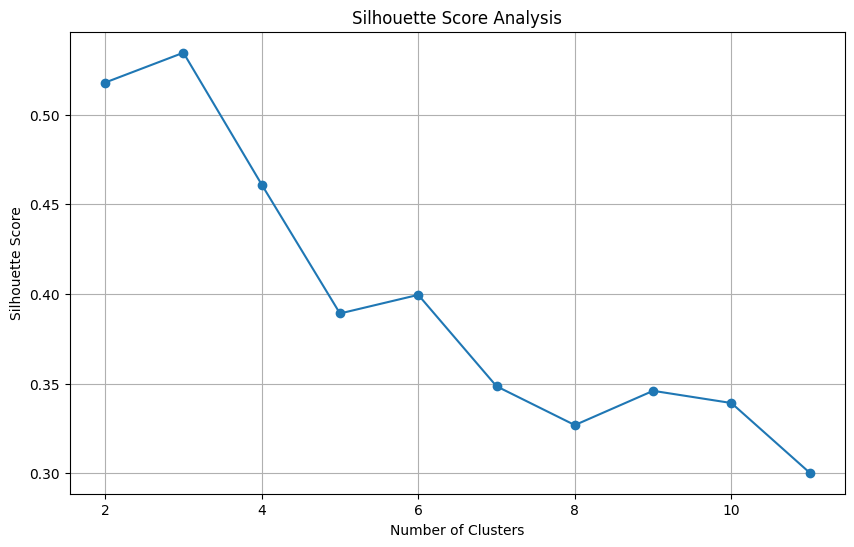

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

silhouette_scores = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    cluster_labels = kmeans.fit_predict(df_significant_scaled)

    silhouette_avg = silhouette_score(df_significant_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

    print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")

plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Analysis')
plt.grid(True)
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
cluster_labels = kmeans.fit_predict(df_significant_scaled)

df_year['Cluster2'] = cluster_labels

silhouette_avg = silhouette_score(df_significant_scaled, cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")

cluster_summary = df_year.groupby('Cluster')[significant_columns].mean()
print("Summary of variables for each cluster:")
print(cluster_summary)

Silhouette Score: 0.5178135197856595
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             6.895652  15.906522  31.465217
1             5.818421  11.792105  35.005263


In [ ]:
from matplotlib.colors import ListedColormap

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1033: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return self.fit(X, sample_weight=sample_weight).labels_


Error processing Year 2005: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

Year: 2008
Silhouette Score: 0.4472477407137351
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0             14.350000  32.793750  30.474065
1             12.338095  26.738095  30.474065
2             16.120000  42.240000  30.474065




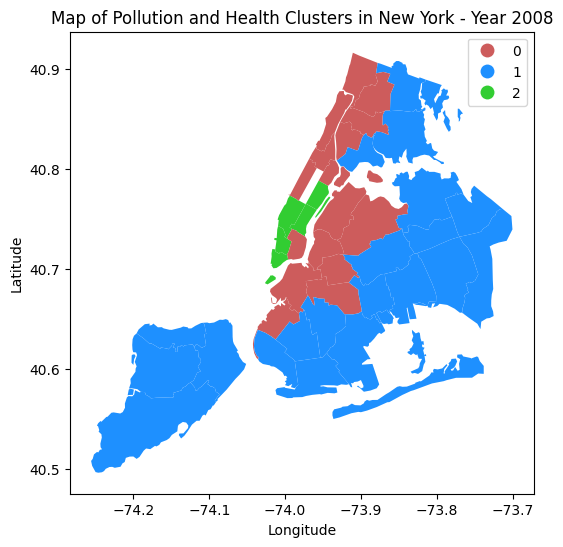

Year: 2009
Silhouette Score: 0.45919017413535396
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              9.870175  20.640351  27.857895
1             11.209259  26.483333  25.141667
2             13.306667  36.253333  20.480000




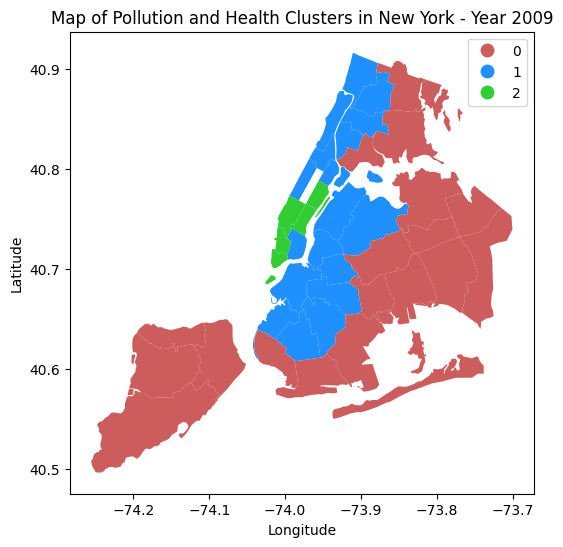

Year: 2010
Silhouette Score: 0.45818799734202953
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0             10.912698  21.228571  34.390476
1             14.026667  35.113333  26.500000
2             12.358333  26.477083  31.387500




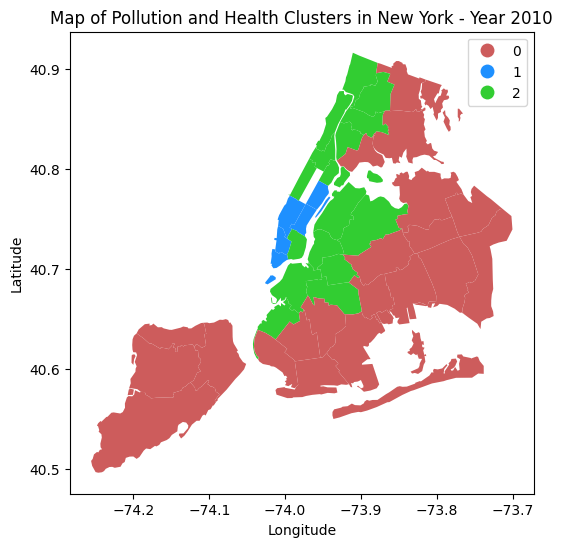

Year: 2011
Silhouette Score: 0.4518946268975532
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              9.877273  19.380303  33.759091
1             12.566667  32.611111  25.416667
2             11.188095  24.619048  30.971429




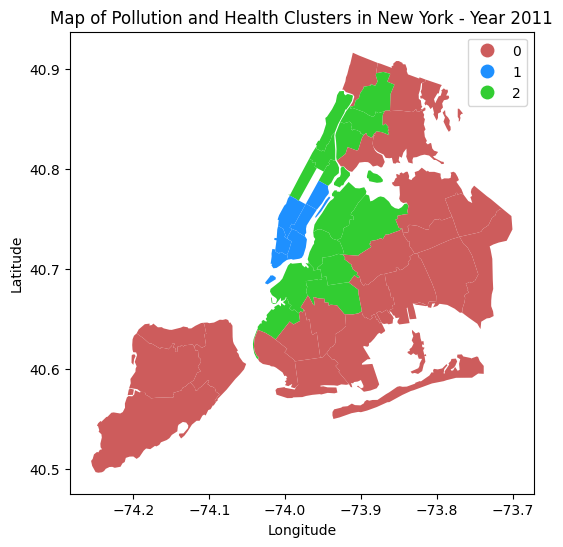

Year: 2012
Silhouette Score: 0.4411600838717834
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              9.544928  18.697101  34.456522
1             12.472222  31.677778  27.000000
2             10.851282  23.851282  32.392308




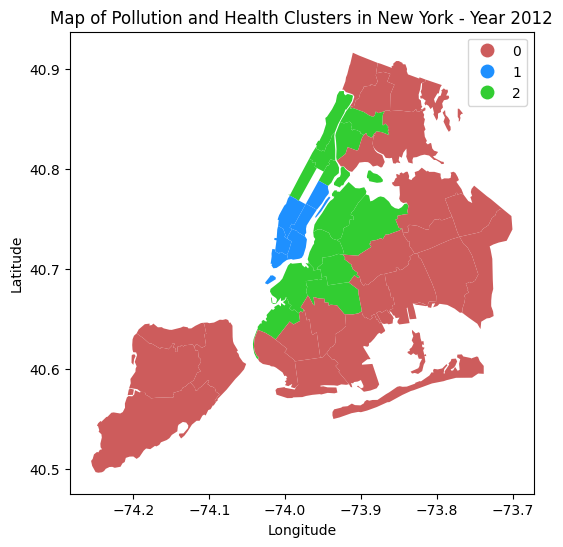

Year: 2013
Silhouette Score: 0.45501833827195554
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0             11.174359  23.958974  29.369231
1             12.955556  31.333333  24.483333
2              9.891304  19.218841  31.569565




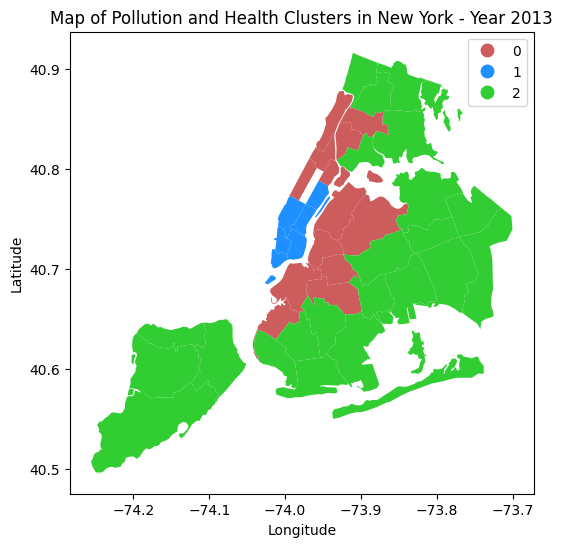

Year: 2014
Silhouette Score: 0.4435472551543842
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              8.520635  17.931746  31.976190
1             11.372222  28.727778  25.633333
2              9.782222  21.886667  29.946667




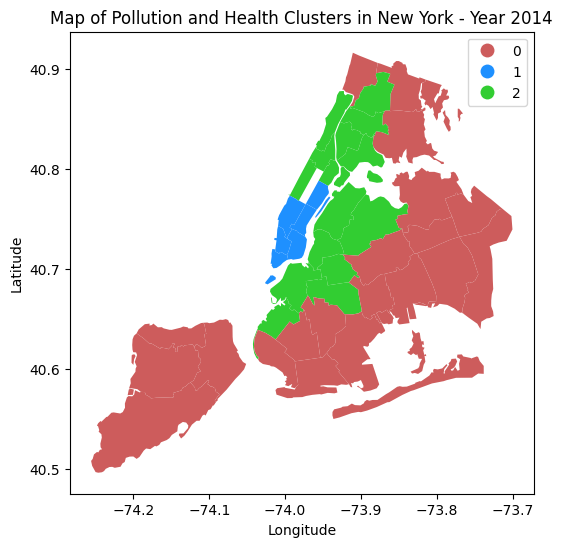

Year: 2015
Silhouette Score: 0.4300099593384649
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              8.218519  16.974074  32.666667
1             10.755556  26.777778  26.900000
2              9.470370  20.705556  30.216667




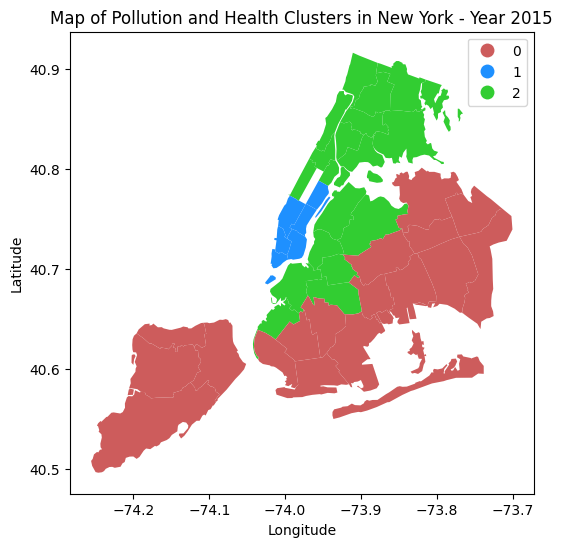

Year: 2016
Silhouette Score: 0.43699600857029935
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             7.525397  17.449206  34.228571
1             9.744444  26.950000  29.383333
2             8.573333  21.417778  32.466667




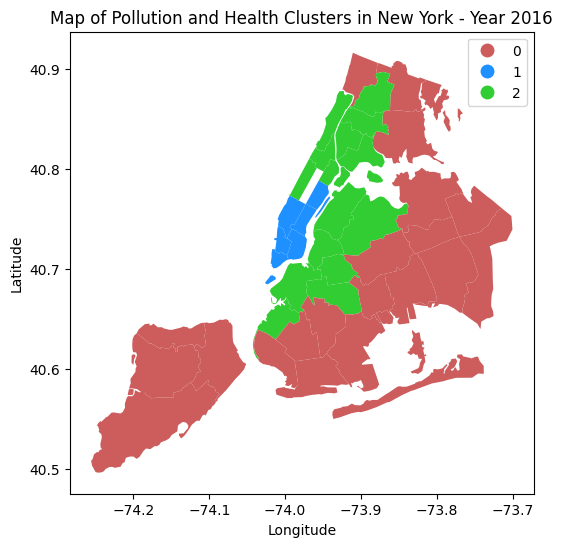

Year: 2017
Silhouette Score: 0.421874246590463
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              7.873016  17.047619  30.195238
1             10.161111  26.861111  24.366667
2              8.984444  21.408889  28.166667




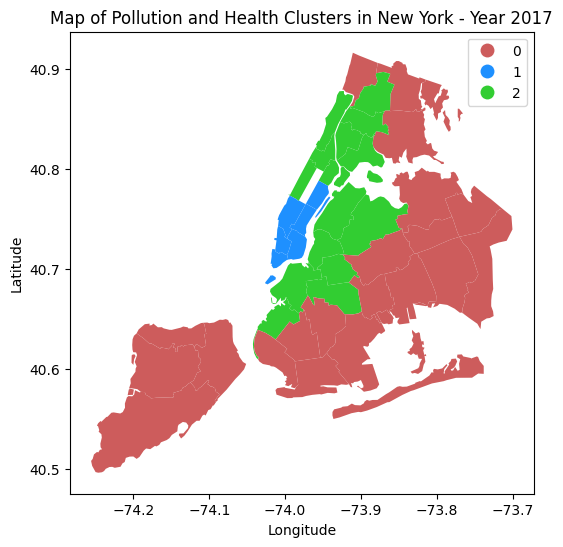

Year: 2018
Silhouette Score: 0.48075883318570384
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             8.288095  20.292857  29.321429
1             9.994444  25.166667  25.816667
2             7.227273  15.492424  31.145455




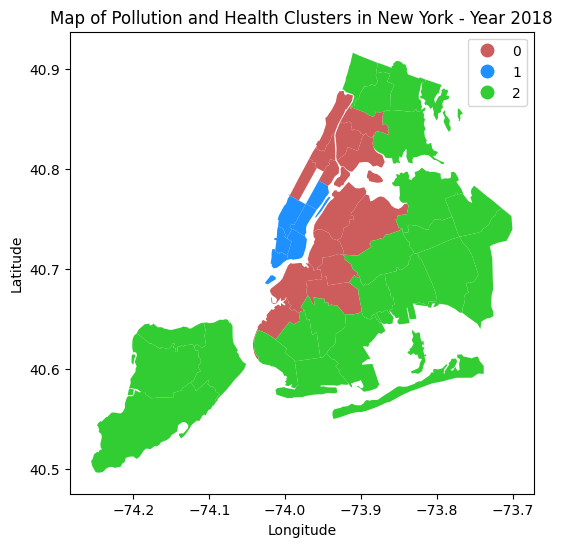

Year: 2019
Silhouette Score: 0.459134772910374
Summary of variables for each cluster:
Indicator ID        365        375        386
Cluster                                      
0              7.962500  20.806250  28.175000
1             10.226667  26.593333  24.640000
2              7.011111  16.036508  31.571429




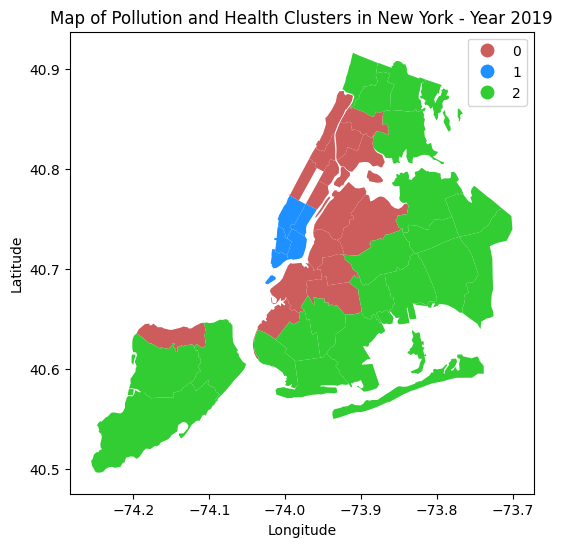

Year: 2020
Silhouette Score: 0.33649149016205676
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             7.002222  18.424444  29.766667
1             6.393939  14.848485  29.877273
2             8.166667  21.733333  28.120000




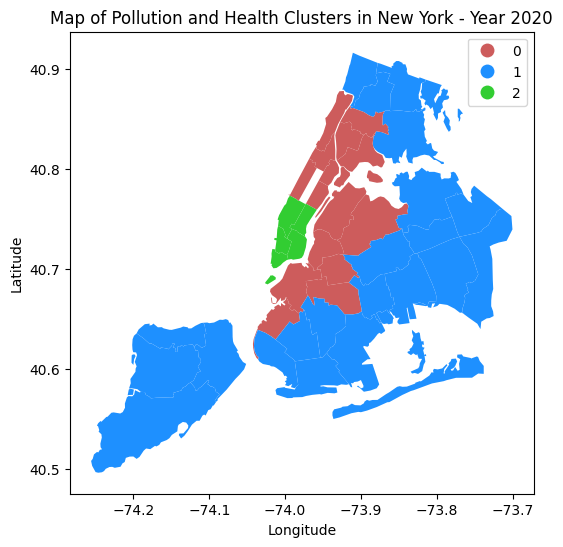

Year: 2021
Silhouette Score: 0.44239000322085076
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             7.620833  18.027083  28.818750
1             7.003333  14.831667  30.885000
2             8.811111  21.638889  27.683333




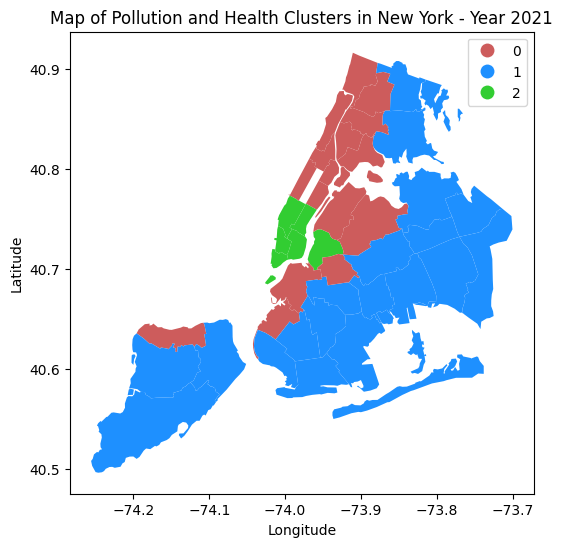

Year: 2022
Silhouette Score: 0.5344560034039635
Summary of variables for each cluster:
Indicator ID       365        375        386
Cluster                                     
0             6.686842  15.057895  31.863158
1             5.818421  11.792105  35.005263
2             7.887500  19.937500  29.575000




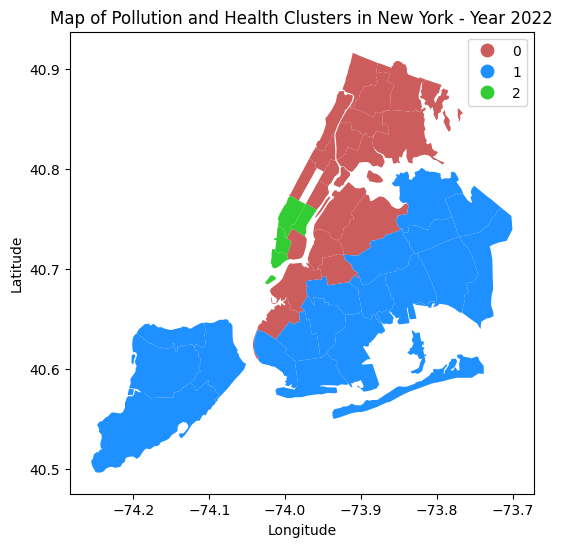

In [ ]:
significant_columns = [365, 375, 386]

years = df_pivot_reset['Year'].unique()

cluster_colors = {0: 'indianred', 1: 'dodgerblue', 2: 'limegreen'}

for year in years:
    df_year = df_pivot_reset[df_pivot_reset['Year'] == year]

    matching_names = set(df_year['Geo Place Name']).intersection(set(gdf_UHF42['GEONAME']))
    df_year = df_year[df_year['Geo Place Name'].isin(matching_names)]

    numeric_columns = [col for col in df_year.columns if col not in ['Geo Place Name', 'Year']]
    df_numeric = df_year[numeric_columns]

    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df_numeric)

    df_significant = df_year[significant_columns]
    df_significant_scaled = scaler.fit_transform(df_significant)

    try:
        kmeans = KMeans(n_clusters=3, n_init=10, random_state=42)
        cluster_labels = kmeans.fit_predict(df_significant_scaled)

        silhouette_avg = silhouette_score(df_significant_scaled, cluster_labels)
        print(f"Year: {year}")
        print(f"Silhouette Score: {silhouette_avg}")

        if silhouette_avg > 0:
            df_year['Cluster'] = cluster_labels
            cluster_summary = df_year.groupby('Cluster')[significant_columns].mean()
            print("Summary of variables for each cluster:")
            print(cluster_summary)
            print("\n")

            gdf_merged = gdf_UHF42.merge(df_year, left_on='GEONAME', right_on='Geo Place Name')

            fig, ax = plt.subplots(1, 1, figsize=(10, 6))
            cluster_colors_map = {cluster: cluster_colors[cluster] for cluster in range(len(cluster_colors))}
            gdf_merged.plot(column='Cluster', categorical=True, legend=True, cmap=ListedColormap(cluster_colors.values()), ax=ax, legend_kwds={'bbox_to_anchor': (1, 1)}, zorder=3)
            plt.title(f'Map of Pollution and Health Clusters in New York - Year {year}')
            plt.xlabel('Longitude')
            plt.ylabel('Latitude')
            plt.show()
        else:
            print(f"No valid clusters found for Year {year}. Skipping...\n")

    except ValueError as e:
        print(f"Error processing Year {year}: {e}\n")

<ipython-input-131-0fdac1164034>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_significant['Cluster'] = cluster_labels


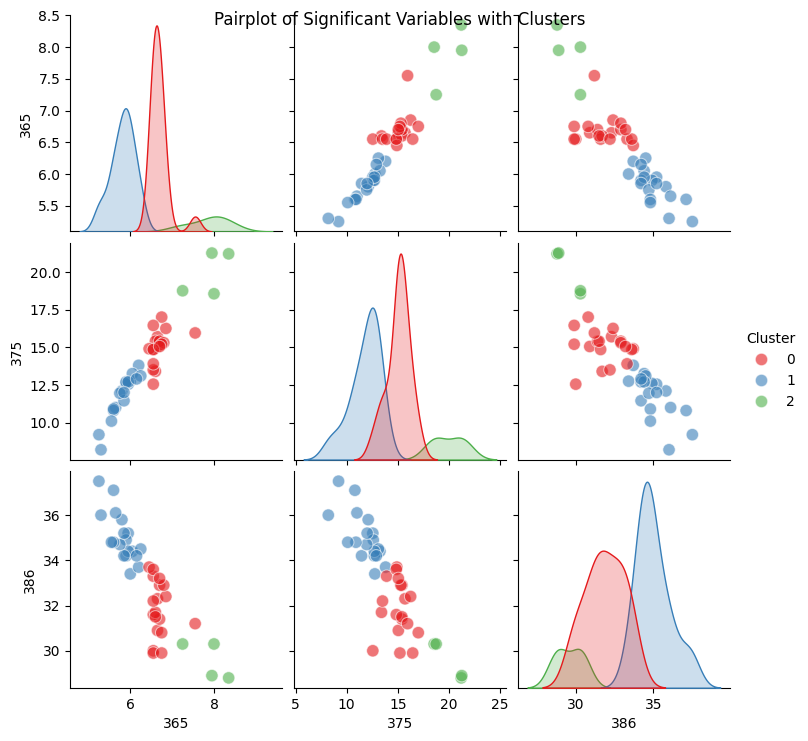

In [ ]:
df_significant['Cluster'] = cluster_labels

sns.pairplot(df_significant, hue='Cluster', palette='Set1', diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80})
plt.suptitle('Pairplot of Significant Variables with Clusters')
plt.show()

# Time series analysis

In [ ]:
df = pd.read_csv(airquality2_path)

In [ ]:
df.head()

,date,pm25,o3,no2,co
0,2024/6/1,33,54,12,2
1,2024/6/2,49,59,16,2
2,2024/6/3,62,55,17,2
3,2024/6/4,67,38,8,2
4,2024/6/5,43,31,13,2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3784 entries, 0 to 3783
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    3784 non-null   object
 1    pm25   3784 non-null   object
 2    o3     3784 non-null   object
 3    no2    3784 non-null   object
 4    co     3784 non-null   object
dtypes: object(5)
memory usage: 147.9+ KB


In [ ]:
df['date'] = pd.to_datetime(df['date'])

In [ ]:
df.sort_values(by='date', inplace=True)
df.drop_duplicates(subset=['date'], keep='last', inplace=True)

In [ ]:
print(df.columns)

Index(['date', ' pm25', ' o3', ' no2', ' co'], dtype='object')


In [ ]:
df.columns = df.columns.str.strip()

In [ ]:
df['pm25'] = pd.to_numeric(df['pm25'], errors='coerce')
df['o3'] = pd.to_numeric(df['o3'], errors='coerce')
df['no2'] = pd.to_numeric(df['no2'], errors='coerce')
df['co'] = pd.to_numeric(df['co'], errors='coerce')

In [ ]:
print(df)

           date  pm25    o3   no2   co
3682 2014-01-01  57.0   NaN   NaN  NaN
3683 2014-01-02  46.0   NaN   NaN  NaN
3684 2014-01-03  55.0   NaN   NaN  NaN
3685 2014-01-04  56.0   NaN   NaN  NaN
3686 2014-01-05  68.0   NaN   NaN  NaN
...         ...   ...   ...   ...  ...
14   2024-06-15  36.0  38.0   7.0  1.0
15   2024-06-16  29.0  42.0  11.0  1.0
16   2024-06-17  38.0  41.0  13.0  2.0
17   2024-06-18  45.0  32.0   NaN  1.0
18   2024-06-19  28.0   NaN   NaN  NaN

[3784 rows x 5 columns]


In [ ]:
def calculate_aqi_pm25(pm25):
    breakpoints = [0, 12.0, 35.5, 55.5, 150.5, 250.5, 350.5, 500.5]
    AQI = [0, 50, 100, 150, 200, 300, 400, 500]

    for i in range(len(breakpoints) - 1):
        if breakpoints[i] <= pm25 <= breakpoints[i + 1]:
            aqi = ((AQI[i + 1] - AQI[i]) / (breakpoints[i + 1] - breakpoints[i])) * (pm25 - breakpoints[i]) + AQI[i]
            return round(aqi)

    if pm25 > 500.5:
        return 500
    else:
        return 0

In [ ]:
df['AQI'] = df['pm25'].apply(calculate_aqi_pm25)

In [ ]:
print(df)

           date  pm25    o3   no2   co  AQI
3682 2014-01-01  57.0   NaN   NaN  NaN  151
3683 2014-01-02  46.0   NaN   NaN  NaN  126
3684 2014-01-03  55.0   NaN   NaN  NaN  149
3685 2014-01-04  56.0   NaN   NaN  NaN  150
3686 2014-01-05  68.0   NaN   NaN  NaN  157
...         ...   ...   ...   ...  ...  ...
14   2024-06-15  36.0  38.0   7.0  1.0  101
15   2024-06-16  29.0  42.0  11.0  1.0   86
16   2024-06-17  38.0  41.0  13.0  2.0  106
17   2024-06-18  45.0  32.0   NaN  1.0  124
18   2024-06-19  28.0   NaN   NaN  NaN   84

[3784 rows x 6 columns]


In [ ]:
bins = [0, 50, 100, 150, 200, 300, 500]
labels = ['Good', 'Moderate', 'Unhealthy for sensitive groups', 'Unhealthy', 'Very unhealthy', 'Hazardous']

df['AQI_Category'] = pd.cut(df['AQI'], bins=bins, labels=labels, right=False)

print(df)

           date  pm25    o3   no2   co  AQI                    AQI_Category
3682 2014-01-01  57.0   NaN   NaN  NaN  151                       Unhealthy
3683 2014-01-02  46.0   NaN   NaN  NaN  126  Unhealthy for sensitive groups
3684 2014-01-03  55.0   NaN   NaN  NaN  149  Unhealthy for sensitive groups
3685 2014-01-04  56.0   NaN   NaN  NaN  150                       Unhealthy
3686 2014-01-05  68.0   NaN   NaN  NaN  157                       Unhealthy
...         ...   ...   ...   ...  ...  ...                             ...
14   2024-06-15  36.0  38.0   7.0  1.0  101  Unhealthy for sensitive groups
15   2024-06-16  29.0  42.0  11.0  1.0   86                        Moderate
16   2024-06-17  38.0  41.0  13.0  2.0  106  Unhealthy for sensitive groups
17   2024-06-18  45.0  32.0   NaN  1.0  124  Unhealthy for sensitive groups
18   2024-06-19  28.0   NaN   NaN  NaN   84                        Moderate

[3784 rows x 7 columns]


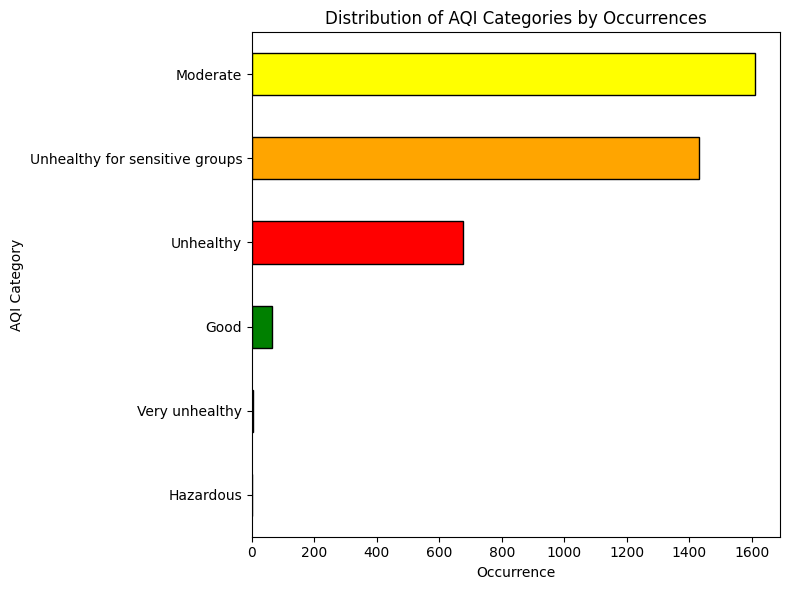

In [ ]:
colors = {
    'Good': 'green',
    'Moderate': 'yellow',
    'Unhealthy for sensitive groups': 'orange',
    'Unhealthy': 'red',
    'Very unhealthy': 'purple',
    'Hazardous': 'maroon'
}

category_counts = df['AQI_Category'].value_counts()

category_counts_sorted = category_counts.sort_values(ascending=True)

plt.figure(figsize=(8, 6))
category_counts_sorted.plot(kind='barh', color=[colors[cat] for cat in category_counts_sorted.index], edgecolor='black')
plt.title('Distribution of AQI Categories by Occurrences')
plt.xlabel('Occurrence')
plt.ylabel('AQI Category')
plt.tight_layout()
plt.show()

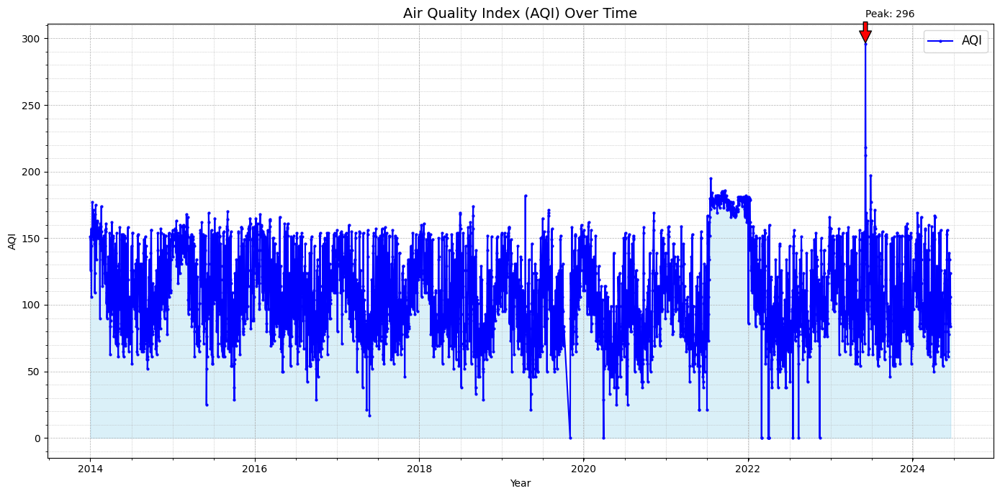

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df['date'], df['AQI'], marker='o', markersize=2, linestyle='-', color='blue', label='AQI')
plt.fill_between(df['date'], df['AQI'], color='skyblue', alpha=0.3)
plt.xlabel('Year', fontsize=10)
plt.ylabel('AQI', fontsize=10)
plt.title('Air Quality Index (AQI) Over Time', fontsize=14)
plt.legend(loc='upper right', fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', linewidth='0.5')

peak_aqi = df[df['AQI'] == df['AQI'].max()]
for index, row in peak_aqi.iterrows():
    plt.annotate(f"Peak: {row['AQI']}", xy=(row['date'], row['AQI']), xytext=(row['date'], row['AQI'] + 20),
                 arrowprops=dict(facecolor='red', shrink=0.03))

plt.tight_layout()
plt.show()

In [ ]:
print(df.head())
print(df.info())
print(df.describe())

           date  pm25  o3  no2  co  AQI                    AQI_Category
3682 2014-01-01  57.0 NaN  NaN NaN  151                       Unhealthy
3683 2014-01-02  46.0 NaN  NaN NaN  126  Unhealthy for sensitive groups
3684 2014-01-03  55.0 NaN  NaN NaN  149  Unhealthy for sensitive groups
3685 2014-01-04  56.0 NaN  NaN NaN  150                       Unhealthy
3686 2014-01-05  68.0 NaN  NaN NaN  157                       Unhealthy
<class 'pandas.core.frame.DataFrame'>
Index: 3784 entries, 3682 to 18
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          3784 non-null   datetime64[ns]
 1   pm25          3772 non-null   float64       
 2   o3            1516 non-null   float64       
 3   no2           1499 non-null   float64       
 4   co            1302 non-null   float64       
 5   AQI           3784 non-null   int64         
 6   AQI_Category  3784 non-null   category      
dtypes: category

In [ ]:
df

,date,pm25,o3,no2,co,AQI,AQI_Category
3682,2014-01-01,57.0,NaN,NaN,NaN,151,Unhealthy
3683,2014-01-02,46.0,NaN,NaN,NaN,126,Unhealthy for sensitive groups
3684,2014-01-03,55.0,NaN,NaN,NaN,149,Unhealthy for sensitive groups
3685,2014-01-04,56.0,NaN,NaN,NaN,150,Unhealthy
3686,2014-01-05,68.0,NaN,NaN,NaN,157,Unhealthy
...,...,...,...,...,...,...,...
14,2024-06-15,36.0,38.0,7.0,1.0,101,Unhealthy for sensitive groups
15,2024-06-16,29.0,42.0,11.0,1.0,86,Moderate
16,2024-06-17,38.0,41.0,13.0,2.0,106,Unhealthy for sensitive groups
17,2024-06-18,45.0,32.0,NaN,1.0,124,Unhealthy for sensitive groups


In [ ]:
df.to_csv('air_qualityAQI.csv')

In [ ]:
df = pd.read_csv('/content/air_qualityAQI.csv')

In [ ]:
df.drop(columns=['Unnamed: 0'], inplace=True)

KeyError: "['Unnamed: 0'] not found in axis"

In [ ]:
print(df.head())
print(df.info())
print(df.describe())

         date  pm25  o3  no2  co    AQI                    AQI_Category
0  2014-01-01  57.0 NaN  NaN NaN  151.0                       Unhealthy
1  2014-01-02  46.0 NaN  NaN NaN  126.0  Unhealthy for sensitive groups
2  2014-01-03  55.0 NaN  NaN NaN  149.0  Unhealthy for sensitive groups
3  2014-01-04  56.0 NaN  NaN NaN  150.0                       Unhealthy
4  2014-01-05  68.0 NaN  NaN NaN  157.0                       Unhealthy
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3823 entries, 0 to 3822
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          3823 non-null   object 
 1   pm25          3772 non-null   float64
 2   o3            1516 non-null   float64
 3   no2           1499 non-null   float64
 4   co            1302 non-null   float64
 5   AQI           3784 non-null   float64
 6   AQI_Category  3784 non-null   object 
dtypes: float64(5), object(2)
memory usage: 209.2+ KB
None
              pm

In [ ]:
print(df.shape)

(3823, 7)


In [ ]:
df['date'] = pd.to_datetime(df['date'])

In [ ]:
df.set_index('date', inplace=True)

In [ ]:
df = df.asfreq('D')

In [ ]:
print(df.isna().sum())

pm25              51
o3              2307
no2             2324
co              2521
AQI               39
AQI_Category      39
dtype: int64


In [ ]:
df_imputer = df[['pm25', 'o3', 'no2', 'co', 'AQI']]
print(df_imputer)

            pm25    o3   no2   co    AQI
date                                    
2014-01-01  57.0   NaN   NaN  NaN  151.0
2014-01-02  46.0   NaN   NaN  NaN  126.0
2014-01-03  55.0   NaN   NaN  NaN  149.0
2014-01-04  56.0   NaN   NaN  NaN  150.0
2014-01-05  68.0   NaN   NaN  NaN  157.0
...          ...   ...   ...  ...    ...
2024-06-15  36.0  38.0   7.0  1.0  101.0
2024-06-16  29.0  42.0  11.0  1.0   86.0
2024-06-17  38.0  41.0  13.0  2.0  106.0
2024-06-18  45.0  32.0   NaN  1.0  124.0
2024-06-19  28.0   NaN   NaN  NaN   84.0

[3823 rows x 5 columns]


In [ ]:
imputer = KNNImputer(n_neighbors=5)
df_imputed = pd.DataFrame(imputer.fit_transform(df_imputer), columns=df_imputer.columns, index=df_imputer.index)

print("Null values after imputation:")
print(df_imputed.isnull().sum())

Null values after imputation:
pm25    0
o3      0
no2     0
co      0
AQI     0
dtype: int64


In [ ]:
print(df_imputed.describe())

              pm25           o3          no2           co          AQI
count  3823.000000  3823.000000  3823.000000  3823.000000  3823.000000
mean     41.689979    79.797922    13.040462     2.091663   109.562632
std      21.404036   102.088053     5.078046     0.734133    34.637599
min       4.000000     1.000000     1.000000     1.000000     0.000000
25%      27.000000    27.800000    10.000000     1.800000    82.000000
50%      39.000000    35.600000    12.400000     2.000000   109.000000
75%      50.000000   116.800000    15.000000     2.400000   136.000000
max     247.000000   500.000000    44.000000     8.000000   296.000000


<ipython-input-82-bf4ce1b9002c>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


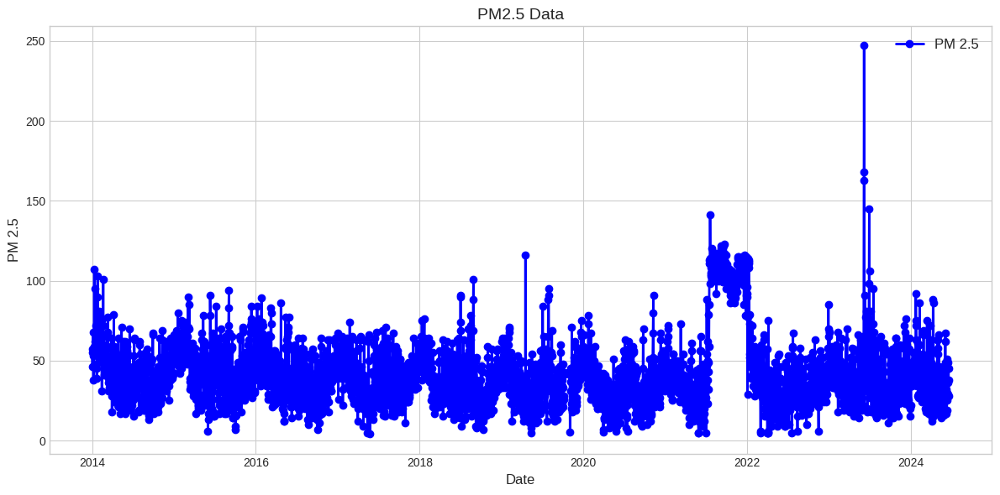

In [ ]:
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')
plt.plot(df_imputed.index, df_imputed['pm25'], marker='o', linestyle='-', color='b', linewidth=2, markersize=6, label='PM 2.5')
plt.title('PM2.5 Data', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('PM 2.5', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='best', fontsize=12)
plt.tight_layout()
plt.show()

<ipython-input-83-7b8de6f5dc37>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


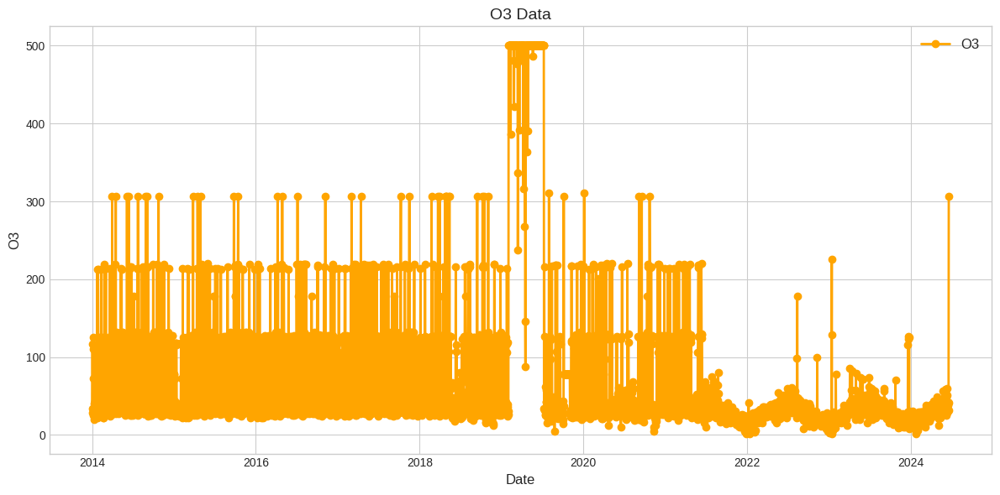

In [ ]:
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-whitegrid')
plt.plot(df_imputed.index, df_imputed['o3'], color='orange', label='O3', marker='o', linestyle='-', linewidth=2, markersize=6)
plt.title('O3 Data', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('O3', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='best', fontsize=12)
plt.tight_layout()
plt.show()

## Facebook Prophet Prediction

DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/cu7p_p68.json


Forecast for PM 2.5:


DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/nxhgmjxh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16071', 'data', 'file=/tmp/tmpue08vflw/cu7p_p68.json', 'init=/tmp/tmpue08vflw/nxhgmjxh.json', 'output', 'file=/tmp/tmpue08vflw/prophet_modelddfcy7h7/prophet_model-20240628083454.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:34:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:34:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1200x600 with 0 Axes>

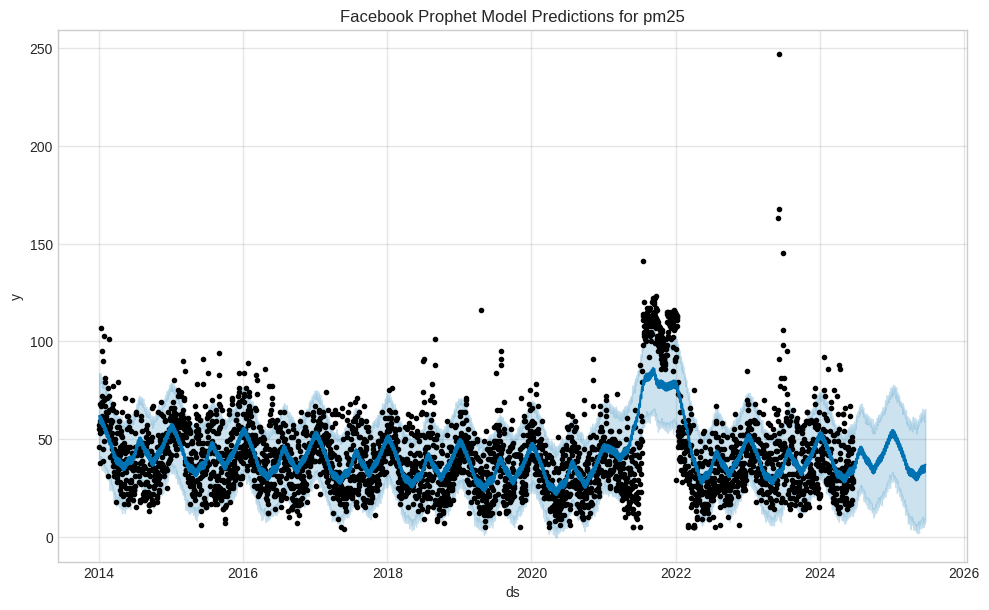

DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/99pfexm3.json


Forecast for O3:


DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/8uix1pca.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85806', 'data', 'file=/tmp/tmpue08vflw/99pfexm3.json', 'init=/tmp/tmpue08vflw/8uix1pca.json', 'output', 'file=/tmp/tmpue08vflw/prophet_modelpeqa9myd/prophet_model-20240628083501.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:35:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:35:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1200x600 with 0 Axes>

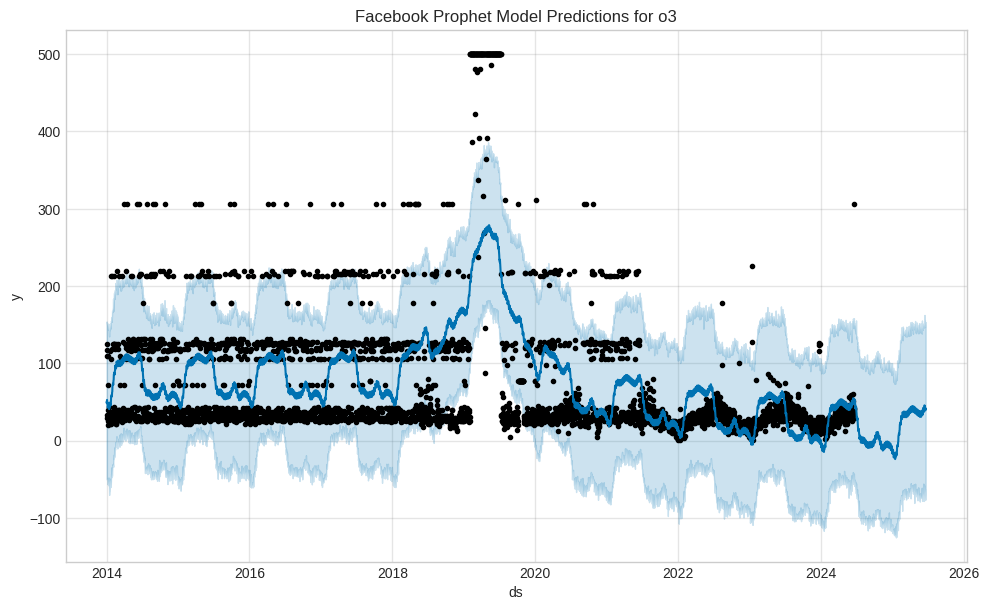

DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/g5og0pbv.json


Forecast for AQI:


DEBUG:cmdstanpy:input tempfile: /tmp/tmpue08vflw/6u9lb731.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45747', 'data', 'file=/tmp/tmpue08vflw/g5og0pbv.json', 'init=/tmp/tmpue08vflw/6u9lb731.json', 'output', 'file=/tmp/tmpue08vflw/prophet_modelykmp2cto/prophet_model-20240628083503.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:35:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:35:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1200x600 with 0 Axes>

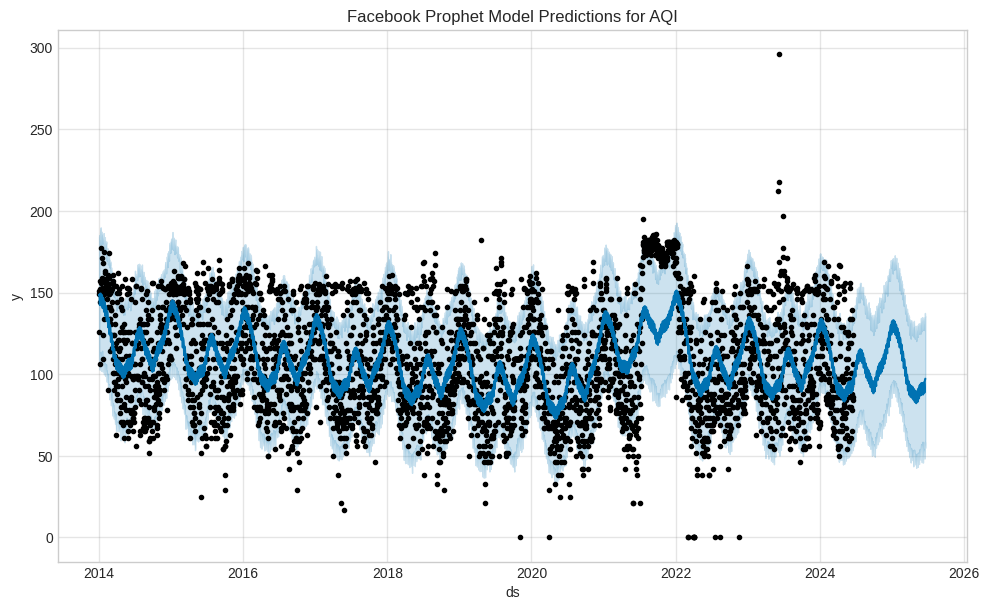

In [ ]:
def create_prophet_model(series, column_name):
    prophet_data = series.reset_index().rename(columns={'date': 'ds', column_name: 'y'})

    model = Prophet(daily_seasonality=True)
    model.fit(prophet_data)

    future = model.make_future_dataframe(periods=365)

    forecast = model.predict(future)

    plt.figure(figsize=(12, 6))
    model.plot(forecast)
    plt.title(f'Facebook Prophet Model Predictions for {column_name}')
    plt.show()

    return model, forecast

print("Forecast for PM 2.5:")
pm25_series = df_imputed['pm25']
pm25_model, pm25_forecast = create_prophet_model(pm25_series, 'pm25')

print("Forecast for O3:")
o3_series = df_imputed['o3']
o3_model, o3_forecast = create_prophet_model(o3_series, 'o3')

print("Forecast for AQI:")
AQI_series = df_imputed['AQI']
AQI_model, AQI_forecast = create_prophet_model(AQI_series, 'AQI')

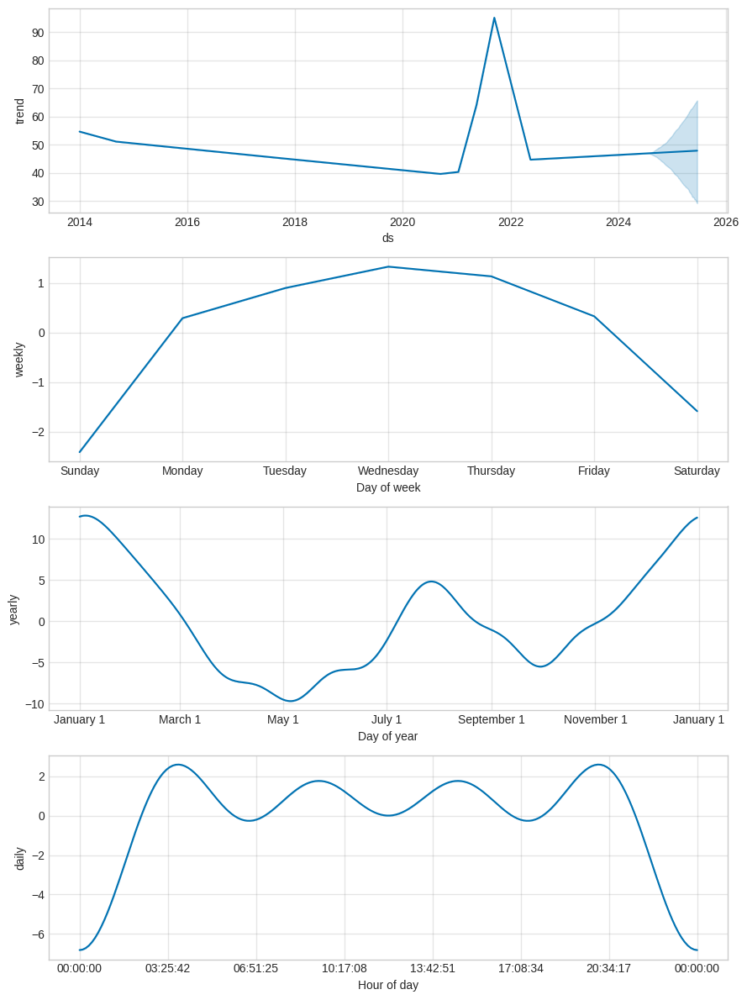

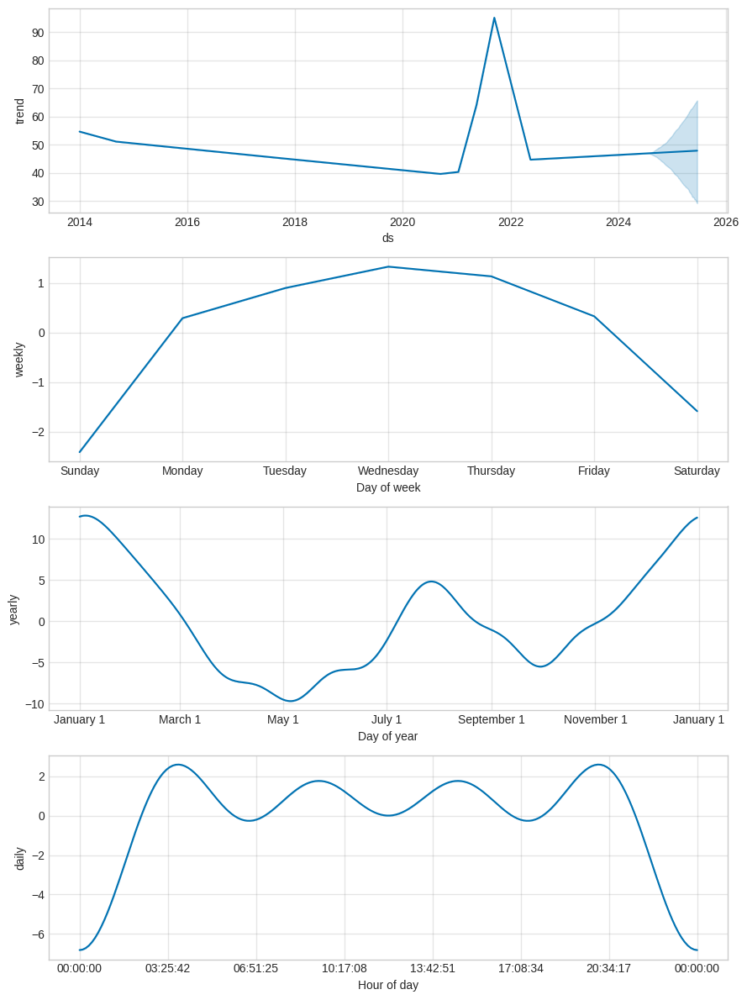

In [ ]:
pm25_model.plot_components(pm25_forecast)

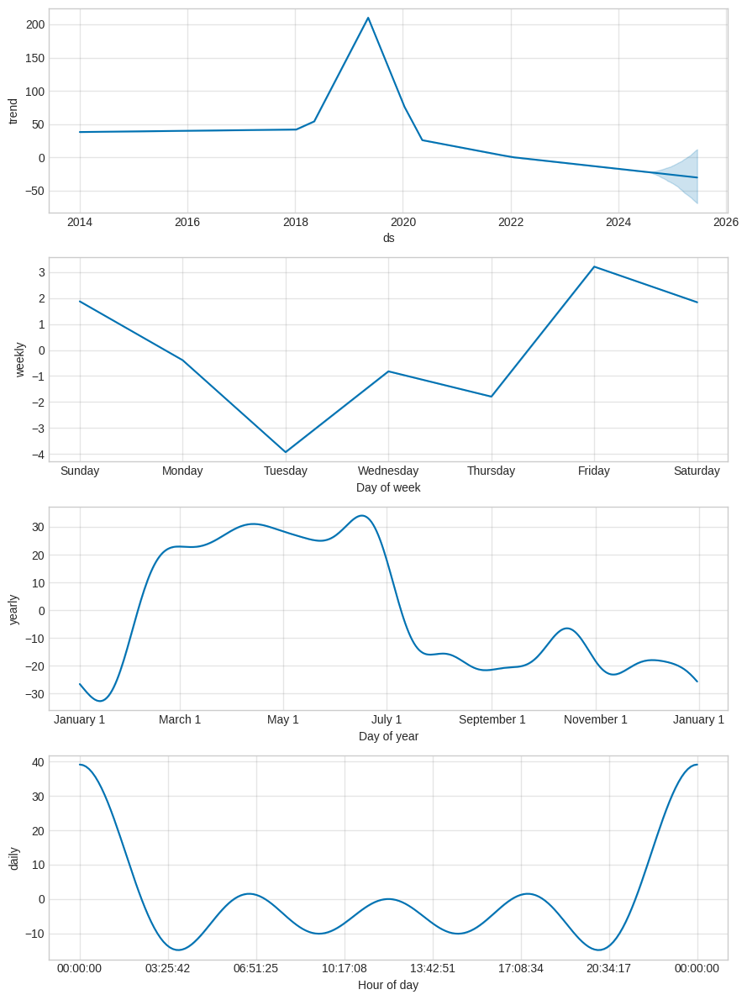

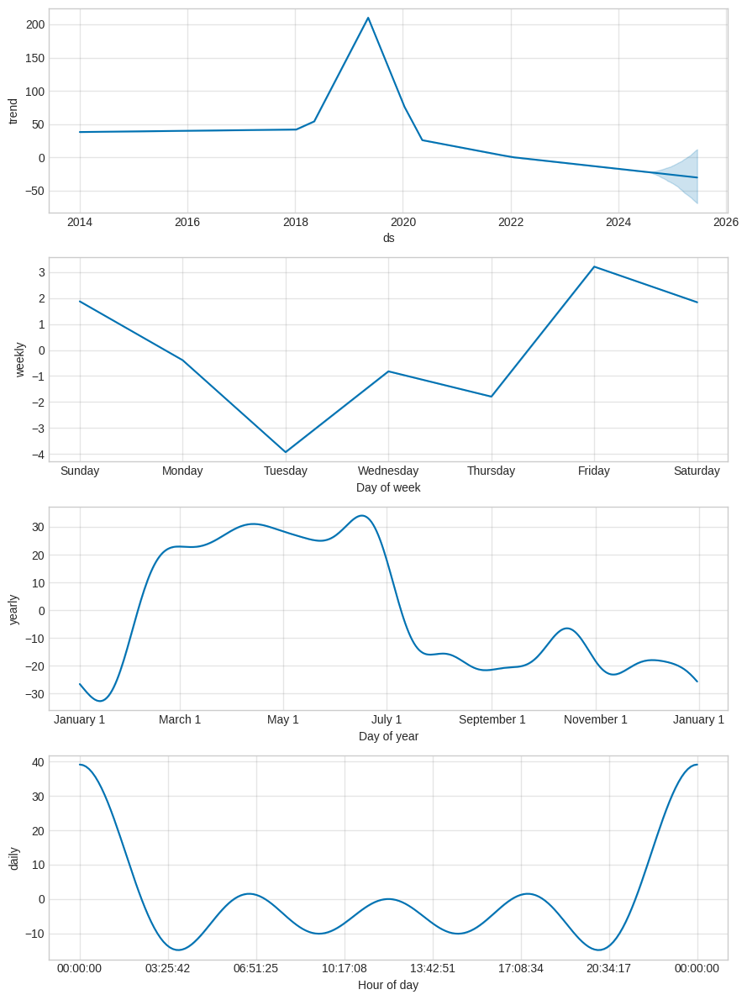

In [ ]:
o3_model.plot_components(o3_forecast)

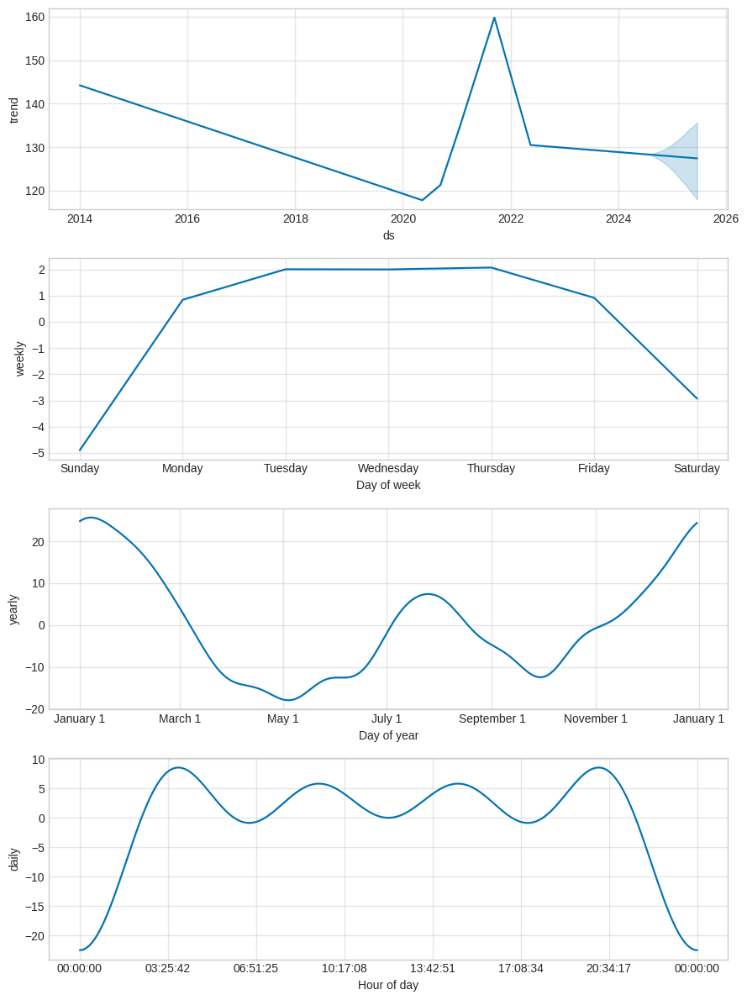

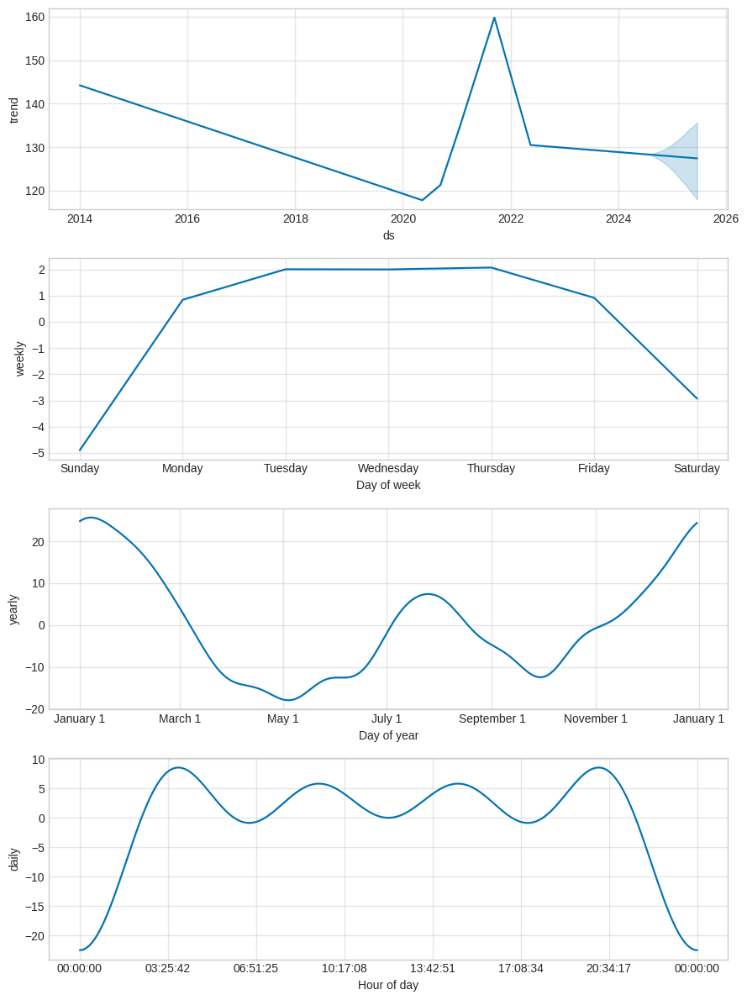

In [ ]:
AQI_model.plot_components(AQI_forecast)

In [ ]:
pm25_predictions = pm25_forecast['yhat'].tail(365)
pm25_true = pm25_series[-365:]

mae_pm25 = mean_absolute_error(pm25_true, pm25_predictions)
mse_pm25 = mean_squared_error(pm25_true, pm25_predictions)
rmse_pm25 = np.sqrt(mse_pm25)

print(f"MAE for PM 2.5: {mae_pm25:.2f}")
print(f"MSE for PM 2.5: {mse_pm25:.2f}")
print(f"RMSE for PM 2.5: {rmse_pm25:.2f}")

o3_predictions = o3_forecast['yhat'].tail(365)
o3_true = o3_series[-365:]

mae_o3 = mean_absolute_error(o3_true, o3_predictions)
mse_o3 = mean_squared_error(o3_true, o3_predictions)
rmse_o3 = np.sqrt(mse_o3)

print(f"MAE for O3: {mae_o3:.2f}")
print(f"MSE for O3: {mse_o3:.2f}")
print(f"RMSE for O3: {rmse_o3:.2f}")

MAE for PM 2.5: 13.90
MSE for PM 2.5: 318.29
RMSE for PM 2.5: 17.84
MAE for O3: 23.03
MSE for O3: 1020.51
RMSE for O3: 31.95


In [ ]:
AQI_predictions = AQI_forecast['yhat'].tail(365)
AQI_true = AQI_series[-365:]

mae_AQI = mean_absolute_error(AQI_true, AQI_predictions)
mse_AQI = mean_squared_error(AQI_true, AQI_predictions)
rmse_AQI = np.sqrt(mse_AQI)

print(f"MAE for AQI: {mae_AQI:.2f}")
print(f"MSE for AQI: {mse_AQI:.2f}")
print(f"RMSE for AQI: {rmse_AQI:.2f}")

MAE for AQI: 26.93
MSE for AQI: 1065.50
RMSE for AQI: 32.64


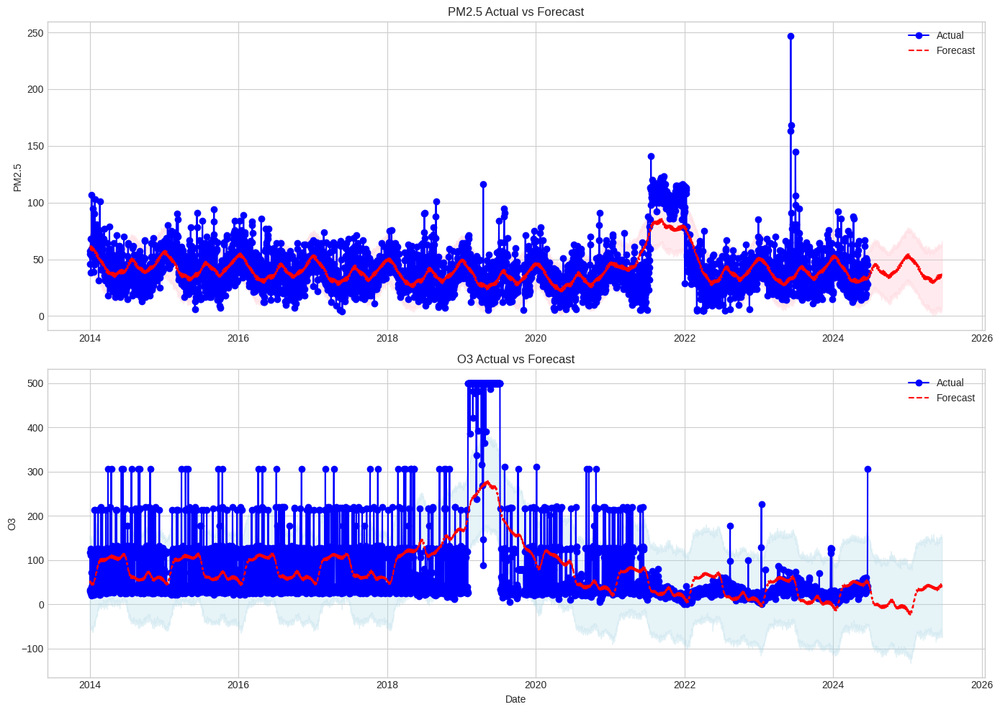

In [ ]:
plt.figure(figsize=(14, 10))

# Plot for PM2.5
plt.subplot(2, 1, 1)
plt.plot(pm25_series.index, pm25_series, marker='o', color='b', label='Actual')
plt.plot(pm25_forecast['ds'], pm25_forecast['yhat'], linestyle='--', color='r', label='Forecast')
plt.fill_between(pm25_forecast['ds'], pm25_forecast['yhat_lower'], pm25_forecast['yhat_upper'], color='pink', alpha=0.3)
plt.title('PM2.5 Actual vs Forecast')
plt.ylabel('PM2.5')
plt.legend()

# Plot for O3
plt.subplot(2, 1, 2)
plt.plot(o3_series.index, o3_series, marker='o', color='b', label='Actual')
plt.plot(o3_forecast['ds'], o3_forecast['yhat'], linestyle='--', color='r', label='Forecast')
plt.fill_between(o3_forecast['ds'], o3_forecast['yhat_lower'], o3_forecast['yhat_upper'], color='lightblue', alpha=0.3)
plt.title('O3 Actual vs Forecast')
plt.xlabel('Date')
plt.ylabel('O3')
plt.legend()

plt.tight_layout()
plt.show()


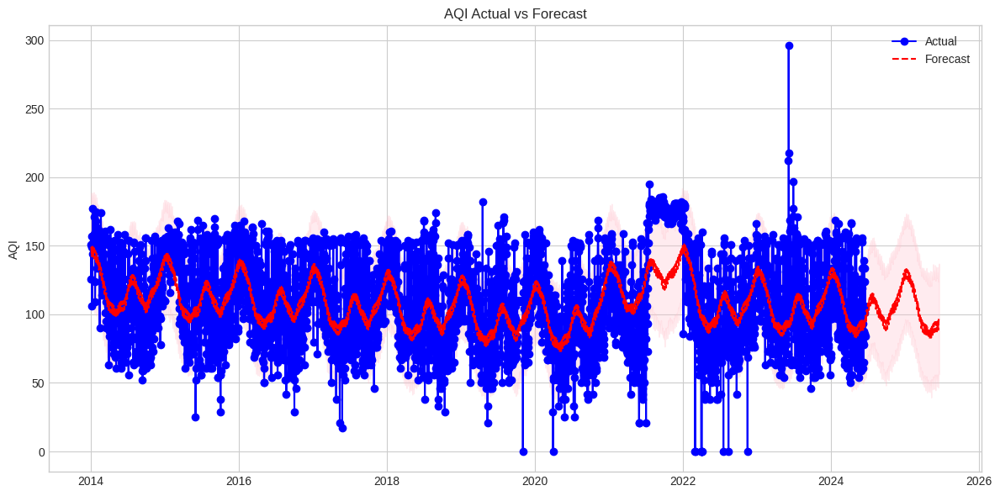

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(AQI_series.index, AQI_series, marker='o', color='b', label='Actual')
plt.plot(AQI_forecast['ds'], AQI_forecast['yhat'], linestyle='--', color='r', label='Forecast')
plt.fill_between(AQI_forecast['ds'], AQI_forecast['yhat_lower'], AQI_forecast['yhat_upper'], color='pink', alpha=0.3)
plt.title('AQI Actual vs Forecast')
plt.ylabel('AQI')
plt.legend()
plt.tight_layout()
plt.show()